# BCRT / CRT‑2 — Camera‑Ready Analyses

This notebook renders **naïve sample first**, then **full sample**, for each analysis:

1. **IRT (2PL)**: ICC / IIC / TIF
2. **Reliability (KR‑20) & NFC correlations**
3. **LIWC regressions by family** (effect sizes with adjusted significance markers)
4. **Naïve vs Full summaries**

*Outputs are dataset‑tagged to avoid overwrites.*

In [1]:
from pathlib import Path
import pandas as pd, numpy as np, matplotlib.pyplot as plt
from IPython.display import display, Image
import os

# Check working directory
print(f"Current working directory: {os.getcwd()}")

# Notebook is running from reports/ directory, so we need to go up one level
BASE   = Path('..')
TABLES = BASE/'reports'/'tables'
FIGS   = BASE/'reports'/'figures'

NAIVE_FIG = FIGS/'irt2pl'/'naive'
FULL_FIG  = FIGS/'irt2pl'/'full'
NAIVE_TAB = TABLES/'naive'
FULL_TAB  = TABLES/'full'

# Verify key directories exist
print(f"Reports directory exists: {(BASE/'reports').exists()}")
print(f"Naive figures directory exists: {NAIVE_FIG.exists()}")
print(f"Naive tables directory exists: {NAIVE_TAB.exists()}")

def exists(p: Path):
    ok = p.exists()
    print(('✓' if ok else '✗'), p)
    return ok

def show_images(paths):
    for p in paths:
        if p.exists():
            display(Image(filename=str(p)))
        else:
            print('Missing:', p)


Current working directory: /Users/sionmarcanthony/Desktop/phd/bcrt_analysis/bcrt-validation-fixed-v6/reports
Reports directory exists: True
Naive figures directory exists: True
Naive tables directory exists: True


## 1. IRT (2PL): ICC / IIC / TIF

### 1.1 Naïve sample

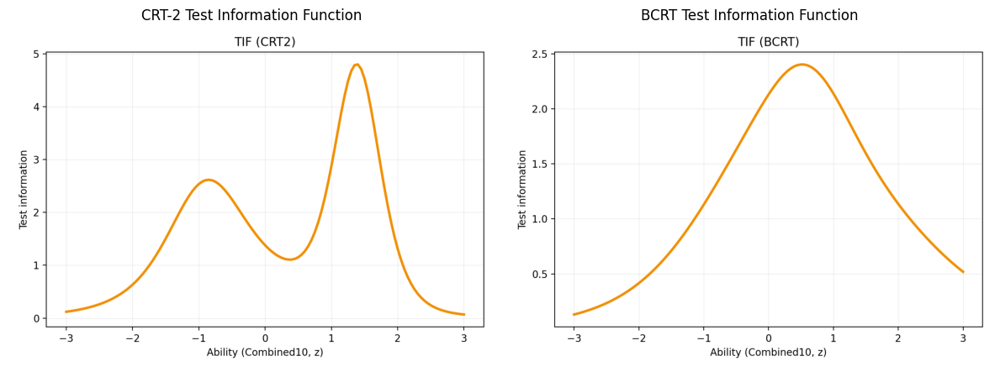

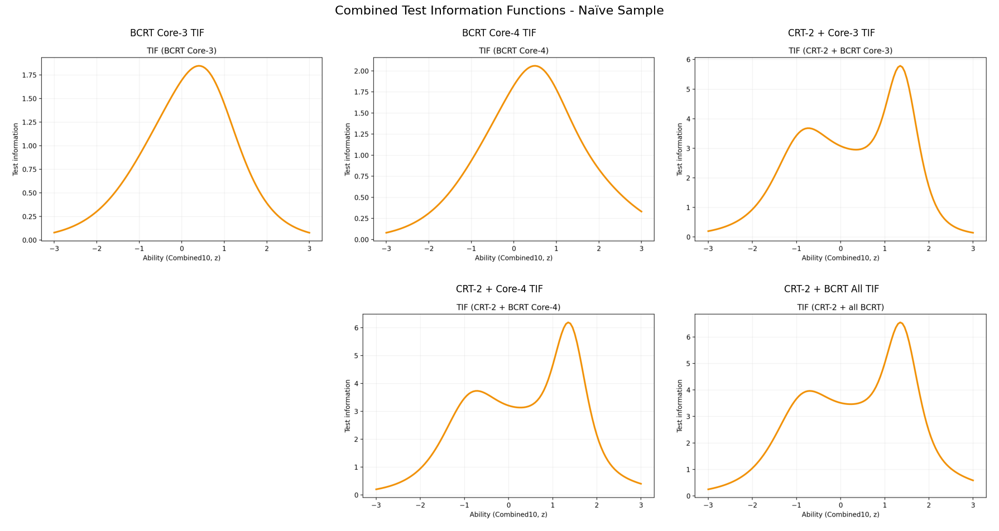

TIF Interpretation: Test Information Functions show where each test provides most measurement precision across the ability spectrum. Higher peaks indicate better discrimination at those ability levels. CRT-2 typically shows bimodal information; BCRT may provide more uniform coverage.


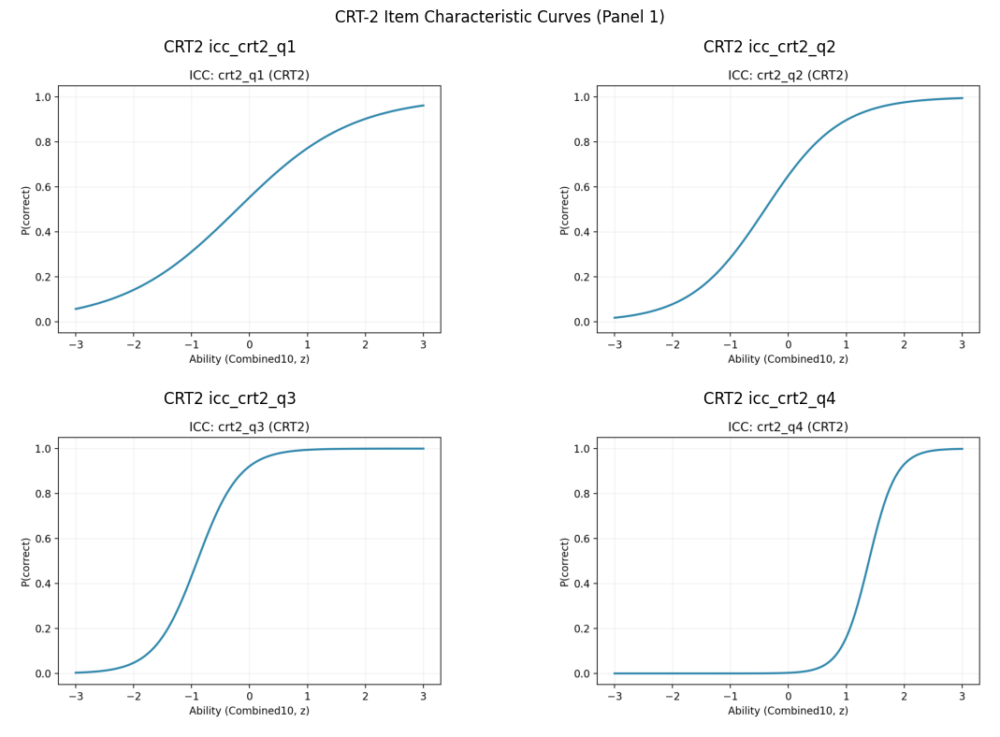

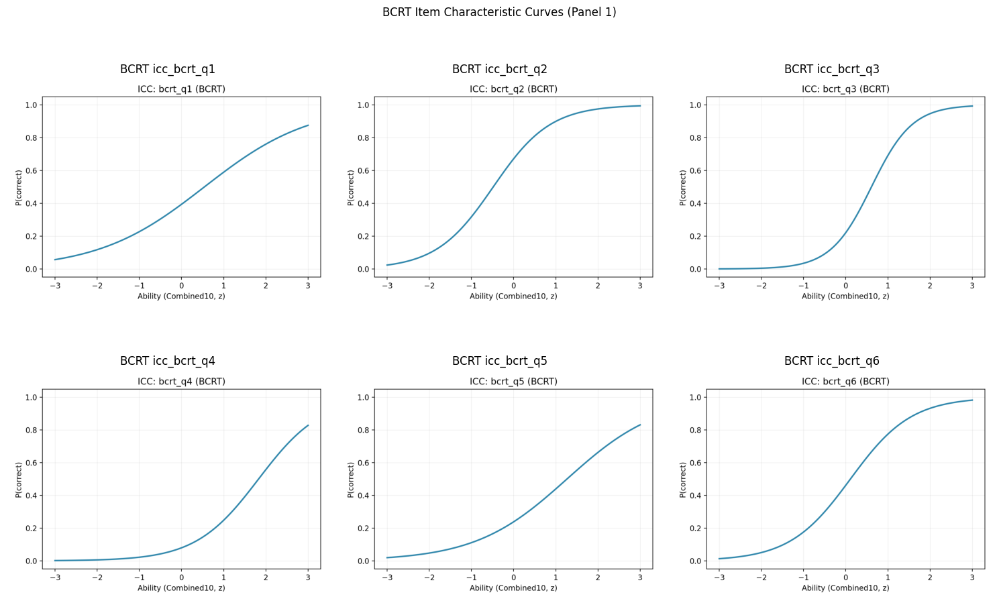

ICC Interpretation: Item Characteristic Curves show the probability of correct response as a function of ability. Steeper curves indicate better discrimination; horizontal position indicates item difficulty. S-shaped curves are ideal for 2PL models.


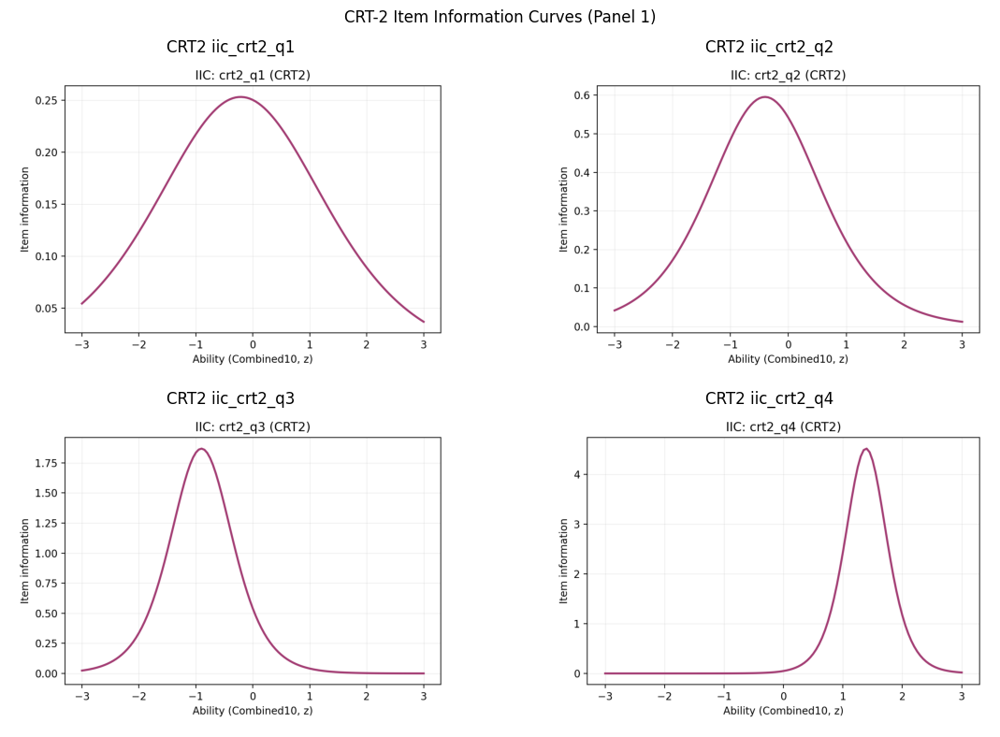

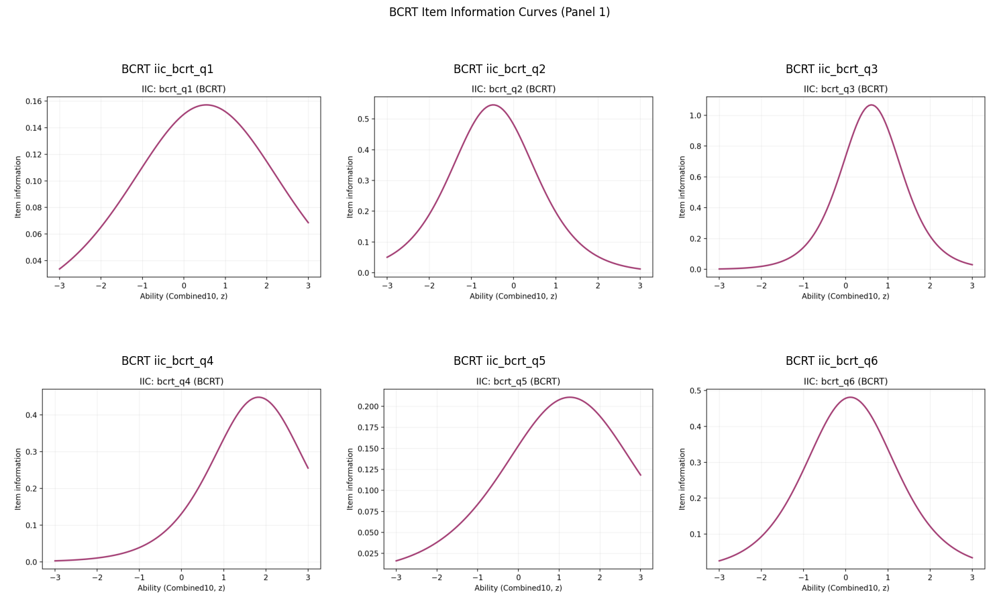

IIC Interpretation: Item Information Curves show how much information each item contributes across the ability spectrum. Peak height indicates maximum discrimination; peak location indicates where the item is most informative. Items with higher, narrower peaks provide more precise measurement at specific ability levels.
✓ ../reports/tables/naive/irt2pl_crt2.csv


,item_id,n,p_correct,beta0,beta1,se_beta0,se_beta1,a_hat,b_hat
0,crt2_q1,52,0.538462,0.214567,1.006589,0.308936,0.370578,0.592111,-0.213162
1,crt2_q2,52,0.596154,0.621718,1.543359,0.355606,0.482711,0.907858,-0.402835
2,crt2_q3,52,0.769231,2.466290,2.733383,0.698208,0.808795,1.607873,-0.902285
3,crt2_q4,52,0.115385,-5.906353,4.251776,2.473641,1.902066,2.501045,1.389150


✓ ../reports/tables/naive/irt2pl_bcrt.csv


,item_id,n,p_correct,beta0,beta1,se_beta0,se_beta1,a_hat,b_hat
0,bcrt_q1,52,0.403846,-0.429391,0.793019,0.303321,0.331758,0.466482,0.541464
1,bcrt_q2,52,0.615385,0.715012,1.477074,0.358141,0.472063,0.868867,-0.484073
2,bcrt_q3,52,0.307692,-1.258590,2.066461,0.435187,0.590334,1.215565,0.609056
3,bcrt_q4,52,0.134615,-2.446735,1.339475,0.601023,0.504056,0.787926,1.826638
4,bcrt_q5,52,0.269231,-1.160462,0.918298,0.356941,0.363636,0.540175,1.263710
5,bcrt_q6,52,0.461538,-0.153177,1.387816,0.325918,0.434093,0.816363,0.110373


In [2]:
# TIFs — naïve (display in two panels)

# Panel 1: Basic TIFs (CRT-2 and BCRT side by side)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

tif_crt2 = NAIVE_FIG/'tif_crt2.png'
tif_bcrt = NAIVE_FIG/'tif_bcrt.png'

if tif_crt2.exists():
    img1 = plt.imread(tif_crt2)
    ax1.imshow(img1)
    ax1.set_title('CRT-2 Test Information Function')
    ax1.axis('off')
else:
    ax1.text(0.5, 0.5, 'Missing: tif_crt2.png', ha='center', va='center')
    ax1.set_title('CRT-2 TIF (Missing)')

if tif_bcrt.exists():
    img2 = plt.imread(tif_bcrt)
    ax2.imshow(img2)
    ax2.set_title('BCRT Test Information Function')
    ax2.axis('off')
else:
    ax2.text(0.5, 0.5, 'Missing: tif_bcrt.png', ha='center', va='center')
    ax2.set_title('BCRT TIF (Missing)')

plt.tight_layout()
plt.show()

# Panel 2: Combined/subset TIFs (3x2 layout)
subset_files = [
    ('tif_bcrt_core3.png', 'BCRT Core-3'),
    ('tif_bcrt_core4.png', 'BCRT Core-4'),
    ('tif_crt2_plus_core3.png', 'CRT-2 + Core-3'),
    ('tif_crt2_plus_core4.png', 'CRT-2 + Core-4'),
    ('tif_crt2_plus_bcrt_all.png', 'CRT-2 + BCRT All')
]

fig = plt.figure(figsize=(18, 10))

for i, (filename, title) in enumerate(subset_files):
    if i < 3:
        # Top row: positions 1, 2, 3
        ax = plt.subplot(2, 3, i + 1)
    else:
        # Bottom row: positions 2, 3 (centered)
        ax = plt.subplot(2, 3, i + 2)
    
    tif_path = NAIVE_FIG / filename
    if tif_path.exists():
        img = plt.imread(tif_path)
        ax.imshow(img)
        ax.set_title(f'{title} TIF')
        ax.axis('off')
    else:
        ax.text(0.5, 0.5, f'Missing: {filename}', ha='center', va='center')
        ax.set_title(f'{title} (Missing)')

plt.suptitle('Combined Test Information Functions - Naïve Sample', fontsize=16)
plt.tight_layout()
plt.show()

print("TIF Interpretation: Test Information Functions show where each test provides most measurement precision across the ability spectrum. Higher peaks indicate better discrimination at those ability levels. CRT-2 typically shows bimodal information; BCRT may provide more uniform coverage.")

# ICC figures - CRT2 items (2x2 panels)
crt2_icc_files = sorted(NAIVE_FIG.glob('icc_crt2_*.png'))
if crt2_icc_files:
    n_files = len(crt2_icc_files)
    n_panels = (n_files + 3) // 4  # Round up to nearest panel of 4
    
    for panel in range(n_panels):
        start_idx = panel * 4
        end_idx = min(start_idx + 4, n_files)
        panel_files = crt2_icc_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'CRT2 {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 4):
            axes[i].axis('off')
        
        plt.suptitle(f'CRT-2 Item Characteristic Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

# ICC figures - BCRT items (3x2 panels)
bcrt_icc_files = sorted(NAIVE_FIG.glob('icc_bcrt_*.png'))
if bcrt_icc_files:
    n_files = len(bcrt_icc_files)
    n_panels = (n_files + 5) // 6  # Round up to nearest panel
    
    for panel in range(n_panels):
        start_idx = panel * 6
        end_idx = min(start_idx + 6, n_files)
        panel_files = bcrt_icc_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'BCRT {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 6):
            axes[i].axis('off')
        
        plt.suptitle(f'BCRT Item Characteristic Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

print("ICC Interpretation: Item Characteristic Curves show the probability of correct response as a function of ability. Steeper curves indicate better discrimination; horizontal position indicates item difficulty. S-shaped curves are ideal for 2PL models.")

# IIC figures - CRT2 items (2x2 panels)
crt2_iic_files = sorted(NAIVE_FIG.glob('iic_crt2_*.png'))
if crt2_iic_files:
    n_files = len(crt2_iic_files)
    n_panels = (n_files + 3) // 4  # Round up to nearest panel of 4
    
    for panel in range(n_panels):
        start_idx = panel * 4
        end_idx = min(start_idx + 4, n_files)
        panel_files = crt2_iic_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'CRT2 {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 4):
            axes[i].axis('off')
        
        plt.suptitle(f'CRT-2 Item Information Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

# IIC figures - BCRT items (3x2 panels)
bcrt_iic_files = sorted(NAIVE_FIG.glob('iic_bcrt_*.png'))
if bcrt_iic_files:
    n_files = len(bcrt_iic_files)
    n_panels = (n_files + 5) // 6  # Round up to nearest panel
    
    for panel in range(n_panels):
        start_idx = panel * 6
        end_idx = min(start_idx + 6, n_files)
        panel_files = bcrt_iic_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'BCRT {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 6):
            axes[i].axis('off')
        
        plt.suptitle(f'BCRT Item Information Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

print("IIC Interpretation: Item Information Curves show how much information each item contributes across the ability spectrum. Peak height indicates maximum discrimination; peak location indicates where the item is most informative. Items with higher, narrower peaks provide more precise measurement at specific ability levels.")

# Item parameter tables (all rows)
for t in ['irt2pl_crt2.csv','irt2pl_bcrt.csv']:
    p = NAIVE_TAB/t
    if exists(p):
        display(pd.read_csv(p))

### 1.2 Full sample

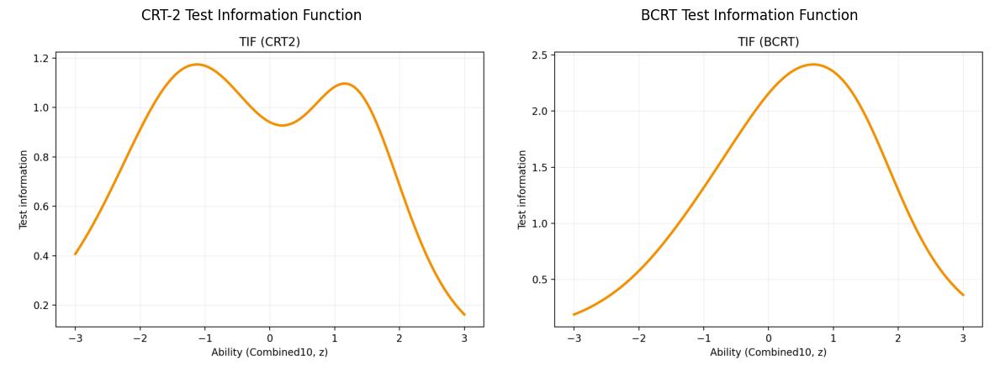

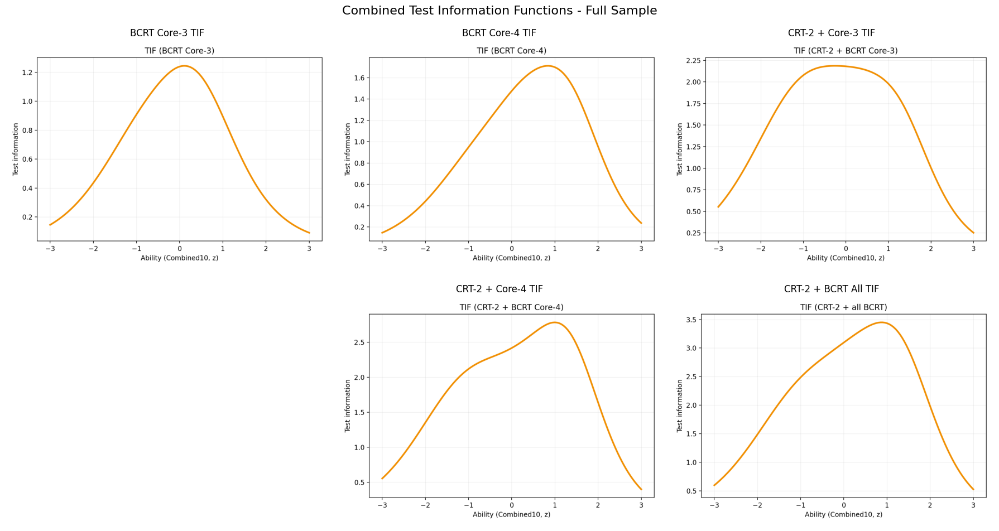

TIF Interpretation: Test Information Functions show where each test provides most measurement precision across the ability spectrum. Higher peaks indicate better discrimination at those ability levels. CRT-2 typically shows bimodal information; BCRT may provide more uniform coverage.


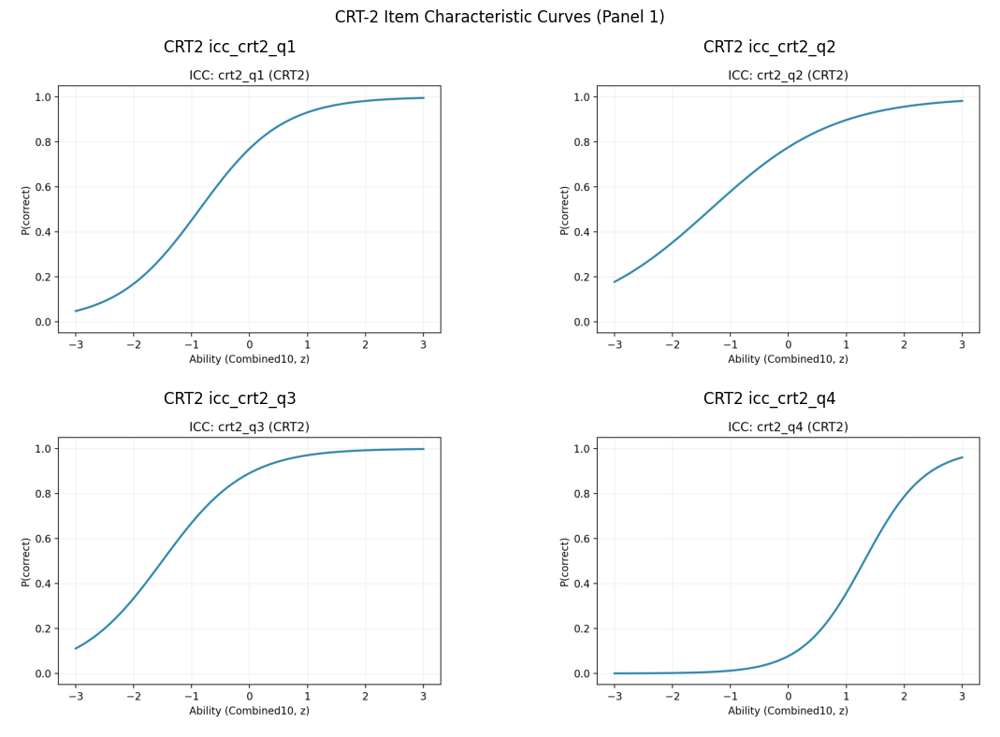

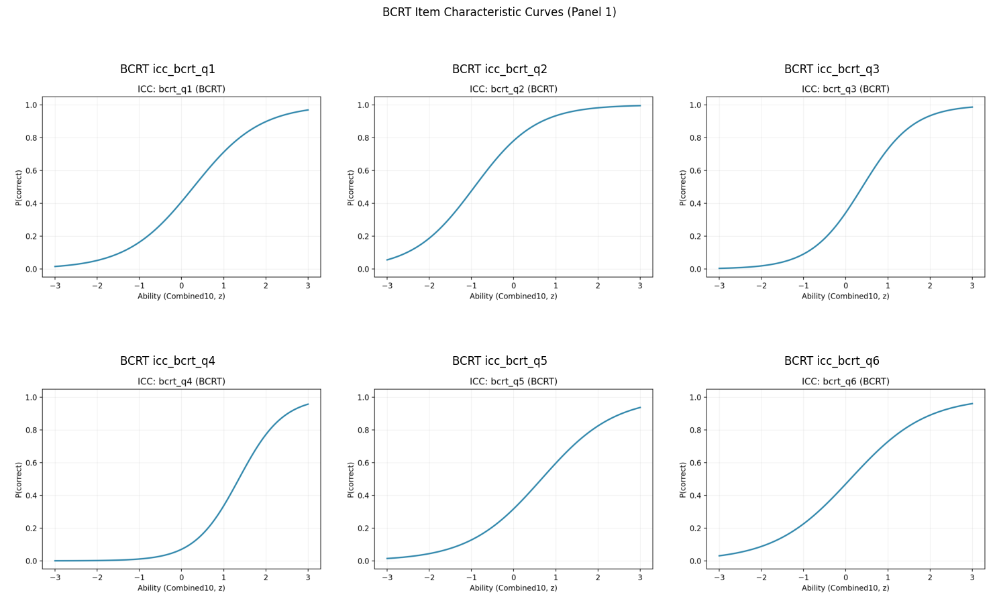

ICC Interpretation: Item Characteristic Curves show the probability of correct response as a function of ability. Steeper curves indicate better discrimination; horizontal position indicates item difficulty. S-shaped curves are ideal for 2PL models.


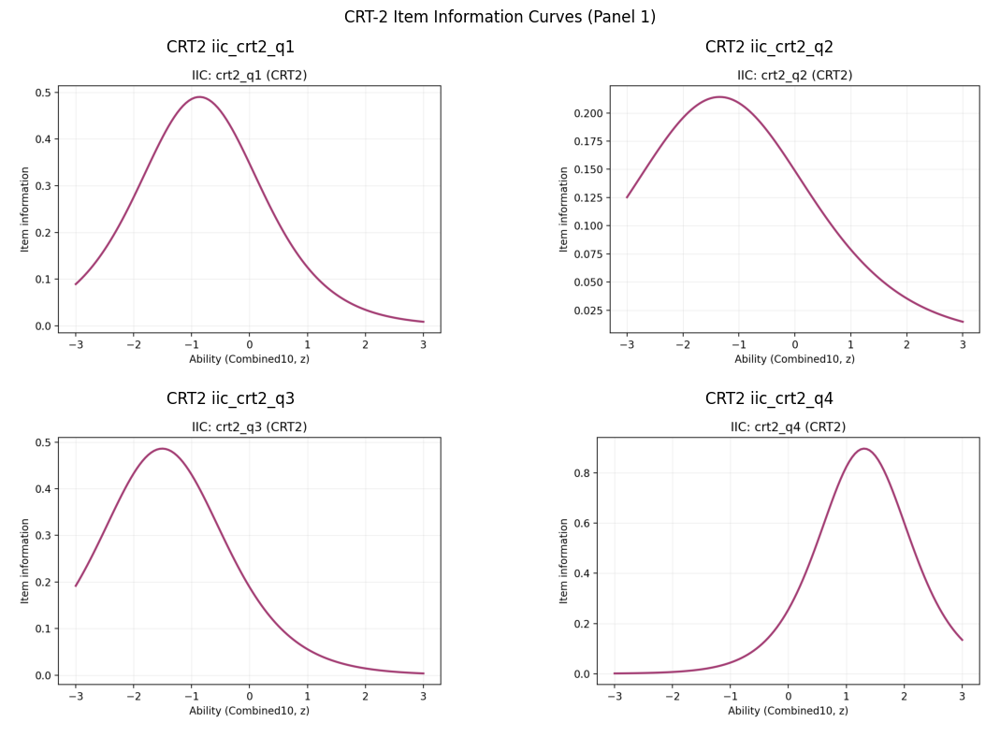

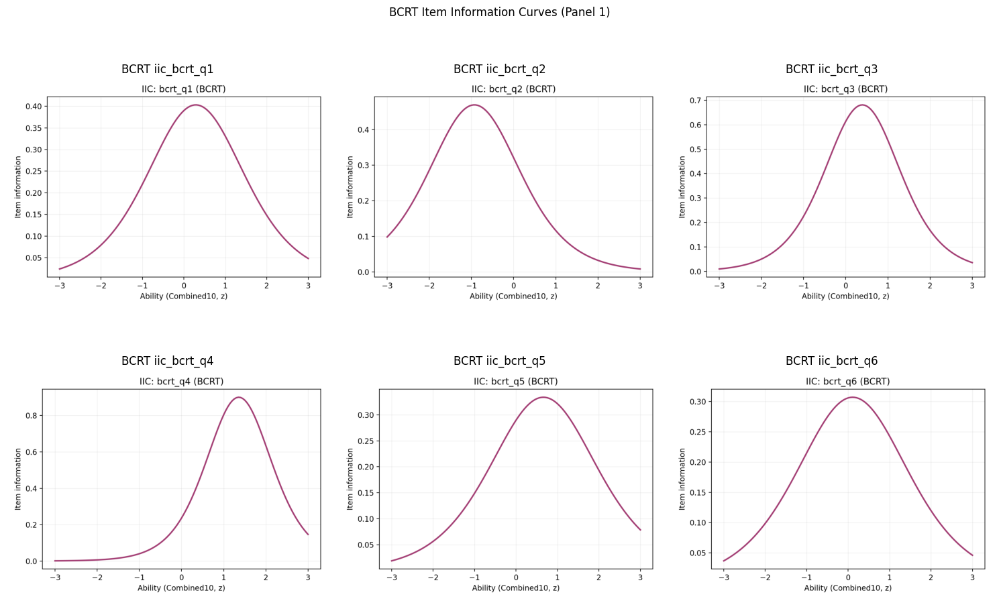

IIC Interpretation: Item Information Curves show how much information each item contributes across the ability spectrum. Peak height indicates maximum discrimination; peak location indicates where the item is most informative. Items with higher, narrower peaks provide more precise measurement at specific ability levels.
✓ ../reports/tables/full/irt2pl_crt2.csv


,item_id,n,p_correct,beta0,beta1,se_beta0,se_beta1,a_hat,b_hat
0,crt2_q1,240,0.704167,1.208977,1.400200,0.186211,0.224253,0.823647,-0.863432
1,crt2_q2,240,0.741667,1.244987,0.925586,0.172750,0.190592,0.544463,-1.345079
2,crt2_q3,240,0.829167,2.101437,1.394624,0.252535,0.262620,0.820367,-1.506812
3,crt2_q4,240,0.170833,-2.479778,1.894094,0.304842,0.284983,1.114173,1.309216


✓ ../reports/tables/full/irt2pl_bcrt.csv


,item_id,n,p_correct,beta0,beta1,se_beta0,se_beta1,a_hat,b_hat
0,bcrt_q1,240,0.425000,-0.364397,1.269820,0.151105,0.188383,0.746953,0.286967
1,bcrt_q2,240,0.716667,1.274566,1.370079,0.188846,0.223849,0.805929,-0.930287
2,bcrt_q3,240,0.383333,-0.650461,1.650211,0.166835,0.223833,0.970713,0.394169
3,bcrt_q4,240,0.162500,-2.577051,1.898240,0.316498,0.288952,1.116612,1.357600
4,bcrt_q5,240,0.350000,-0.763013,1.155756,0.157289,0.180710,0.679856,0.660185
5,bcrt_q6,240,0.470833,-0.120295,1.108366,0.145087,0.175946,0.651980,0.108534


In [3]:
# TIFs — full (display in two panels)

# Panel 1: Basic TIFs (CRT-2 and BCRT side by side)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

tif_crt2 = FULL_FIG/'tif_crt2.png'
tif_bcrt = FULL_FIG/'tif_bcrt.png'

if tif_crt2.exists():
    img1 = plt.imread(tif_crt2)
    ax1.imshow(img1)
    ax1.set_title('CRT-2 Test Information Function')
    ax1.axis('off')
else:
    ax1.text(0.5, 0.5, 'Missing: tif_crt2.png', ha='center', va='center')
    ax1.set_title('CRT-2 TIF (Missing)')

if tif_bcrt.exists():
    img2 = plt.imread(tif_bcrt)
    ax2.imshow(img2)
    ax2.set_title('BCRT Test Information Function')
    ax2.axis('off')
else:
    ax2.text(0.5, 0.5, 'Missing: tif_bcrt.png', ha='center', va='center')
    ax2.set_title('BCRT TIF (Missing)')

plt.tight_layout()
plt.show()

# Panel 2: Combined/subset TIFs (3x2 layout)
subset_files = [
    ('tif_bcrt_core3.png', 'BCRT Core-3'),
    ('tif_bcrt_core4.png', 'BCRT Core-4'),
    ('tif_crt2_plus_core3.png', 'CRT-2 + Core-3'),
    ('tif_crt2_plus_core4.png', 'CRT-2 + Core-4'),
    ('tif_crt2_plus_bcrt_all.png', 'CRT-2 + BCRT All')
]

fig = plt.figure(figsize=(18, 10))

for i, (filename, title) in enumerate(subset_files):
    if i < 3:
        # Top row: positions 1, 2, 3
        ax = plt.subplot(2, 3, i + 1)
    else:
        # Bottom row: positions 2, 3 (centered)
        ax = plt.subplot(2, 3, i + 2)
    
    tif_path = FULL_FIG / filename
    if tif_path.exists():
        img = plt.imread(tif_path)
        ax.imshow(img)
        ax.set_title(f'{title} TIF')
        ax.axis('off')
    else:
        ax.text(0.5, 0.5, f'Missing: {filename}', ha='center', va='center')
        ax.set_title(f'{title} (Missing)')

plt.suptitle('Combined Test Information Functions - Full Sample', fontsize=16)
plt.tight_layout()
plt.show()

print("TIF Interpretation: Test Information Functions show where each test provides most measurement precision across the ability spectrum. Higher peaks indicate better discrimination at those ability levels. CRT-2 typically shows bimodal information; BCRT may provide more uniform coverage.")

# ICC figures - CRT2 items (2x2 panels)
crt2_icc_files = sorted(FULL_FIG.glob('icc_crt2_*.png'))
if crt2_icc_files:
    n_files = len(crt2_icc_files)
    n_panels = (n_files + 3) // 4  # Round up to nearest panel of 4
    
    for panel in range(n_panels):
        start_idx = panel * 4
        end_idx = min(start_idx + 4, n_files)
        panel_files = crt2_icc_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'CRT2 {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 4):
            axes[i].axis('off')
        
        plt.suptitle(f'CRT-2 Item Characteristic Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

# ICC figures - BCRT items (3x2 panels)
bcrt_icc_files = sorted(FULL_FIG.glob('icc_bcrt_*.png'))
if bcrt_icc_files:
    n_files = len(bcrt_icc_files)
    n_panels = (n_files + 5) // 6  # Round up to nearest panel
    
    for panel in range(n_panels):
        start_idx = panel * 6
        end_idx = min(start_idx + 6, n_files)
        panel_files = bcrt_icc_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'BCRT {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 6):
            axes[i].axis('off')
        
        plt.suptitle(f'BCRT Item Characteristic Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

print("ICC Interpretation: Item Characteristic Curves show the probability of correct response as a function of ability. Steeper curves indicate better discrimination; horizontal position indicates item difficulty. S-shaped curves are ideal for 2PL models.")

# IIC figures - CRT2 items (2x2 panels)
crt2_iic_files = sorted(FULL_FIG.glob('iic_crt2_*.png'))
if crt2_iic_files:
    n_files = len(crt2_iic_files)
    n_panels = (n_files + 3) // 4  # Round up to nearest panel of 4
    
    for panel in range(n_panels):
        start_idx = panel * 4
        end_idx = min(start_idx + 4, n_files)
        panel_files = crt2_iic_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'CRT2 {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 4):
            axes[i].axis('off')
        
        plt.suptitle(f'CRT-2 Item Information Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

# IIC figures - BCRT items (3x2 panels)
bcrt_iic_files = sorted(FULL_FIG.glob('iic_bcrt_*.png'))
if bcrt_iic_files:
    n_files = len(bcrt_iic_files)
    n_panels = (n_files + 5) // 6  # Round up to nearest panel
    
    for panel in range(n_panels):
        start_idx = panel * 6
        end_idx = min(start_idx + 6, n_files)
        panel_files = bcrt_iic_files[start_idx:end_idx]
        
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        for i, file_path in enumerate(panel_files):
            if file_path.exists():
                img = plt.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(f'BCRT {file_path.stem}')
                axes[i].axis('off')
        
        # Hide unused subplots
        for i in range(len(panel_files), 6):
            axes[i].axis('off')
        
        plt.suptitle(f'BCRT Item Information Curves (Panel {panel+1})')
        plt.tight_layout()
        plt.show()

print("IIC Interpretation: Item Information Curves show how much information each item contributes across the ability spectrum. Peak height indicates maximum discrimination; peak location indicates where the item is most informative. Items with higher, narrower peaks provide more precise measurement at specific ability levels.")

# Item parameter tables (all rows)
for t in ['irt2pl_crt2.csv','irt2pl_bcrt.csv']:
    p = FULL_TAB/t
    if exists(p):
        display(pd.read_csv(p))

**Interpretation cue:** Compare naïve vs full TIFs. CRT‑2 typically shows a bimodal information profile; adding BCRT increases information and smooths coverage across ability. Decisions should prioritise **naïve** curves; treat **full** as a sensitivity check.

## 2. Reliability (KR‑20) and NFC correlations

### 2.1 Naïve sample

In [4]:
rel_na = TABLES/'reliability_naive.csv'
corr_na = TABLES/'correlations_totals_naive.csv'
corr_na_sig = TABLES/'correlations_totals_naive_sig.csv'
if exists(rel_na): display(pd.read_csv(rel_na))
if exists(corr_na): display(pd.read_csv(corr_na, index_col=0).round(3))
if exists(corr_na_sig):
    print('Correlation significance (naive): r, p, 95% CI, n')
    display(pd.read_csv(corr_na_sig).assign(p=lambda d: d['p'].round(6)).assign(r=lambda d: d['r'].round(3), lo=lambda d: d['lo'].round(3), hi=lambda d: d['hi'].round(3)))

✓ ../reports/tables/reliability_naive.csv


,label,k,n,KR20
0,CRT-2,4,52,0.446900
1,BCRT-6,6,52,0.449235
2,BCRT-4,4,52,0.506217
3,Combined-8,8,52,0.649071
4,Combined-10,10,52,0.643026
5,Selected (4),4,52,0.506217
6,Combined (CRT2+Selected),8,52,0.649071


✓ ../reports/tables/correlations_totals_naive.csv


,crt2_total,bcrt6_total,bcrt_core3_total,bcrt_core4_total,combined7_total,combined8_total,combined10_total,NFC_total,bcrt_selected_total,combined_selected_total
crt2_total,1.000,0.539,0.461,0.485,0.864,0.852,0.839,0.243,0.485,0.852
bcrt6_total,0.539,1.000,0.864,0.905,0.815,0.844,0.910,-0.094,0.905,0.844
bcrt_core3_total,0.461,0.864,1.000,0.956,0.845,0.832,0.785,-0.105,0.956,0.832
bcrt_core4_total,0.485,0.905,0.956,1.000,0.835,0.871,0.822,-0.065,1.000,0.871
combined7_total,0.864,0.815,0.845,0.835,1.000,0.985,0.951,0.087,0.835,0.985
combined8_total,0.852,0.844,0.832,0.871,0.985,1.000,0.964,0.098,0.871,1.000
combined10_total,0.839,0.910,0.785,0.822,0.951,0.964,1.000,0.059,0.822,0.964
NFC_total,0.243,-0.094,-0.105,-0.065,0.087,0.098,0.059,1.000,-0.065,0.098
bcrt_selected_total,0.485,0.905,0.956,1.000,0.835,0.871,0.822,-0.065,1.000,0.871
combined_selected_total,0.852,0.844,0.832,0.871,0.985,1.000,0.964,0.098,0.871,1.000


✓ ../reports/tables/correlations_totals_naive_sig.csv
Correlation significance (naive): r, p, 95% CI, n


,var_x,var_y,n,r,p,lo,hi
0,crt2_total,bcrt6_total,52,0.539,0.000038,0.312,0.708
1,crt2_total,bcrt_core3_total,52,0.461,0.000580,0.215,0.652
2,crt2_total,bcrt_core4_total,52,0.485,0.000269,0.244,0.669
3,crt2_total,combined7_total,52,0.864,0.000000,0.774,0.920
4,crt2_total,combined8_total,52,0.852,0.000000,0.755,0.913
5,crt2_total,combined10_total,52,0.839,0.000000,0.734,0.905
6,crt2_total,NFC_total,52,0.243,0.082071,-0.032,0.484
7,crt2_total,bcrt_selected_total,52,0.485,0.000269,0.244,0.669
8,crt2_total,combined_selected_total,52,0.852,0.000000,0.755,0.913
9,bcrt6_total,bcrt_core3_total,52,0.864,0.000000,0.774,0.920


### 2.2 Full sample

In [5]:
rel_full = TABLES/'reliability_full.csv'
corr_full = TABLES/'correlations_totals_full.csv'
corr_full_sig = TABLES/'correlations_totals_full_sig.csv'
if exists(rel_full): display(pd.read_csv(rel_full))
if exists(corr_full): display(pd.read_csv(corr_full, index_col=0).round(3))
if exists(corr_full_sig):
    print('Correlation significance (full): r, p, 95% CI, n')
    display(pd.read_csv(corr_full_sig).assign(p=lambda d: d['p'].round(6)).assign(r=lambda d: d['r'].round(3), lo=lambda d: d['lo'].round(3), hi=lambda d: d['hi'].round(3)))

✓ ../reports/tables/reliability_full.csv


,label,k,n,KR20
0,CRT-2,4,240,0.415842
1,BCRT-6,6,240,0.542995
2,BCRT-4,4,240,0.488135
3,Combined-8,8,240,0.540085
4,Combined-10,10,240,0.595930
5,Selected (4),4,240,0.488135
6,Combined (CRT2+Selected),8,240,0.540085


✓ ../reports/tables/correlations_totals_full.csv


,crt2_total,bcrt6_total,bcrt_core3_total,bcrt_core4_total,combined7_total,combined8_total,combined10_total,NFC_total,bcrt_selected_total,combined_selected_total
crt2_total,1.000,0.296,0.213,0.249,0.787,0.757,0.703,0.128,0.249,0.757
bcrt6_total,0.296,1.000,0.840,0.900,0.724,0.782,0.888,-0.067,0.900,0.782
bcrt_core3_total,0.213,0.840,1.000,0.952,0.771,0.767,0.728,-0.043,0.952,0.767
bcrt_core4_total,0.249,0.900,0.952,1.000,0.764,0.821,0.790,-0.051,1.000,0.821
combined7_total,0.787,0.724,0.771,0.764,1.000,0.979,0.919,0.056,0.764,0.979
combined8_total,0.757,0.782,0.767,0.821,0.979,1.000,0.947,0.041,0.821,1.000
combined10_total,0.703,0.888,0.728,0.790,0.919,0.947,1.000,0.012,0.790,0.947
NFC_total,0.128,-0.067,-0.043,-0.051,0.056,0.041,0.012,1.000,-0.051,0.041
bcrt_selected_total,0.249,0.900,0.952,1.000,0.764,0.821,0.790,-0.051,1.000,0.821
combined_selected_total,0.757,0.782,0.767,0.821,0.979,1.000,0.947,0.041,0.821,1.000


✓ ../reports/tables/correlations_totals_full_sig.csv
Correlation significance (full): r, p, 95% CI, n


,var_x,var_y,n,r,p,lo,hi
0,crt2_total,bcrt6_total,240,0.296,0.000003,0.176,0.408
1,crt2_total,bcrt_core3_total,240,0.213,0.000910,0.089,0.330
2,crt2_total,bcrt_core4_total,240,0.249,0.000099,0.126,0.364
3,crt2_total,combined7_total,240,0.787,0.000000,0.733,0.831
4,crt2_total,combined8_total,240,0.757,0.000000,0.697,0.806
5,crt2_total,combined10_total,240,0.703,0.000000,0.633,0.762
6,crt2_total,NFC_total,240,0.128,0.048382,0.001,0.250
7,crt2_total,bcrt_selected_total,240,0.249,0.000099,0.126,0.364
8,crt2_total,combined_selected_total,240,0.757,0.000000,0.697,0.806
9,bcrt6_total,bcrt_core3_total,240,0.840,0.000000,0.799,0.874


**Interpretation cue:** Expect KR‑20 to rise from CRT‑2 → BCRT‑4/6 → Combined sets. NFC’s correlation with CRT/BCRT is typically weak/negative after correct scoring; check direction and magnitude by dataset.

## 3. LIWC regressions by family (β_std with adjusted‑sig markers)

### Naïve sample
✓ ../reports/tables/liwc_predict_families_naive.csv


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


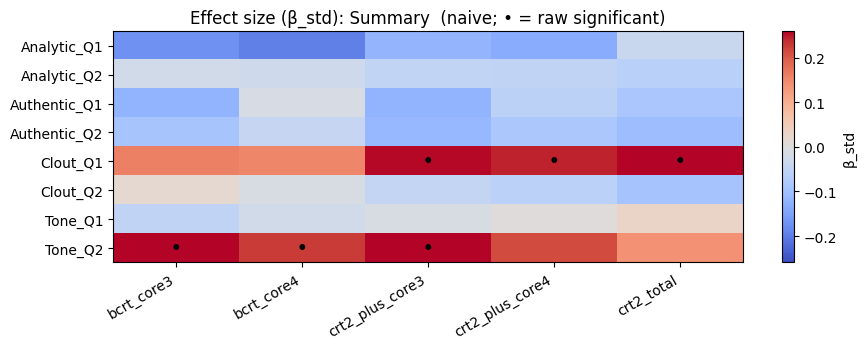

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


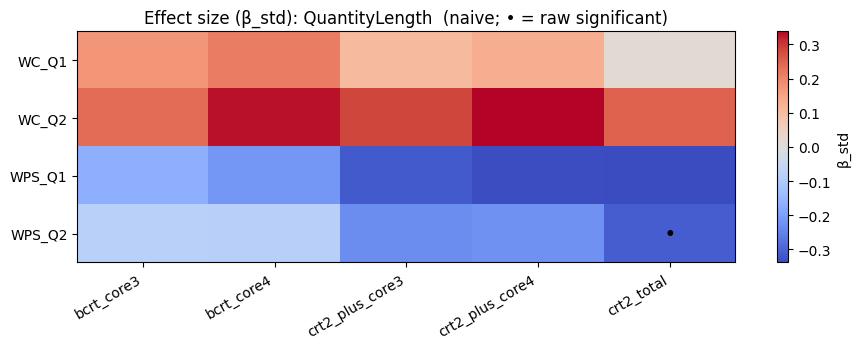

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


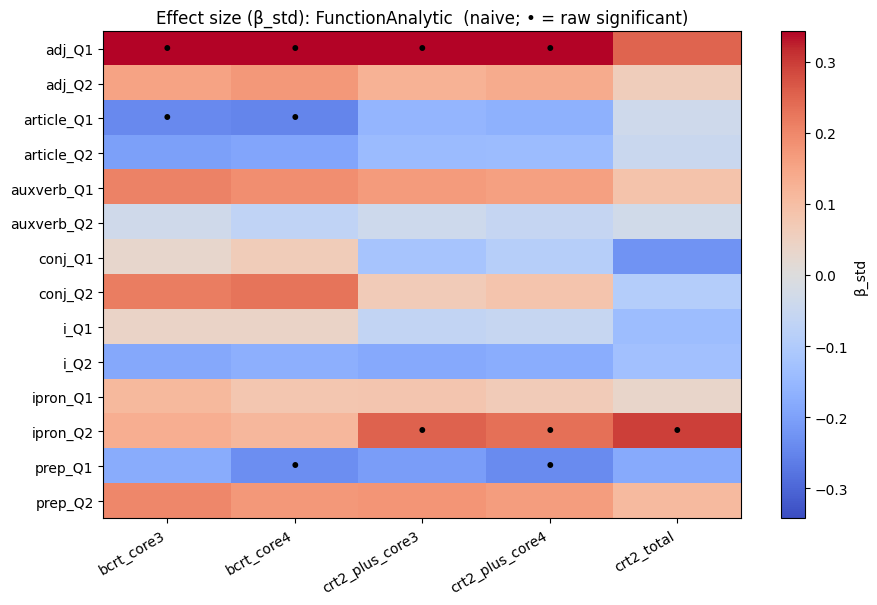

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
61,FunctionAnalytic,adj_Q1,bcrt_core3,bcrt_core3_total,0.767874,0.270104,1.265644,0.411932,0.002498,0.034976,0.166614,51
62,FunctionAnalytic,adj_Q1,bcrt_core4,bcrt_core4_total,0.808990,0.368957,1.249023,0.491101,0.000314,0.004397,0.237361,51
64,FunctionAnalytic,adj_Q1,crt2_plus_core4,crt2_plus_core4_total,0.424336,0.154245,0.694426,0.430322,0.002075,0.029045,0.186442,51


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


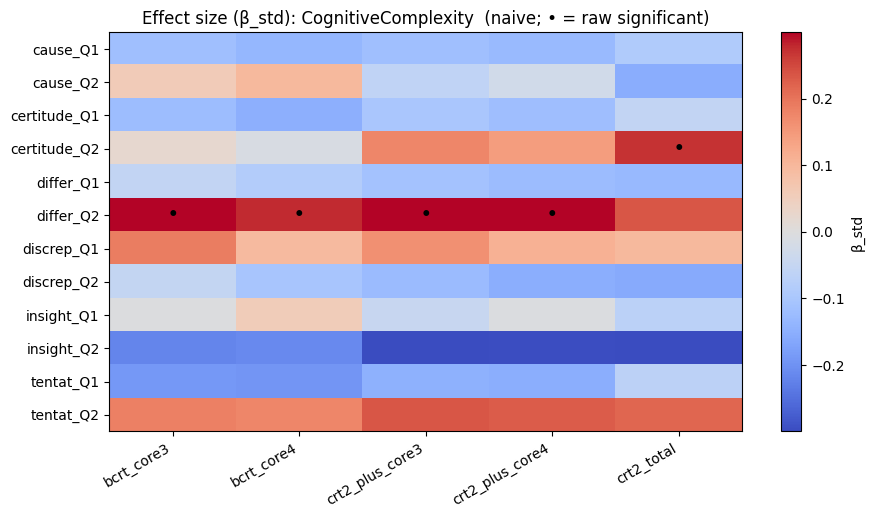

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
156,CognitiveComplexity,differ_Q2,bcrt_core3,bcrt_core3_total,0.913897,0.297904,1.52989,0.341554,0.003639,0.043666,0.116659,52


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


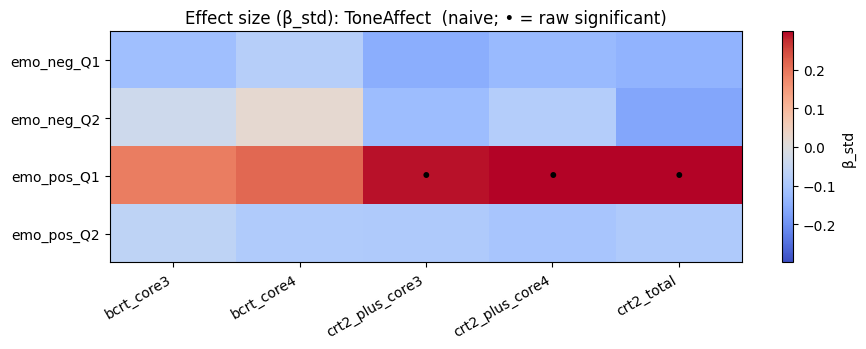

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


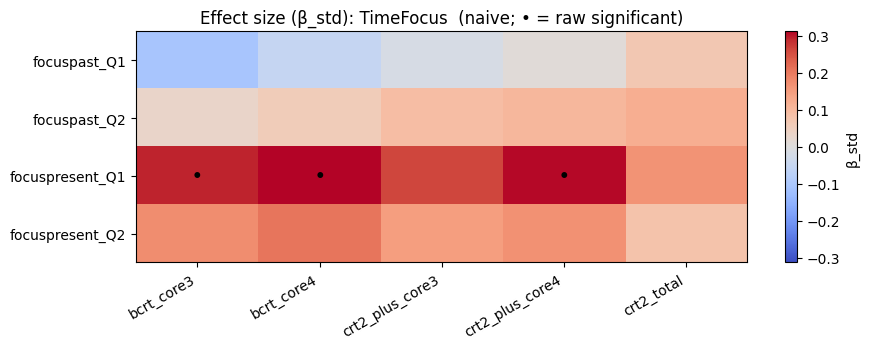

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


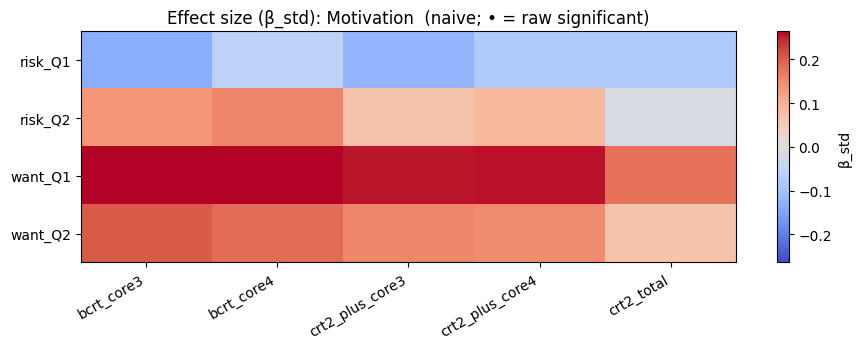

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


### Full sample
✓ ../reports/tables/liwc_predict_families_full.csv


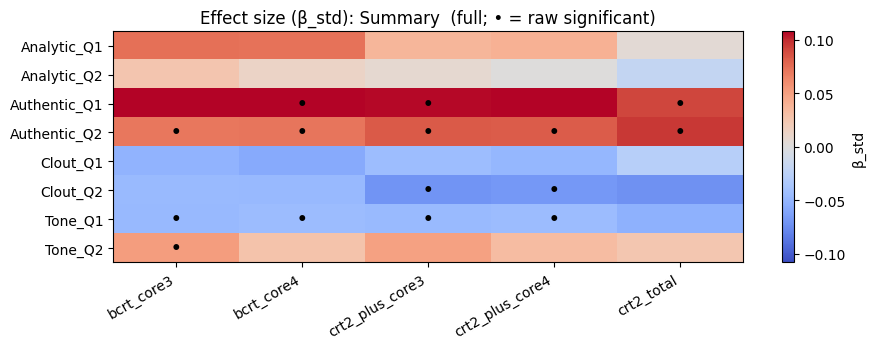

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


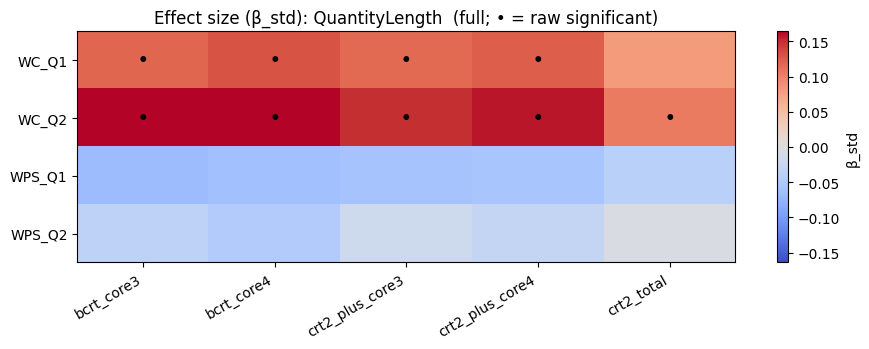

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
82,QuantityLength,WC_Q1,bcrt_core3,bcrt_core3_total,11.971538,3.604253,20.338823,0.198822,0.005043,0.010086,0.044071,237
84,QuantityLength,WC_Q1,bcrt_core4,bcrt_core4_total,11.927659,5.060072,18.795246,0.234018,0.000664,0.002383,0.057798,237
86,QuantityLength,WC_Q1,crt2_plus_core3,crt2_plus_core3_total,6.703518,1.674512,11.732523,0.176179,0.008985,0.035940,0.036803,237
88,QuantityLength,WC_Q1,crt2_plus_core4,crt2_plus_core4_total,6.953302,2.450530,11.456074,0.202235,0.002473,0.009890,0.045999,237
92,QuantityLength,WC_Q2,bcrt_core3,bcrt_core3_total,14.519996,4.871604,24.168387,0.208267,0.003182,0.010086,0.068038,240
94,QuantityLength,WC_Q2,bcrt_core4,bcrt_core4_total,14.199375,5.612102,22.786649,0.240605,0.001191,0.002383,0.081146,240
98,QuantityLength,WC_Q2,crt2_plus_core4,crt2_plus_core4_total,7.419775,1.127257,13.712292,0.186379,0.020826,0.041653,0.060296,240


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


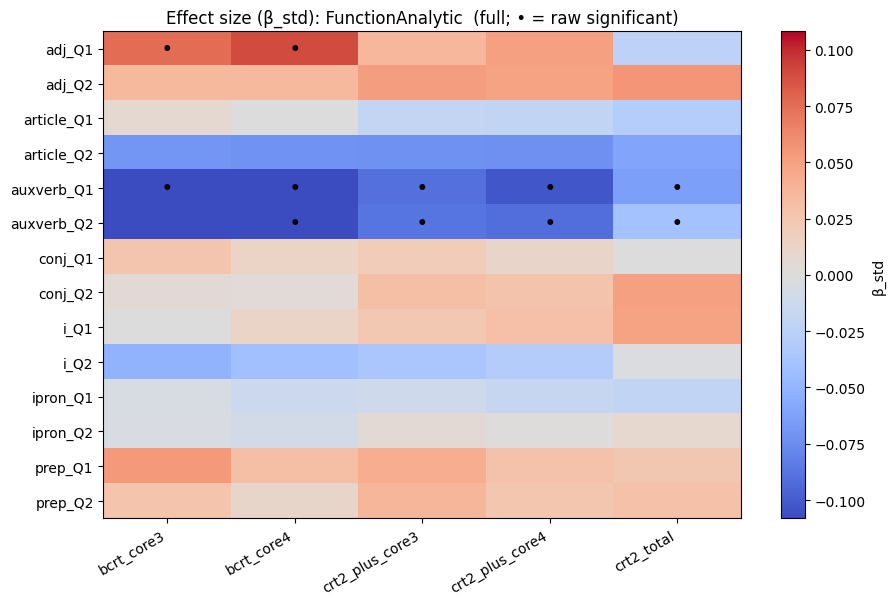

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
122,FunctionAnalytic,adj_Q1,bcrt_core3,bcrt_core3_total,0.426880,0.144064,0.709695,0.182346,0.003092,0.043292,0.031350,237
124,FunctionAnalytic,adj_Q1,bcrt_core4,bcrt_core4_total,0.447899,0.220103,0.675694,0.226021,0.000116,0.001628,0.047563,237


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


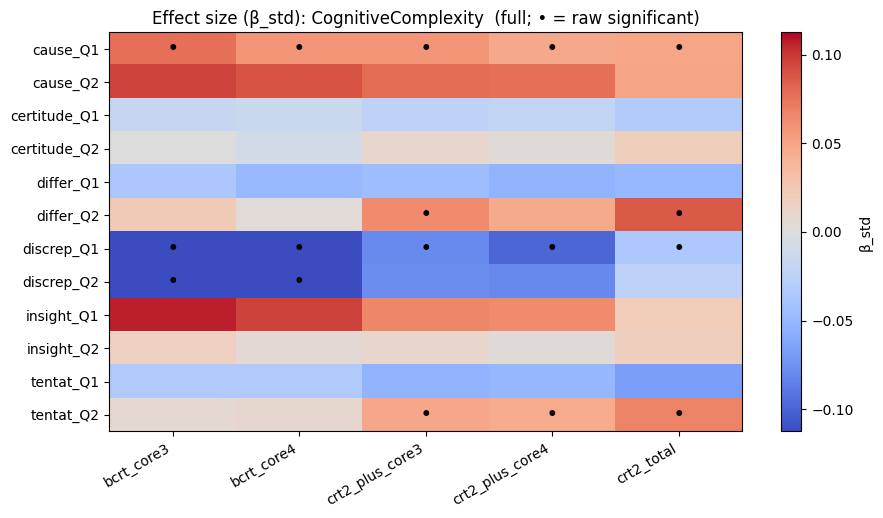

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
267,CognitiveComplexity,cause_Q1,crt2_plus_core3,seen_count,0.077939,0.023697,0.132181,0.184967,0.004858,0.042080,0.034595,237
269,CognitiveComplexity,cause_Q1,crt2_plus_core4,seen_count,0.081040,0.026794,0.135286,0.192327,0.003410,0.040926,0.039285,237
261,CognitiveComplexity,cause_Q1,crt2_total,seen_count,0.074286,0.021622,0.126950,0.176298,0.005697,0.035911,0.036058,237
327,CognitiveComplexity,discrep_Q1,crt2_plus_core3,seen_count,-0.120599,-0.208268,-0.032930,-0.182574,0.007013,0.042080,0.032203,237
321,CognitiveComplexity,discrep_Q1,crt2_total,seen_count,-0.120410,-0.206273,-0.034547,-0.182288,0.005985,0.035911,0.044163,237


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


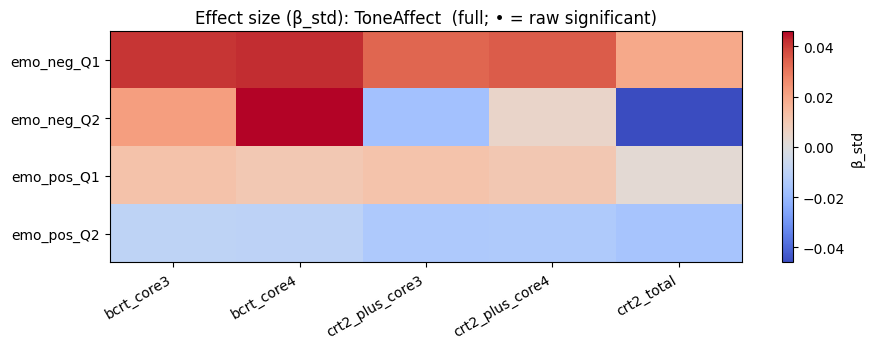

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


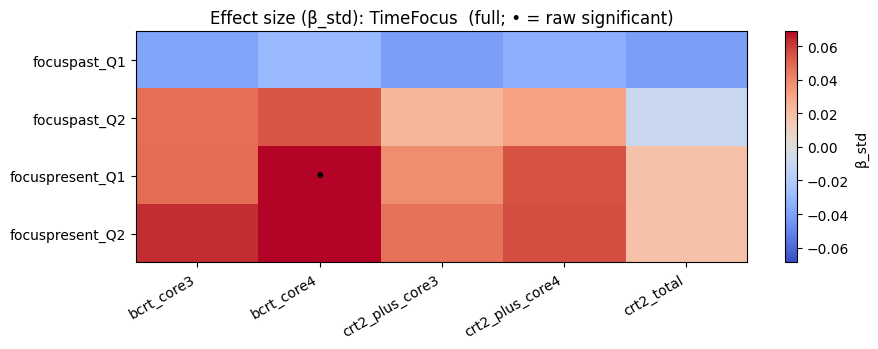

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n


/var/folders/z5/906x0vzj5n3f66twf2fv8p940000gn/T/ipykernel_95956/943405577.py:14: FutureWarning: The provided callable <function nanmean at 0x1077937e0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass 'mean' instead.
  bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)


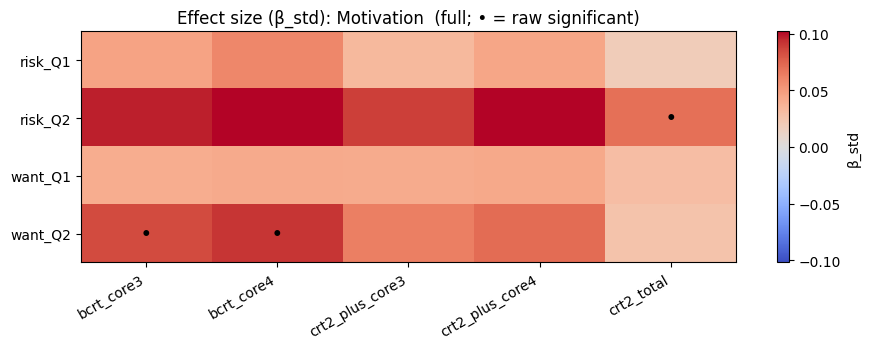

,family,outcome,set,predictor,beta,ci_lo,ci_hi,beta_std,p_raw,p_adj,r2,n
494,Motivation,want_Q2,bcrt_core4,bcrt_core4_total,0.067431,0.018477,0.116386,0.157098,0.006939,0.027756,0.027189,240


In [6]:
import numpy as np

def render_liwc(dataset):
    path = TABLES / f'liwc_predict_families_{dataset}.csv'
    if not exists(path):
        return
    df = pd.read_csv(path)

    def show_family(fam):
        g = df[df['family']==fam].copy()
        if g.empty:
            return
        # Effect-size heatmap (β_std) with raw-significance markers
        bsv = g.pivot_table(index='outcome', columns='set', values='beta_std', aggfunc=np.nanmean)
        sig = g.groupby(['outcome','set'])['sig_raw'].max().unstack('set').reindex_like(bsv).fillna(False)
        vmax = np.nanpercentile(np.abs(bsv.values), 95) if np.isfinite(bsv.values).any() else 1
        plt.figure(figsize=(9.2, max(3.6, 0.44*len(bsv.index))))
        plt.imshow(bsv.values, aspect='auto', vmin=-vmax, vmax=vmax, cmap='coolwarm')
        plt.xticks(range(bsv.shape[1]), bsv.columns, rotation=30, ha='right')
        plt.yticks(range(bsv.shape[0]), bsv.index)
        plt.colorbar(label='β_std')
        plt.title(f'Effect size (β_std): {fam}  ({dataset}; • = raw significant)')
        for i in range(sig.shape[0]):
            for j in range(sig.shape[1]):
                if bool(sig.iloc[i, j]):
                    plt.text(j, i, '•', ha='center', va='center', fontsize=12, fontweight='bold')
        plt.tight_layout(); plt.show()

        # Companion table of significant rows (with CI)
        tab = g[g['sig_adj']].copy().sort_values(['outcome','set','predictor'])
        cols = ['family','outcome','set','predictor','beta','ci_lo','ci_hi','beta_std','p_raw','p_adj','r2','n']
        display(tab[cols].head(100))

    for fam in df['family'].unique():
        show_family(fam)

print('### Naïve sample')
render_liwc('naive')
print('### Full sample')
render_liwc('full')

## 4. Naïve vs Full — LIWC summary (with corrections)

In [7]:
full = TABLES / 'liwc_predict_families_full.csv'
naiv = TABLES / 'liwc_predict_families_naive.csv'
if exists(full) and exists(naiv):
    d_full = pd.read_csv(full); d_naiv = pd.read_csv(naiv)
    def fam_counts(df, label):
        g = df.groupby('family').agg(sig_adj_cnt=('sig_adj','sum'), sig_raw_cnt=('sig_raw','sum'), tests=('p_raw','count')).reset_index()
        g.insert(1, 'dataset', label); return g
    display(pd.concat([fam_counts(d_naiv,'naive'), fam_counts(d_full,'full')], ignore_index=True).sort_values(['family','dataset']))
    for label, d in [('naive', d_naiv), ('full', d_full)]:
        t = d.assign(abs_b=np.abs(d['beta_std'])).sort_values('abs_b', ascending=False)
        cols = ['family','outcome','set','predictor','beta_std','p_adj','p_raw','r2','n']
        print(f'\nTop effects — {label}:')
        display(t[cols].head(12))

✓ ../reports/tables/liwc_predict_families_full.csv
✓ ../reports/tables/liwc_predict_families_naive.csv


,family,dataset,sig_adj_cnt,sig_raw_cnt,tests
7,CognitiveComplexity,full,5,18,120
0,CognitiveComplexity,naive,1,5,60
8,FunctionAnalytic,full,2,11,140
1,FunctionAnalytic,naive,3,11,70
9,Motivation,full,1,3,40
2,Motivation,naive,0,0,20
10,QuantityLength,full,7,9,40
3,QuantityLength,naive,0,1,20
11,Summary,full,0,15,80
4,Summary,naive,0,6,40



Top effects — naive:


,family,outcome,set,predictor,beta_std,p_adj,p_raw,r2,n
62,FunctionAnalytic,adj_Q1,bcrt_core4,bcrt_core4_total,0.491101,0.004397,0.000314,0.237361,51
64,FunctionAnalytic,adj_Q1,crt2_plus_core4,crt2_plus_core4_total,0.430322,0.029045,0.002075,0.186442,51
61,FunctionAnalytic,adj_Q1,bcrt_core3,bcrt_core3_total,0.411932,0.034976,0.002498,0.166614,51
63,FunctionAnalytic,adj_Q1,crt2_plus_core3,crt2_plus_core3_total,0.381018,0.085614,0.006115,0.146248,51
222,TimeFocus,focuspresent_Q1,bcrt_core4,bcrt_core4_total,0.368908,0.052871,0.013218,0.133938,51
50,QuantityLength,WPS_Q1,crt2_total,crt2_total,-0.364901,0.182462,0.091231,0.135815,51
156,CognitiveComplexity,differ_Q2,bcrt_core3,bcrt_core3_total,0.341554,0.043666,0.003639,0.116659,52
49,QuantityLength,WC_Q2,crt2_plus_core4,crt2_plus_core4_total,0.337063,0.249219,0.085718,0.113612,52
158,CognitiveComplexity,differ_Q2,crt2_plus_core3,crt2_plus_core3_total,0.335573,0.159387,0.013282,0.112609,52
54,QuantityLength,WPS_Q1,crt2_plus_core4,crt2_plus_core4_total,-0.333571,0.249219,0.124609,0.112029,51



Top effects — full:


,family,outcome,set,predictor,beta_std,p_adj,p_raw,r2,n
94,QuantityLength,WC_Q2,bcrt_core4,bcrt_core4_total,0.240605,0.002383,0.001191,0.081146,240
84,QuantityLength,WC_Q1,bcrt_core4,bcrt_core4_total,0.234018,0.002383,0.000664,0.057798,237
124,FunctionAnalytic,adj_Q1,bcrt_core4,bcrt_core4_total,0.226021,0.001628,0.000116,0.047563,237
92,QuantityLength,WC_Q2,bcrt_core3,bcrt_core3_total,0.208267,0.010086,0.003182,0.068038,240
88,QuantityLength,WC_Q1,crt2_plus_core4,crt2_plus_core4_total,0.202235,0.009890,0.002473,0.045999,237
82,QuantityLength,WC_Q1,bcrt_core3,bcrt_core3_total,0.198822,0.010086,0.005043,0.044071,237
265,CognitiveComplexity,cause_Q1,bcrt_core4,seen_count,0.193189,0.050473,0.004206,0.035489,237
269,CognitiveComplexity,cause_Q1,crt2_plus_core4,seen_count,0.192327,0.040926,0.003410,0.039285,237
98,QuantityLength,WC_Q2,crt2_plus_core4,crt2_plus_core4_total,0.186379,0.041653,0.020826,0.060296,240
267,CognitiveComplexity,cause_Q1,crt2_plus_core3,seen_count,0.184967,0.042080,0.004858,0.034595,237


# 5. LIWC - GLMM for Mosleh only + Families (Naive)

## Mosleh GLMM — naive
✓ ../reports/tables/mosleh_liwc/mosleh_liwc_glmm_naive.csv


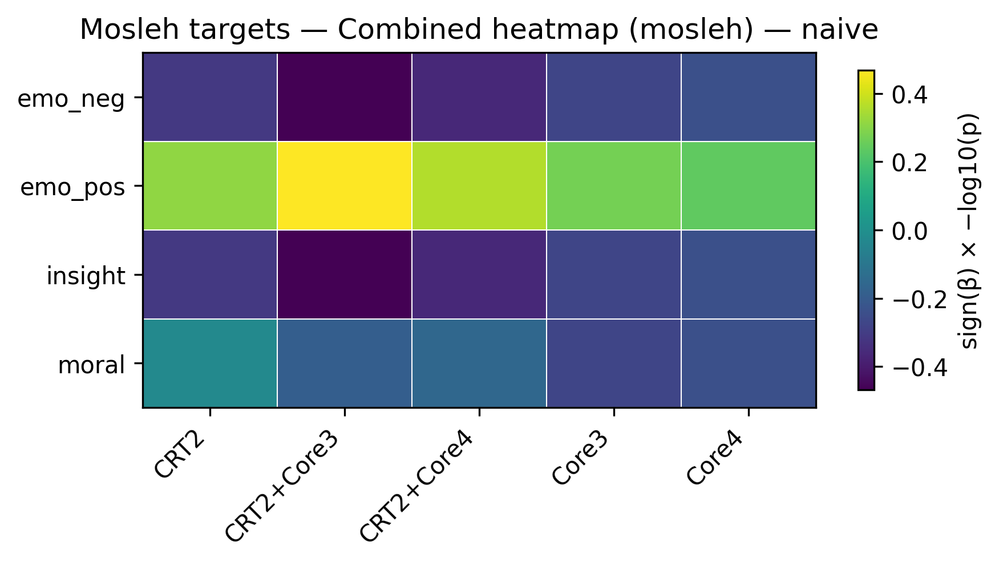

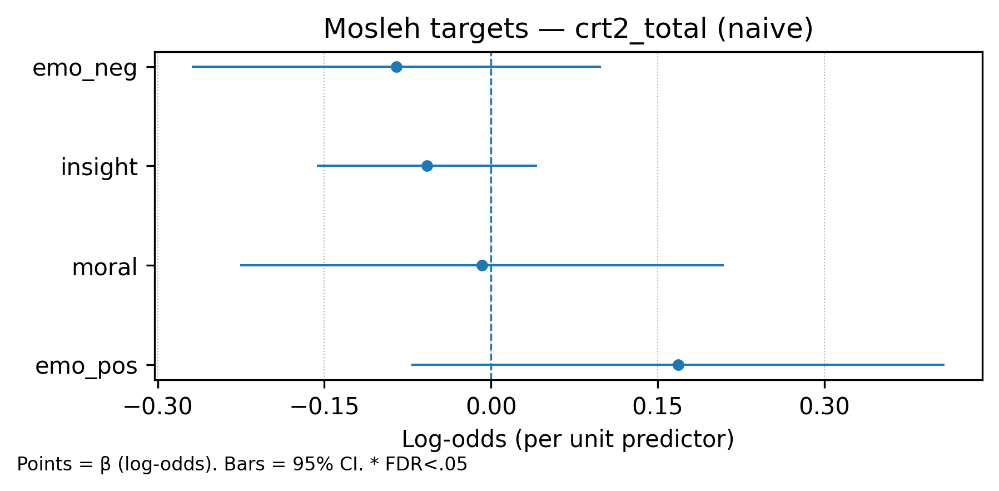

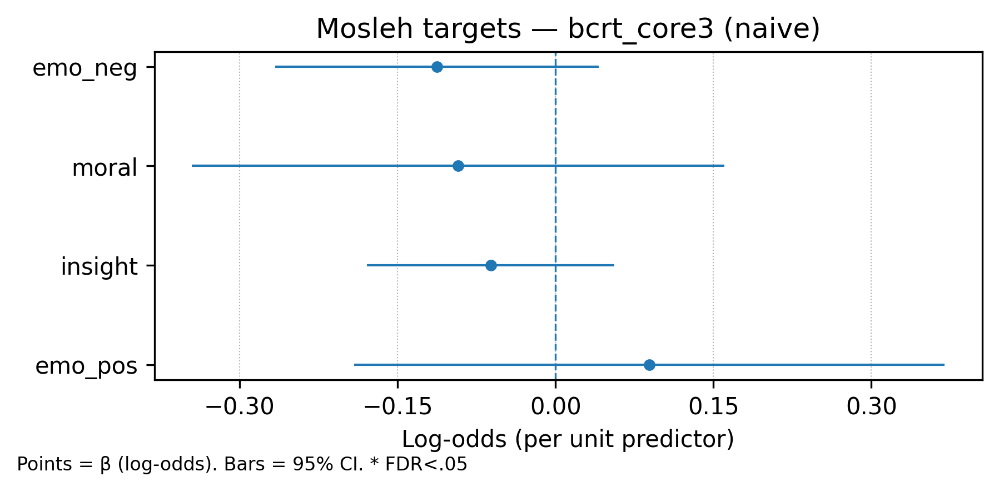

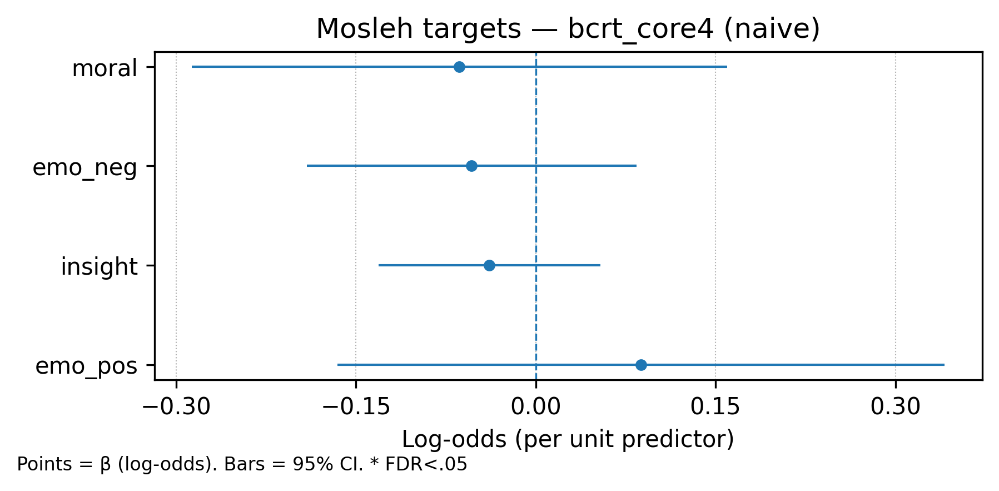

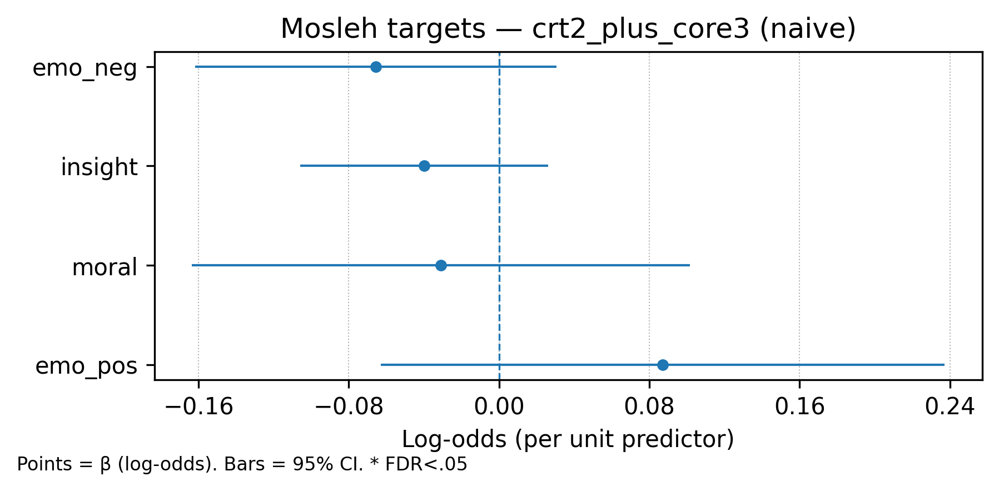

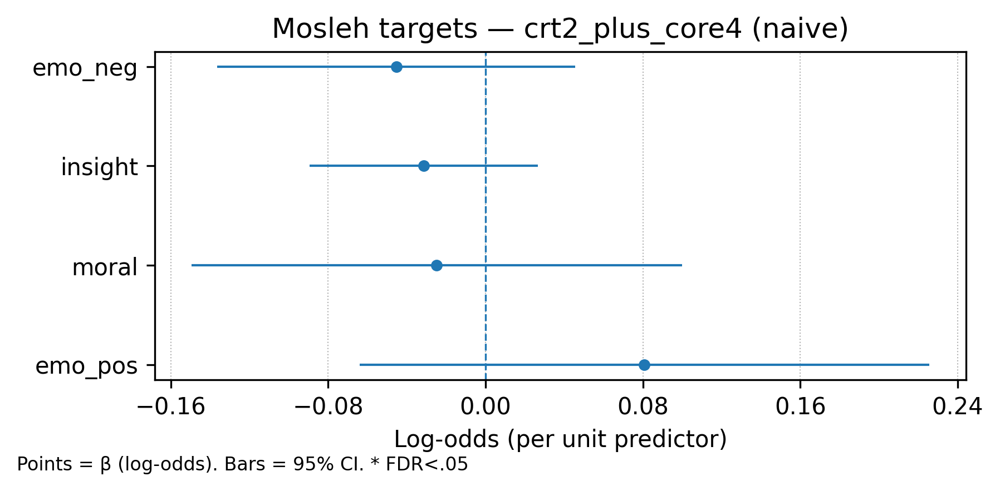

Rows: 20
### Mosleh — significant (FDR<.05) rows


,dataset,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,model,n,z,p_adj,sig_adj


### Mosleh — all rows


,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
5,emo_neg,bcrt_core3,bcrt_core3_total,-0.112683,0.078398,-0.266343,0.040977,0.150626,0.533476,binomial_cluster,103
9,emo_neg,bcrt_core4,bcrt_core4_total,-0.053415,0.070081,-0.190773,0.083944,0.445948,0.576377,binomial_cluster,103
13,emo_neg,crt2_plus_core3,crt2_plus_core3_total,-0.065556,0.049020,-0.161636,0.030524,0.181120,0.340421,binomial_cluster,103
17,emo_neg,crt2_plus_core4,crt2_plus_core4_total,-0.045392,0.046444,-0.136422,0.045637,0.328390,0.437853,binomial_cluster,103
1,emo_neg,crt2_total,crt2_total,-0.085146,0.093880,-0.269150,0.098859,0.364425,0.485900,binomial_cluster,103
6,emo_pos,bcrt_core3,bcrt_core3_total,0.089124,0.143123,-0.191397,0.369646,0.533476,0.533476,binomial_cluster,103
10,emo_pos,bcrt_core4,bcrt_core4_total,0.087907,0.129222,-0.165368,0.341183,0.496326,0.576377,binomial_cluster,103
14,emo_pos,crt2_plus_core3,crt2_plus_core3_total,0.087106,0.076574,-0.062980,0.237191,0.255316,0.340421,binomial_cluster,103
18,emo_pos,crt2_plus_core4,crt2_plus_core4_total,0.080755,0.073912,-0.064112,0.225623,0.274574,0.437853,binomial_cluster,103
2,emo_pos,crt2_total,crt2_total,0.168270,0.122450,-0.071732,0.408272,0.169381,0.485900,binomial_cluster,103




## LIWC Family GLMM — naive
✓ ../reports/tables/liwc_families_glmm_crt_sets.csv
### Family: FunctionAnalytic — naive


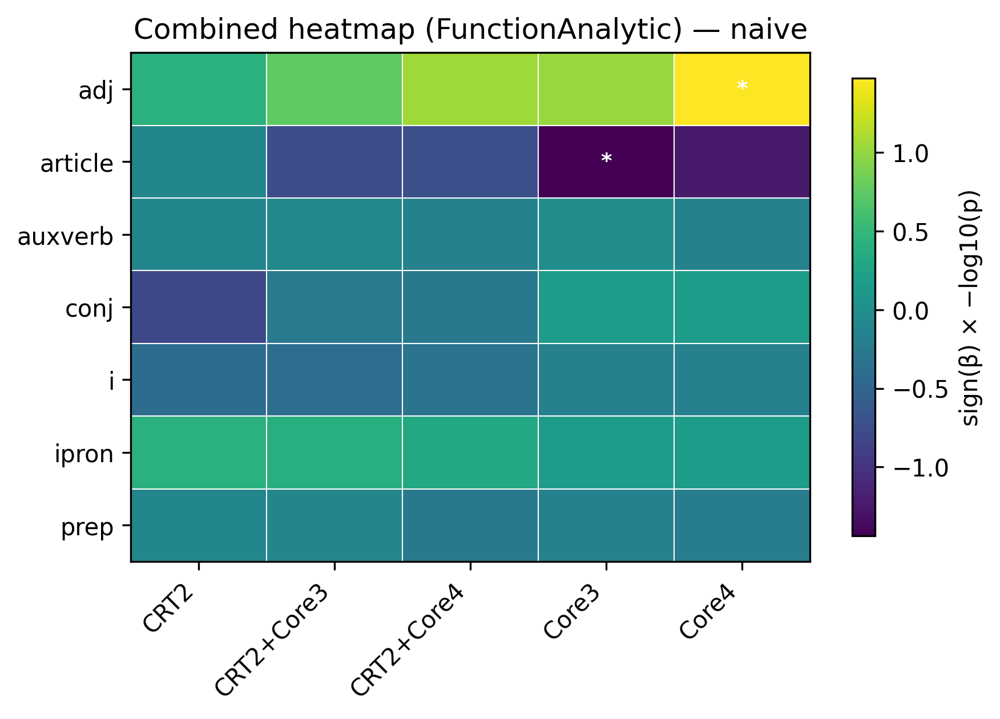

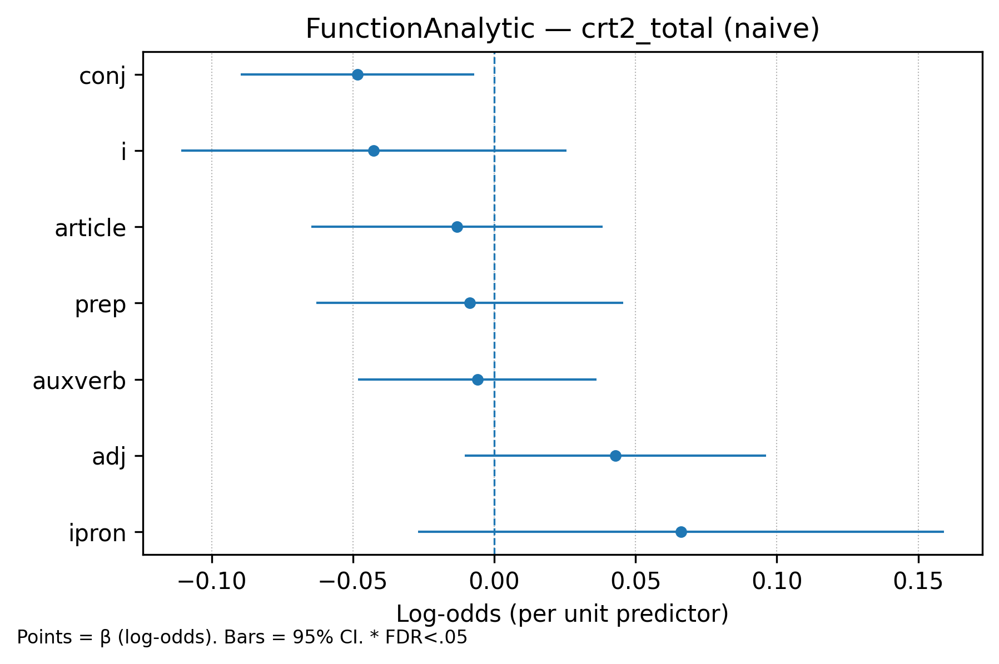

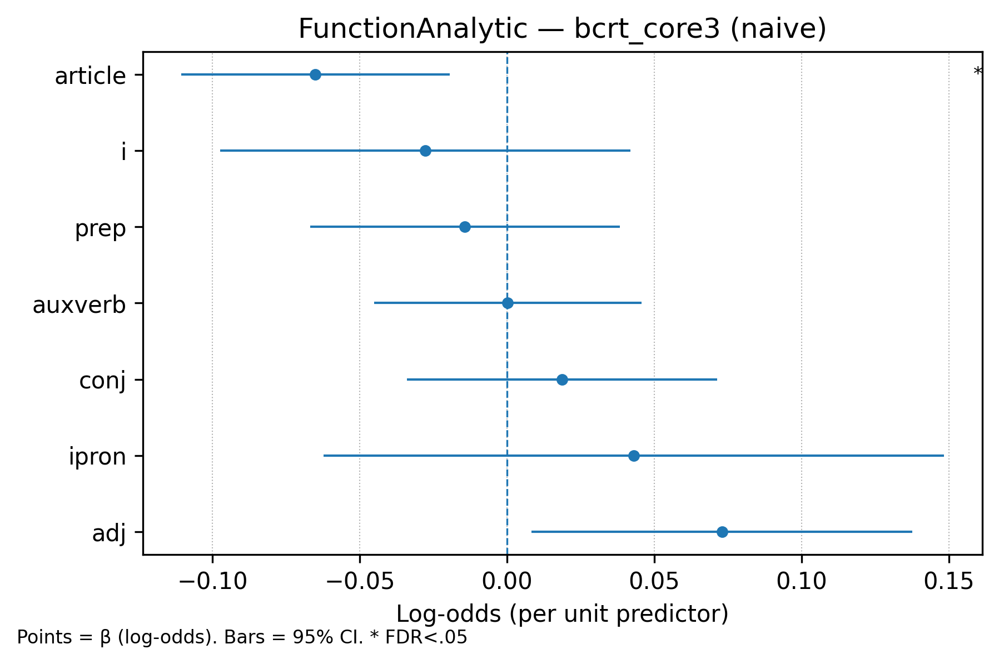

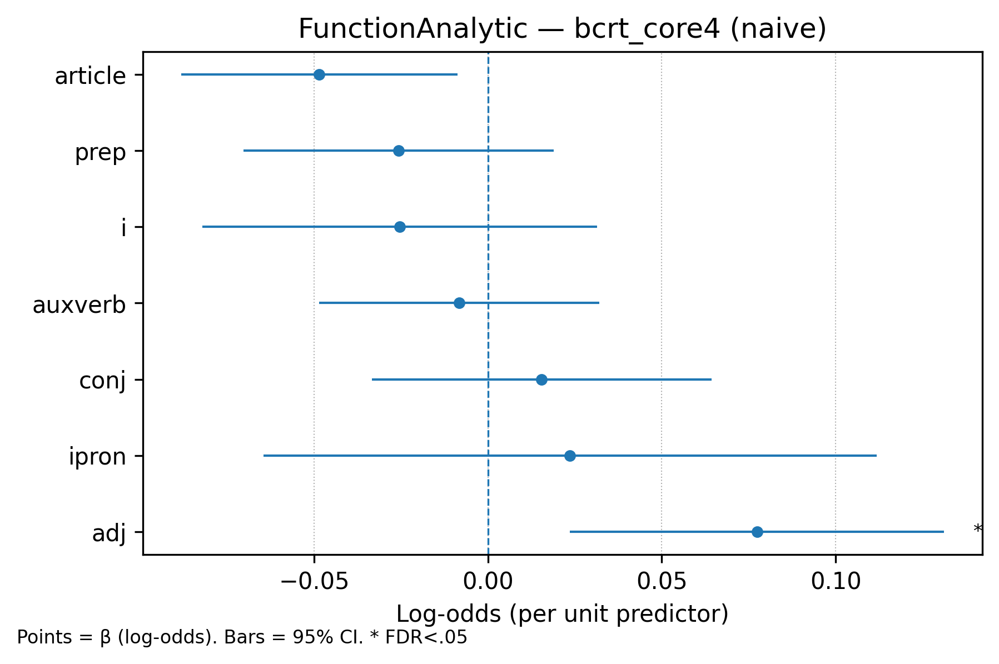

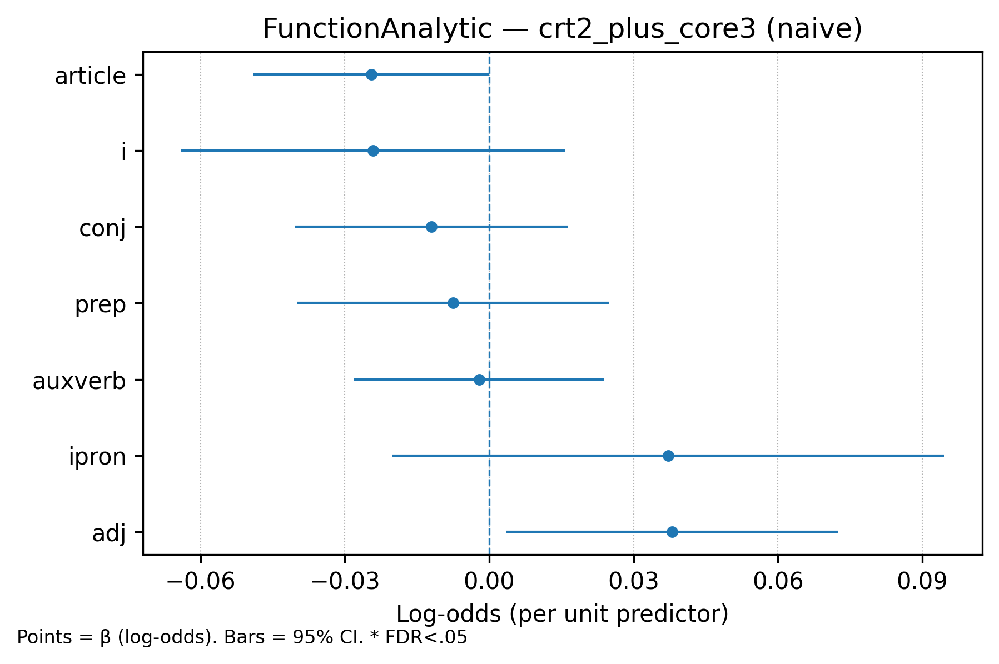

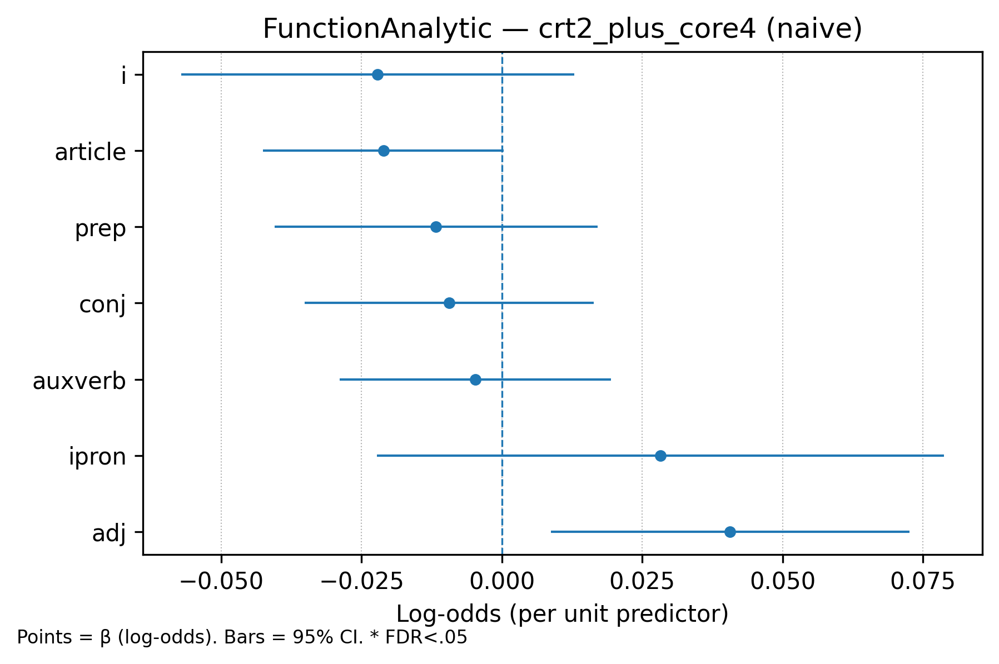

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
127,FunctionAnalytic,adj,bcrt_core4,bcrt_core4_total,0.077411,0.023608,0.131214,0.004802,0.033615,binomial_cluster,103
96,FunctionAnalytic,article,bcrt_core3,bcrt_core3_total,-0.065025,-0.110626,-0.019424,0.005192,0.036347,binomial_cluster,103


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
126,FunctionAnalytic,adj,bcrt_core3,bcrt_core3_total,0.072968,0.032959,0.008368,0.137569,0.026835,0.093924,binomial_cluster,103
127,FunctionAnalytic,adj,bcrt_core4,bcrt_core4_total,0.077411,0.027450,0.023608,0.131214,0.004802,0.033615,binomial_cluster,103
128,FunctionAnalytic,adj,crt2_plus_core3,crt2_plus_core3_total,0.037993,0.017627,0.003444,0.072542,0.031133,0.176944,binomial_cluster,103
129,FunctionAnalytic,adj,crt2_plus_core4,crt2_plus_core4_total,0.040646,0.016296,0.008707,0.072586,0.012621,0.088344,binomial_cluster,103
125,FunctionAnalytic,adj,crt2_total,crt2_total,0.042860,0.027156,-0.010366,0.096085,0.114500,0.381184,binomial_cluster,103
96,FunctionAnalytic,article,bcrt_core3,bcrt_core3_total,-0.065025,0.023266,-0.110626,-0.019424,0.005192,0.036347,binomial_cluster,103
97,FunctionAnalytic,article,bcrt_core4,bcrt_core4_total,-0.048496,0.020307,-0.088297,-0.008695,0.016933,0.059265,binomial_cluster,103
98,FunctionAnalytic,article,crt2_plus_core3,crt2_plus_core3_total,-0.024526,0.012544,-0.049111,0.000060,0.050556,0.176944,binomial_cluster,103
99,FunctionAnalytic,article,crt2_plus_core4,crt2_plus_core4_total,-0.021105,0.010924,-0.042517,0.000306,0.053365,0.186777,binomial_cluster,103
95,FunctionAnalytic,article,crt2_total,crt2_total,-0.013148,0.026259,-0.064616,0.038319,0.616567,0.781065,binomial_cluster,103


### Family: CognitiveComplexity — naive


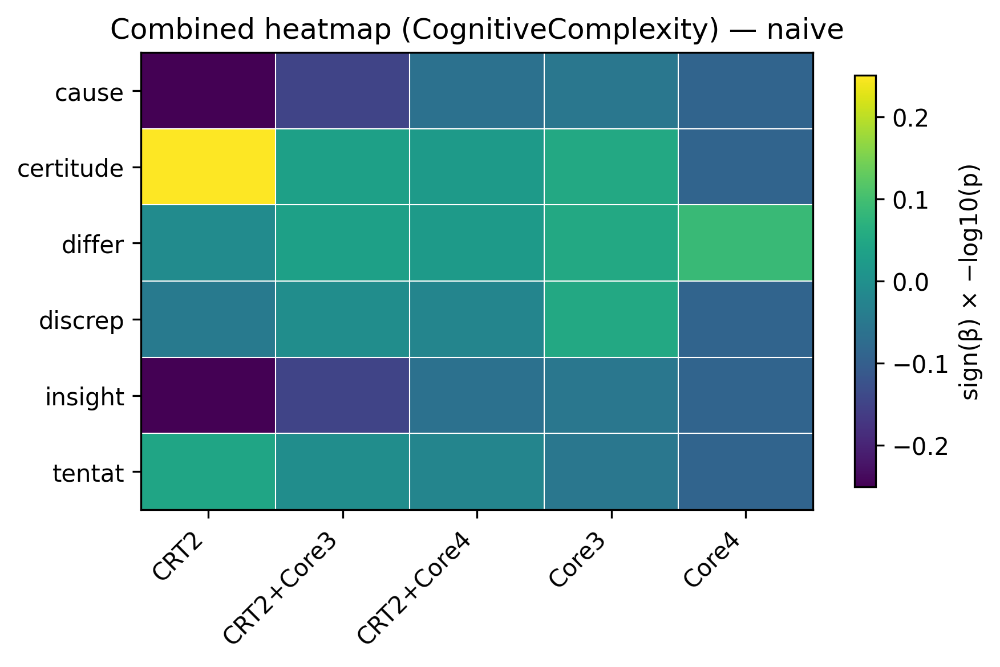

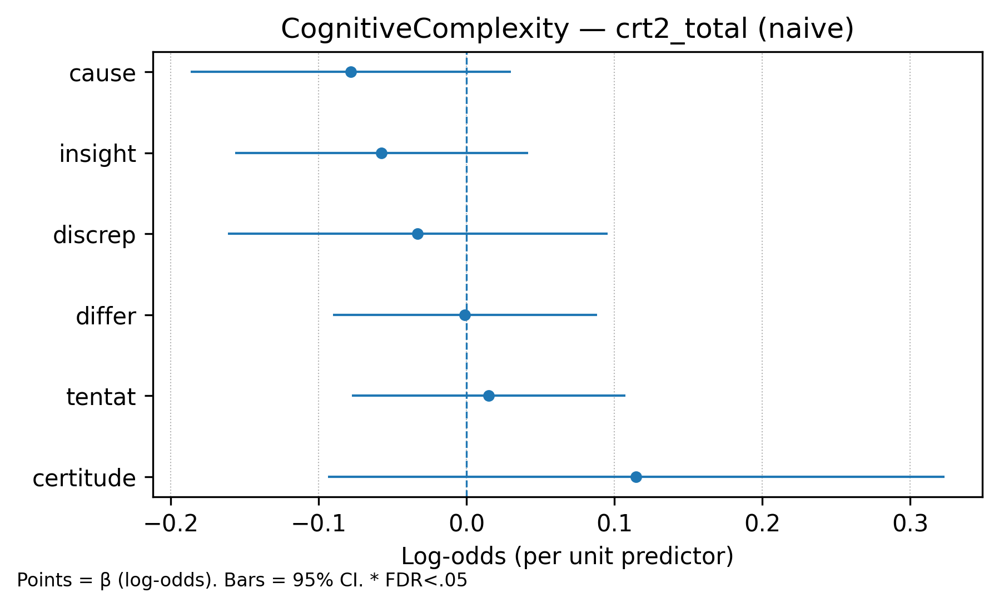

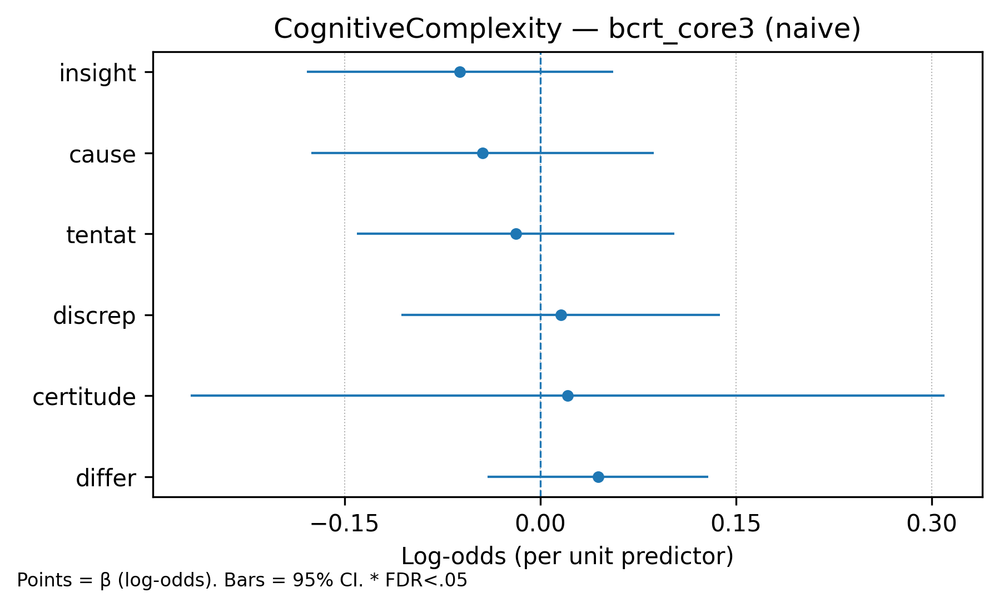

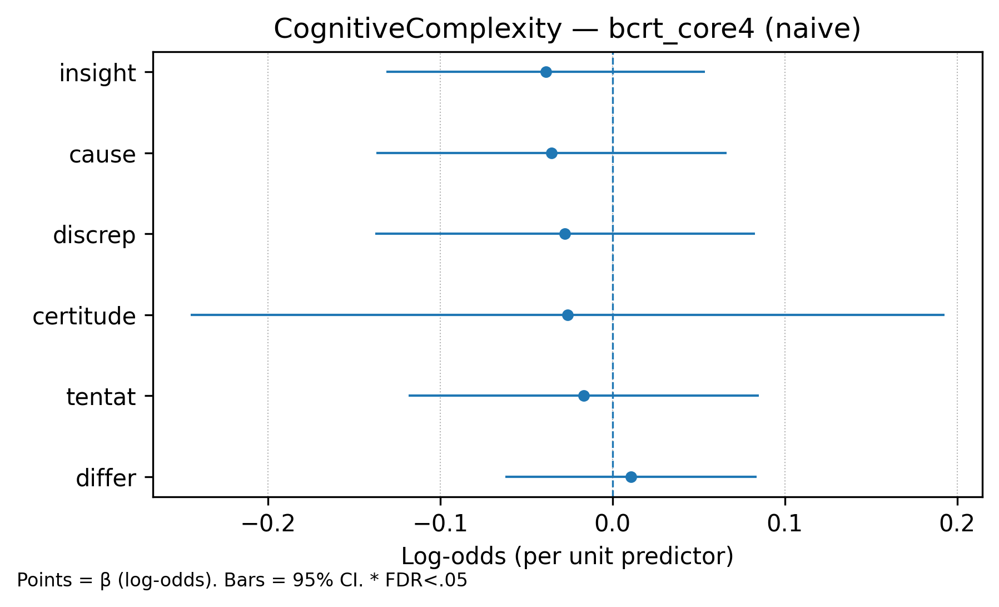

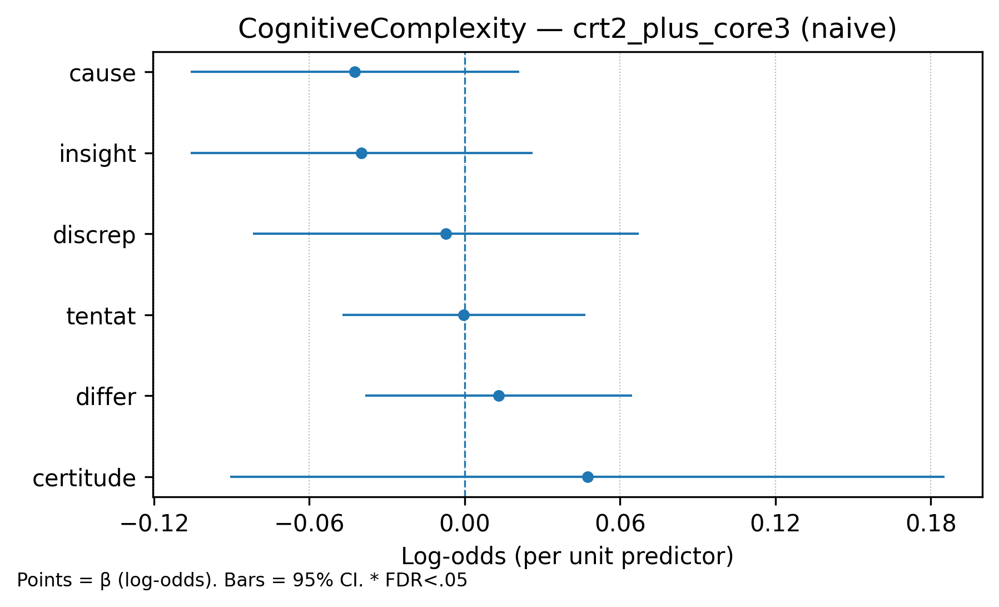

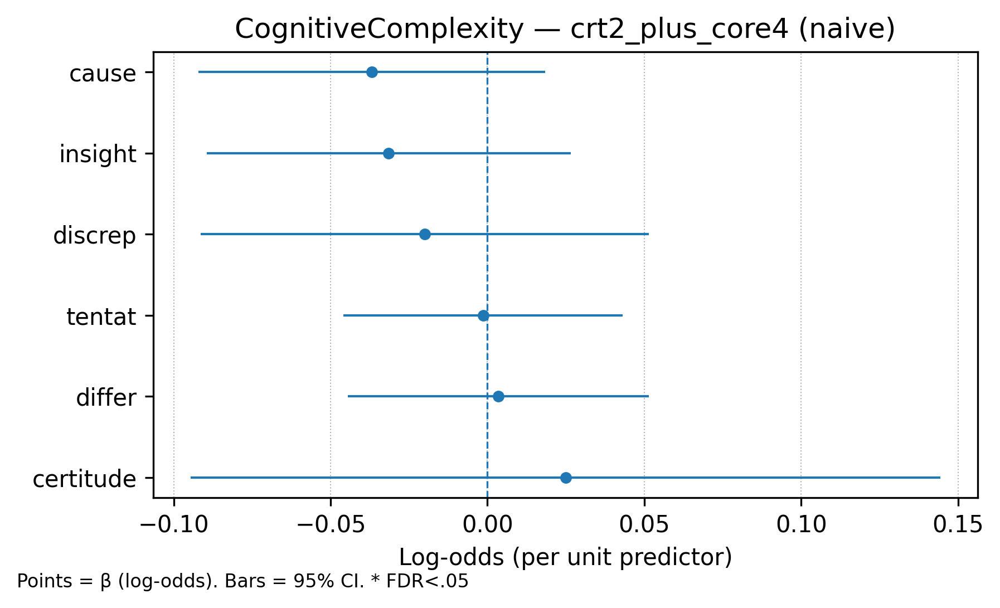

Significant (FDR<.05)


,dataset,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,model,n,z,p_adj,sig_adj


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
136,CognitiveComplexity,cause,bcrt_core3,bcrt_core3_total,-0.044255,0.067027,-0.175628,0.087118,0.509089,0.886800,binomial_cluster,103
137,CognitiveComplexity,cause,bcrt_core4,bcrt_core4_total,-0.035430,0.051795,-0.136948,0.066087,0.493941,0.815413,binomial_cluster,103
138,CognitiveComplexity,cause,crt2_plus_core3,crt2_plus_core3_total,-0.042391,0.032335,-0.105767,0.020985,0.189852,0.711656,binomial_cluster,103
139,CognitiveComplexity,cause,crt2_plus_core4,crt2_plus_core4_total,-0.036851,0.028222,-0.092166,0.018465,0.191641,0.862469,binomial_cluster,103
135,CognitiveComplexity,cause,crt2_total,crt2_total,-0.078242,0.055249,-0.186529,0.030046,0.156726,0.561298,binomial_cluster,103
156,CognitiveComplexity,certitude,bcrt_core3,bcrt_core3_total,0.020986,0.147418,-0.267954,0.309925,0.886800,0.886800,binomial_cluster,103
157,CognitiveComplexity,certitude,bcrt_core4,bcrt_core4_total,-0.026058,0.111621,-0.244834,0.192719,0.815413,0.815413,binomial_cluster,103
158,CognitiveComplexity,certitude,crt2_plus_core3,crt2_plus_core3_total,0.047362,0.070387,-0.090597,0.185320,0.501024,0.924333,binomial_cluster,103
159,CognitiveComplexity,certitude,crt2_plus_core4,crt2_plus_core4_total,0.024913,0.060959,-0.094566,0.144393,0.682767,0.950750,binomial_cluster,103
155,CognitiveComplexity,certitude,crt2_total,crt2_total,0.114787,0.106397,-0.093750,0.323325,0.280649,0.561298,binomial_cluster,103


### Family: ToneAffect — naive


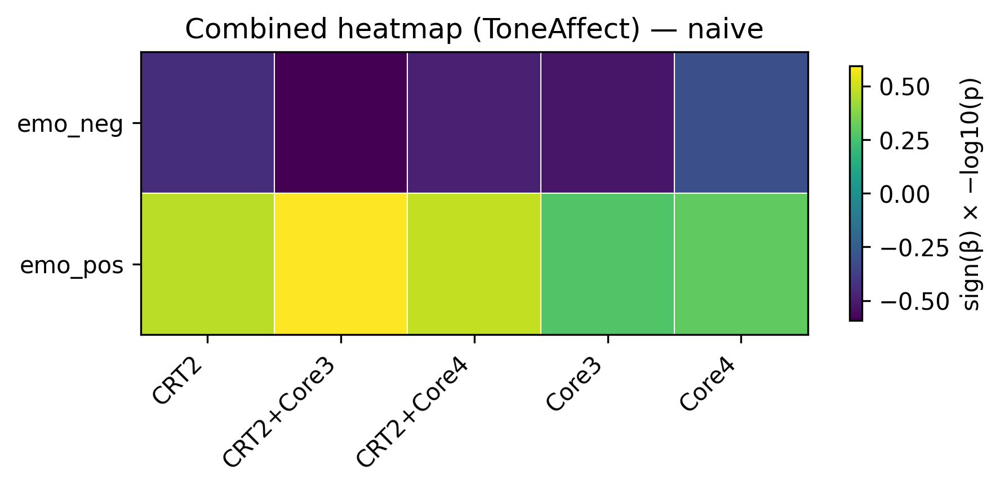

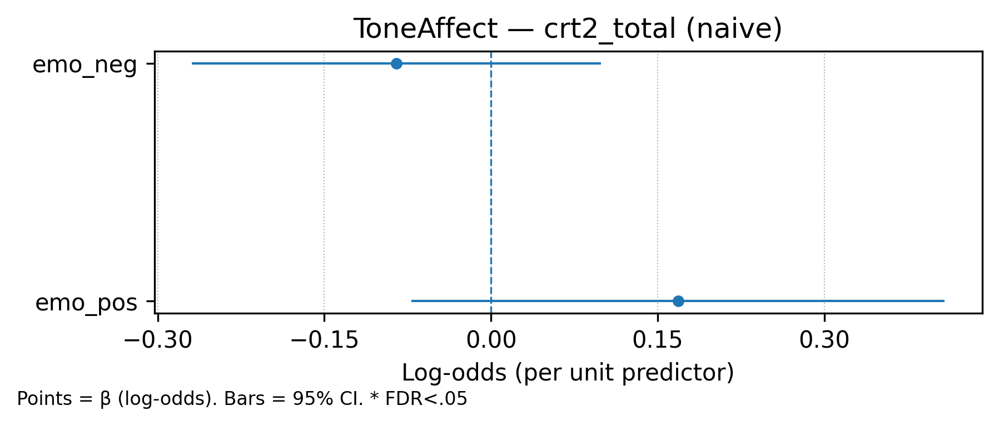

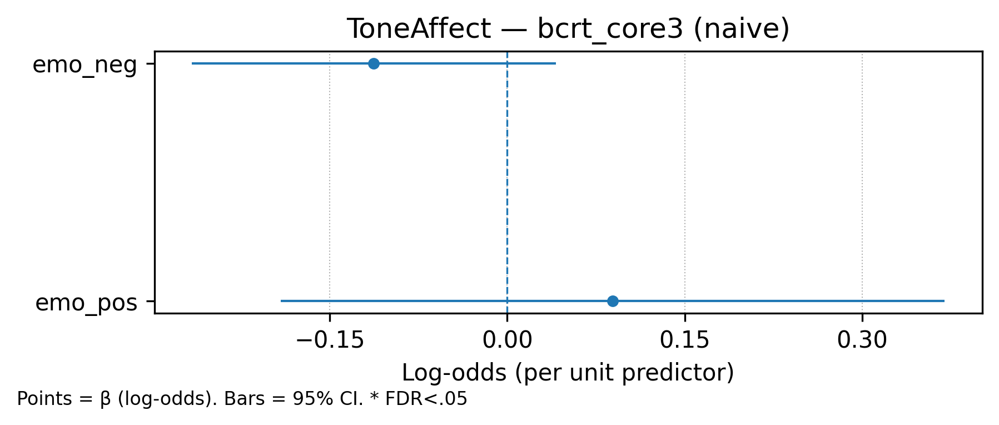

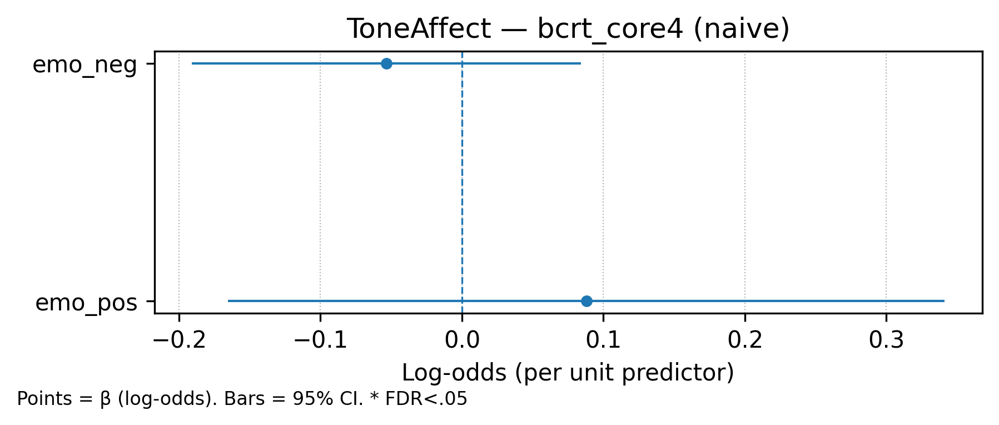

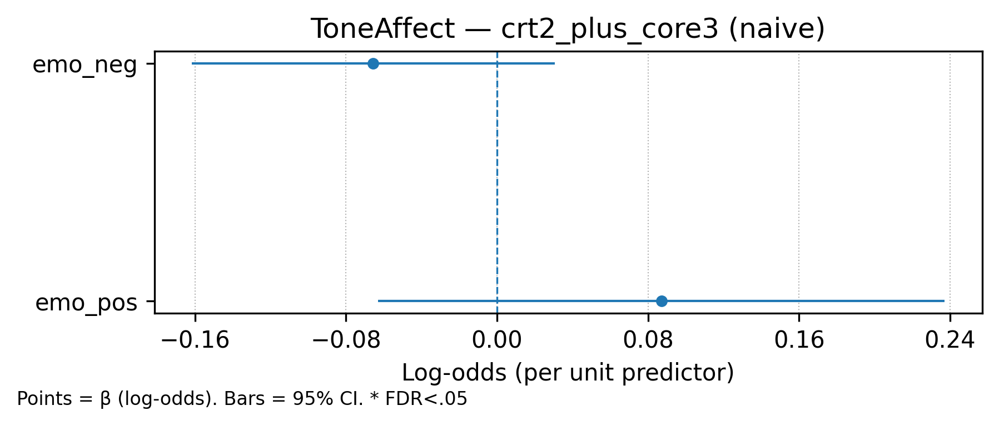

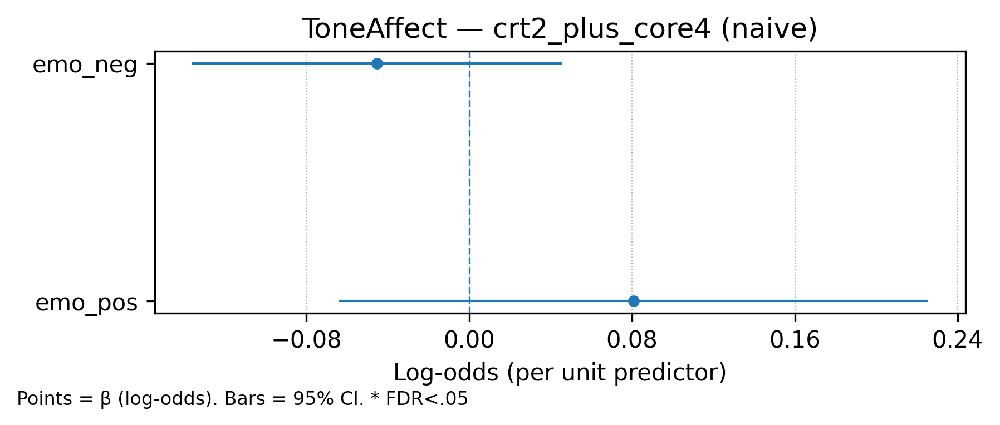

Significant (FDR<.05)


,dataset,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,model,n,z,p_adj,sig_adj


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
166,ToneAffect,emo_neg,bcrt_core3,bcrt_core3_total,-0.112683,0.078398,-0.266343,0.040977,0.150626,0.301251,binomial_cluster,103
167,ToneAffect,emo_neg,bcrt_core4,bcrt_core4_total,-0.053415,0.070081,-0.190773,0.083944,0.445948,0.496326,binomial_cluster,103
168,ToneAffect,emo_neg,crt2_plus_core3,crt2_plus_core3_total,-0.065556,0.049020,-0.161636,0.030524,0.181120,0.255316,binomial_cluster,103
169,ToneAffect,emo_neg,crt2_plus_core4,crt2_plus_core4_total,-0.045392,0.046444,-0.136422,0.045637,0.328390,0.328390,binomial_cluster,103
165,ToneAffect,emo_neg,crt2_total,crt2_total,-0.085146,0.093880,-0.269150,0.098859,0.364425,0.364425,binomial_cluster,103
161,ToneAffect,emo_pos,bcrt_core3,bcrt_core3_total,0.089124,0.143123,-0.191397,0.369646,0.533476,0.533476,binomial_cluster,103
162,ToneAffect,emo_pos,bcrt_core4,bcrt_core4_total,0.087907,0.129222,-0.165368,0.341183,0.496326,0.496326,binomial_cluster,103
163,ToneAffect,emo_pos,crt2_plus_core3,crt2_plus_core3_total,0.087106,0.076574,-0.062980,0.237191,0.255316,0.255316,binomial_cluster,103
164,ToneAffect,emo_pos,crt2_plus_core4,crt2_plus_core4_total,0.080755,0.073912,-0.064112,0.225623,0.274574,0.328390,binomial_cluster,103
160,ToneAffect,emo_pos,crt2_total,crt2_total,0.168270,0.122450,-0.071732,0.408272,0.169381,0.338762,binomial_cluster,103


### Family: TimeFocus — naive


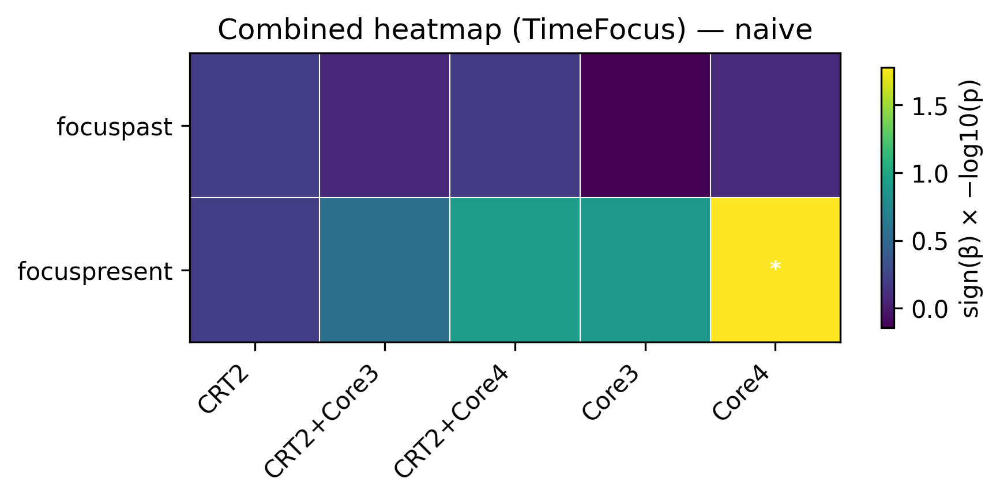

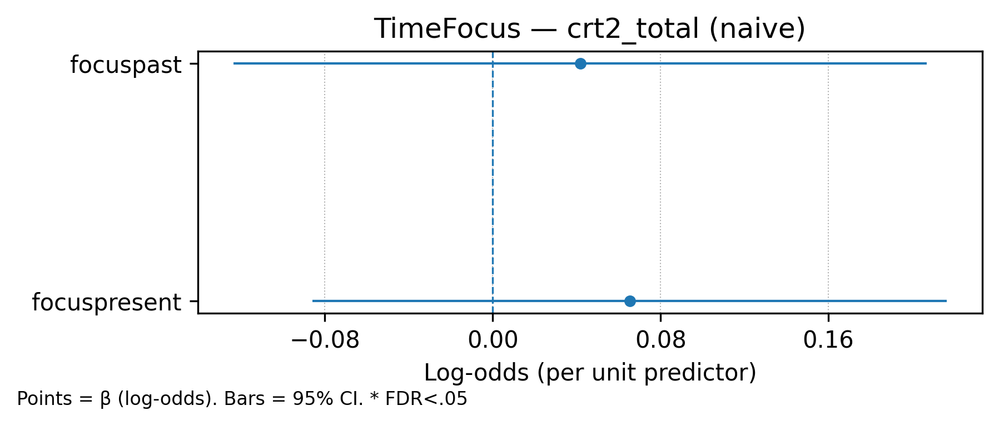

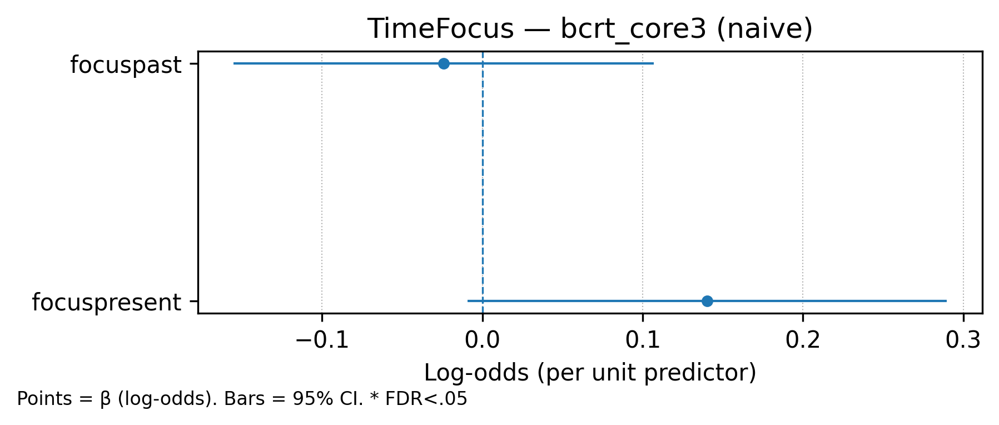

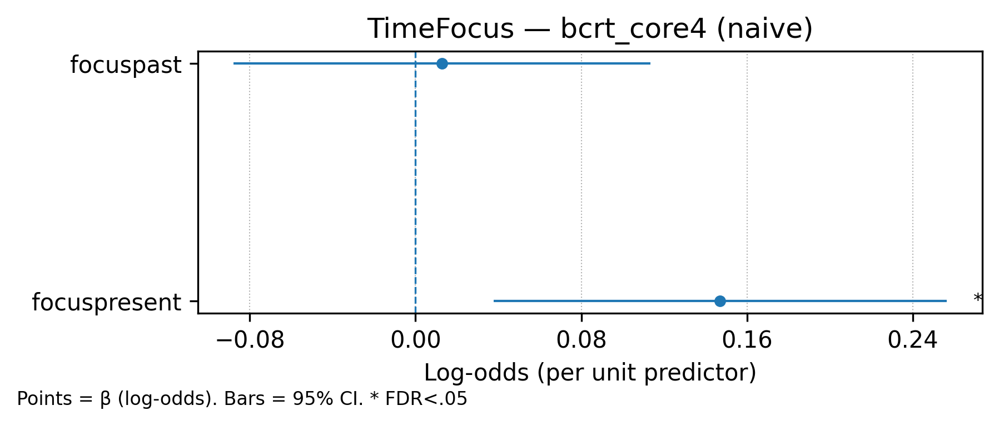

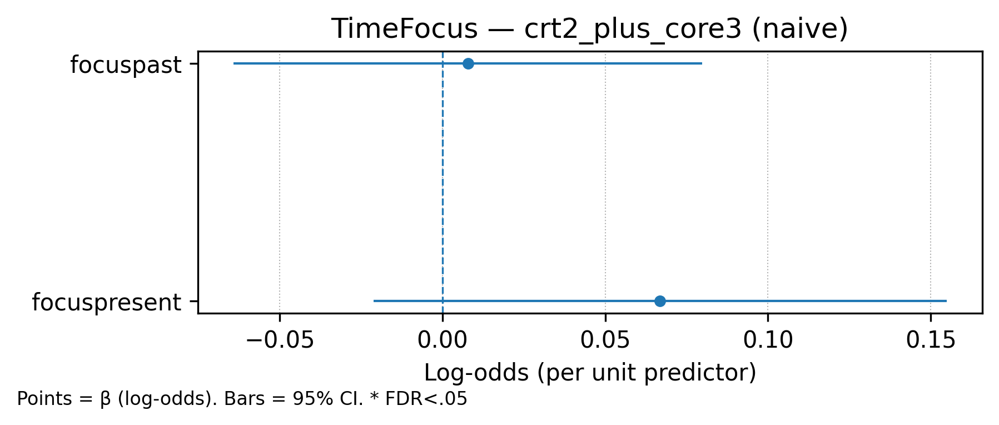

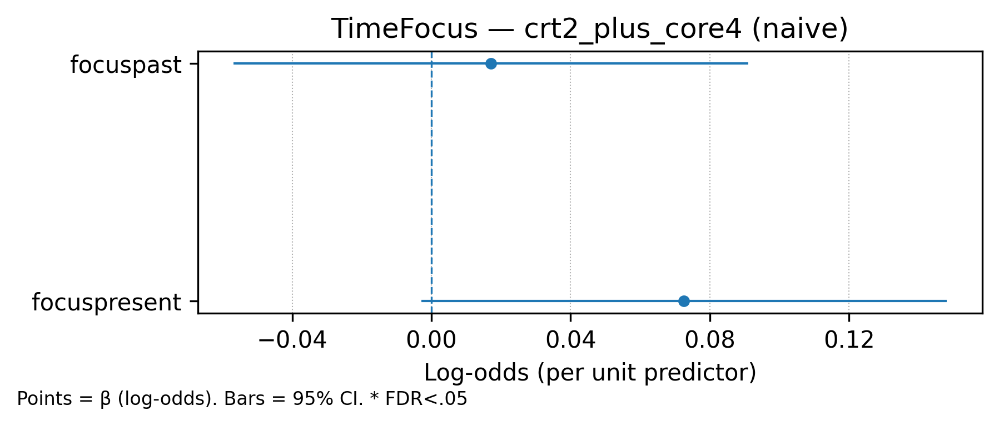

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
177,TimeFocus,focuspresent,bcrt_core4,bcrt_core4_total,0.147084,0.037755,0.256413,0.008368,0.016735,binomial_cluster,103


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
171,TimeFocus,focuspast,bcrt_core3,bcrt_core3_total,-0.024069,0.066875,-0.155144,0.107007,0.718916,0.718916,binomial_cluster,103
172,TimeFocus,focuspast,bcrt_core4,bcrt_core4_total,0.012770,0.051303,-0.087784,0.113324,0.803427,0.803427,binomial_cluster,103
173,TimeFocus,focuspast,crt2_plus_core3,crt2_plus_core3_total,0.007805,0.036697,-0.064121,0.079732,0.831566,0.831566,binomial_cluster,103
174,TimeFocus,focuspast,crt2_plus_core4,crt2_plus_core4_total,0.017146,0.037736,-0.056816,0.091108,0.649570,0.649570,binomial_cluster,103
170,TimeFocus,focuspast,crt2_total,crt2_total,0.041659,0.084267,-0.123504,0.206822,0.621044,0.621044,binomial_cluster,103
176,TimeFocus,focuspresent,bcrt_core3,bcrt_core3_total,0.140209,0.076247,-0.009236,0.289654,0.065934,0.131868,binomial_cluster,103
177,TimeFocus,focuspresent,bcrt_core4,bcrt_core4_total,0.147084,0.055780,0.037755,0.256413,0.008368,0.016735,binomial_cluster,103
178,TimeFocus,focuspresent,crt2_plus_core3,crt2_plus_core3_total,0.066866,0.044902,-0.021141,0.154873,0.136442,0.272883,binomial_cluster,103
179,TimeFocus,focuspresent,crt2_plus_core4,crt2_plus_core4_total,0.072565,0.038526,-0.002947,0.148076,0.059631,0.119262,binomial_cluster,103
175,TimeFocus,focuspresent,crt2_total,crt2_total,0.065283,0.077098,-0.085828,0.216395,0.397128,0.621044,binomial_cluster,103


### Family: Motivation — naive


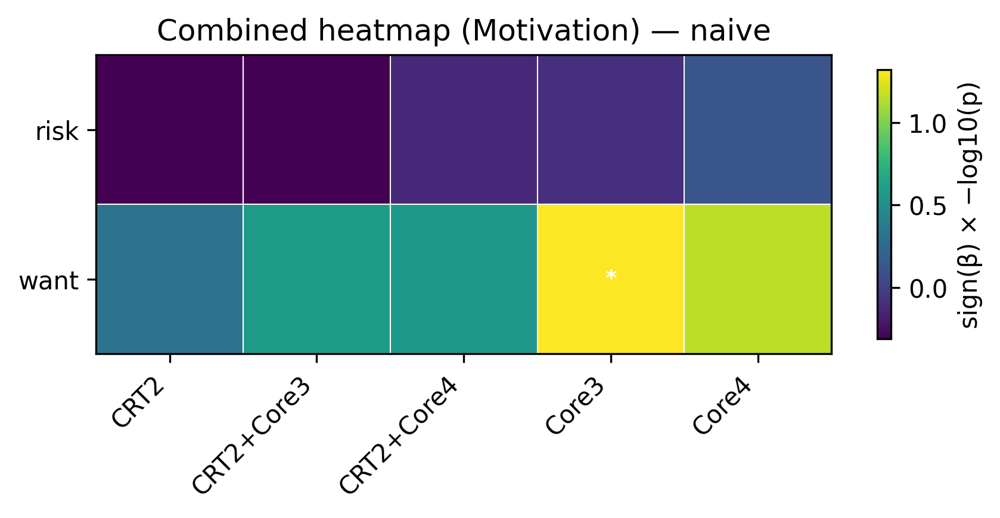

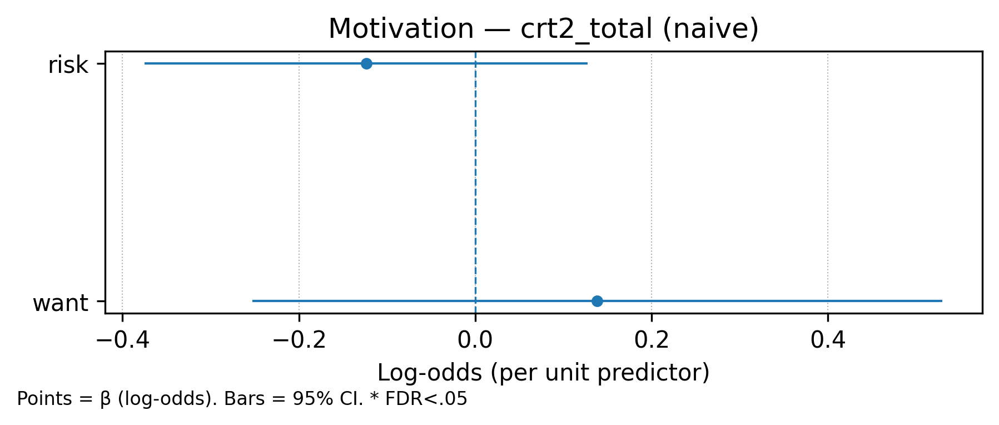

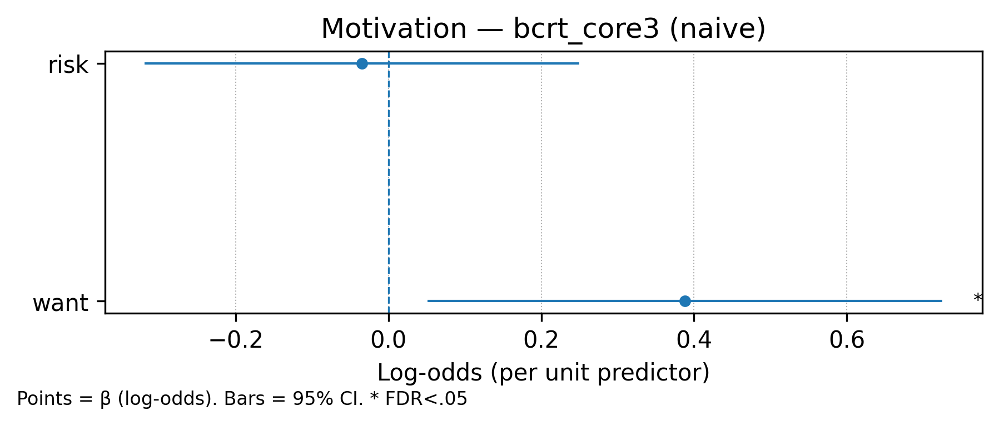

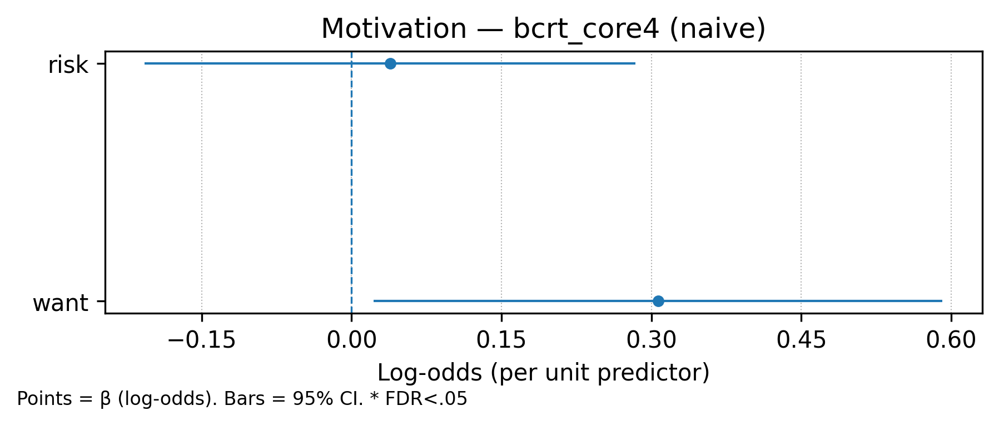

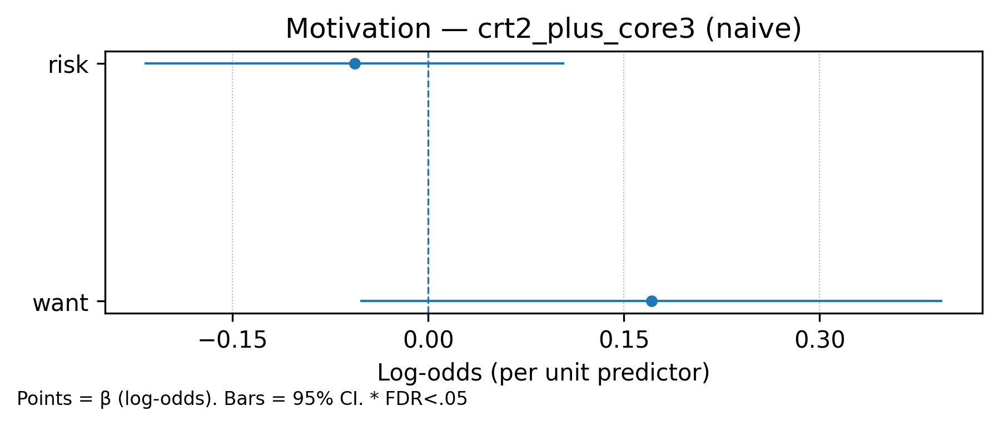

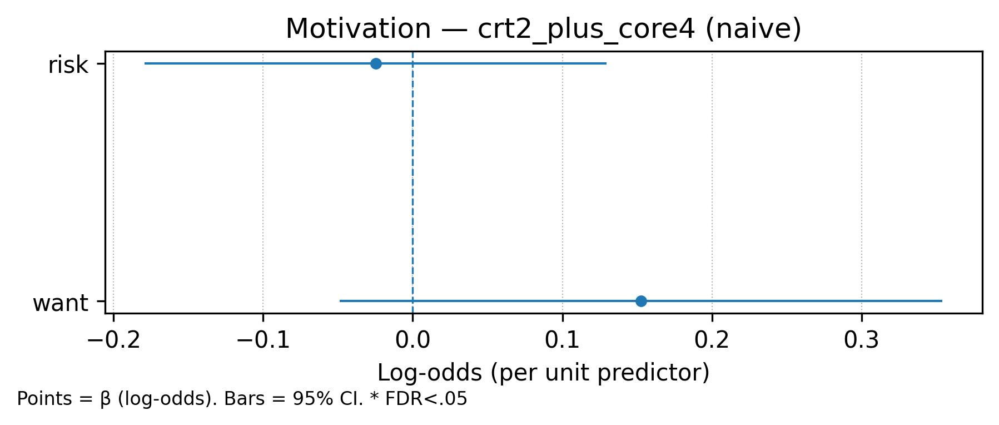

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
181,Motivation,want,bcrt_core3,bcrt_core3_total,0.3881,0.05124,0.724961,0.023937,0.047874,binomial_cluster,103


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
186,Motivation,risk,bcrt_core3,bcrt_core3_total,-0.034253,0.145099,-0.318647,0.250140,0.813379,0.813379,binomial_cluster,103
187,Motivation,risk,bcrt_core4,bcrt_core4_total,0.038524,0.125231,-0.206930,0.283977,0.758371,0.758371,binomial_cluster,103
188,Motivation,risk,crt2_plus_core3,crt2_plus_core3_total,-0.056509,0.081954,-0.217139,0.104121,0.490496,0.490496,binomial_cluster,103
189,Motivation,risk,crt2_plus_core4,crt2_plus_core4_total,-0.024897,0.078702,-0.179153,0.129359,0.751738,0.751738,binomial_cluster,103
185,Motivation,risk,crt2_total,crt2_total,-0.123717,0.128064,-0.374722,0.127288,0.334016,0.488116,binomial_cluster,103
181,Motivation,want,bcrt_core3,bcrt_core3_total,0.388100,0.171868,0.051240,0.724961,0.023937,0.047874,binomial_cluster,103
182,Motivation,want,bcrt_core4,bcrt_core4_total,0.306547,0.145245,0.021866,0.591227,0.034811,0.069623,binomial_cluster,103
183,Motivation,want,crt2_plus_core3,crt2_plus_core3_total,0.171105,0.113785,-0.051914,0.394124,0.132645,0.265290,binomial_cluster,103
184,Motivation,want,crt2_plus_core4,crt2_plus_core4_total,0.152654,0.102785,-0.048806,0.354113,0.137499,0.274998,binomial_cluster,103
180,Motivation,want,crt2_total,crt2_total,0.138438,0.199678,-0.252930,0.529807,0.488116,0.488116,binomial_cluster,103


In [8]:
# === GLMM displays — NAIVE dataset ===
from pathlib import Path
import pandas as pd, numpy as np
from IPython.display import display, Image

ds = "naive"

# ---------- MOSLEH GLMM ----------
print("## Mosleh GLMM — naive")
mos_fig_dir = FIGS / "mosleh_liwc" / "glmm" / ds
mos_tab_path = TABLES / "mosleh_liwc" / f"mosleh_liwc_glmm_{ds}.csv"
if not exists(mos_tab_path):
    # fallback to combined and filter
    mos_tab_path = TABLES / "mosleh_liwc" / "mosleh_liwc_glmm_combined.csv"

# Combined heatmap
mos_heatmap = mos_fig_dir / "mosleh_mosleh_combined_heatmap.png"
show_images([mos_heatmap])

# Forest plots (if present)
mos_sets = ["crt2_total", "bcrt_core3", "bcrt_core4", "crt2_plus_core3", "crt2_plus_core4"]
mos_forest_imgs = [mos_fig_dir / f"mosleh_{s}_forest.png" for s in mos_sets]
show_images(mos_forest_imgs)

# Table(s)
if mos_tab_path.exists():
    mos_df_all = pd.read_csv(mos_tab_path)
    if "dataset" in mos_df_all.columns:
        mos_df = mos_df_all[mos_df_all["dataset"] == ds].copy()
    else:
        mos_df = mos_df_all.copy()
    print(f"Rows: {len(mos_df)}")
    if not mos_df.empty:
        # Significant (FDR) first
        if "sig_adj" in mos_df.columns:
            mos_sig = mos_df[mos_df["sig_adj"] == True].copy()
        else:
            # fallback to raw p<.05 if needed
            mos_sig = mos_df[(mos_df.get("p_adj", mos_df.get("p_raw", np.nan)) < 0.05)].copy()
        mos_sig = mos_sig.sort_values(["base","set","predictor","p_adj" if "p_adj" in mos_sig.columns else "p_raw"])
        print("### Mosleh — significant (FDR<.05) rows")
        display(mos_sig[["base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","model","n"]] if not mos_sig.empty else mos_sig)

        print("### Mosleh — all rows")
        mos_df = mos_df.sort_values(["base","set","predictor","p_adj" if "p_adj" in mos_df.columns else "p_raw"])
        display(mos_df[["base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","model","n"]].head(500))
else:
    print("Mosleh GLMM table not found.")

print("\n")

# ---------- FAMILY GLMM ----------
print("## LIWC Family GLMM — naive")
fam_fig_dir = FIGS / "glmm_families" / ds

# Prefer multi-set table if present, else old crt2-only table
fam_tab_multi = TABLES / "liwc_families_glmm_crt_sets.csv"
fam_tab_single = TABLES / "liwc_families_glmm_crt2.csv"
fam_tab_path = fam_tab_multi if fam_tab_multi.exists() else fam_tab_single
exists(fam_tab_path)

if fam_tab_path.exists():
    fam_df_all = pd.read_csv(fam_tab_path)
    fam_df = fam_df_all[fam_df_all["dataset"] == ds].copy() if "dataset" in fam_df_all.columns else fam_df_all.copy()
    families = fam_df["family"].dropna().unique().tolist()
    for fam in families:
        print(f"### Family: {fam} — naive")

        # Combined heatmap (across all predictor sets/terms)
        fam_heatmap = fam_fig_dir / f"{fam}_combined_heatmap.png"
        show_images([fam_heatmap])

        # Forest plots (one per set)
        fam_sets = fam_df[fam_df["family"] == fam]["set"].dropna().unique().tolist()
        fam_forest_imgs = [fam_fig_dir / f"{fam}_{s}_forest.png" for s in fam_sets]
        show_images(fam_forest_imgs)

        # Tables for this family
        sub = fam_df[fam_df["family"] == fam].copy()
        # Significant (FDR) first
        if "sig_adj" in sub.columns:
            sig = sub[sub["sig_adj"] == True].copy()
        else:
            sig = sub[(sub.get("p_adj", sub.get("p_raw", np.nan)) < 0.05)].copy()
        sig = sig.sort_values(["base","set","predictor","p_adj" if "p_adj" in sig.columns else "p_raw"])
        print("Significant (FDR<.05)")
        cols = ["family","base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","model","n"] if "model" in sub.columns else ["family","base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","n"]
        display(sig[cols] if not sig.empty else sig)

        print("All rows")
        sub = sub.sort_values(["base","set","predictor","p_adj" if "p_adj" in sub.columns else "p_raw"])
        cols_all = ["family","base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","model","n"] if "model" in sub.columns else ["family","base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","n"]
        display(sub[cols_all].head(800))
else:
    print("Family GLMM table not found.")

# 6. LIWC - GLMM for Mosleh only + Families (Full)

## Mosleh GLMM — full
✓ ../reports/tables/mosleh_liwc/mosleh_liwc_glmm_full.csv


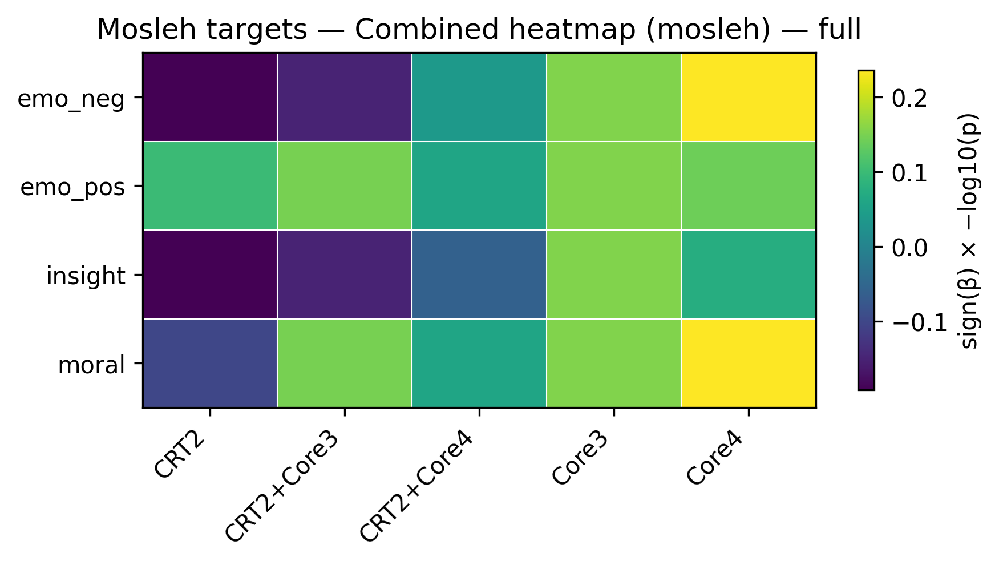

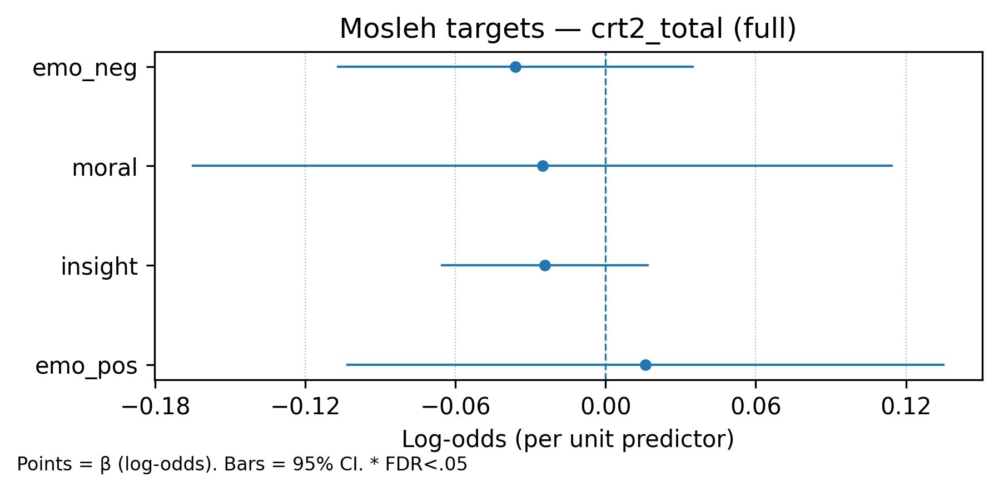

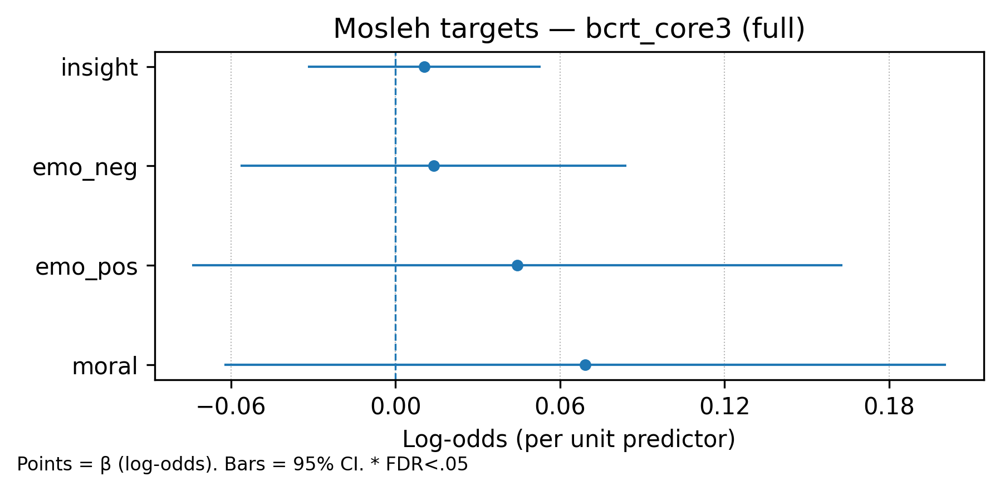

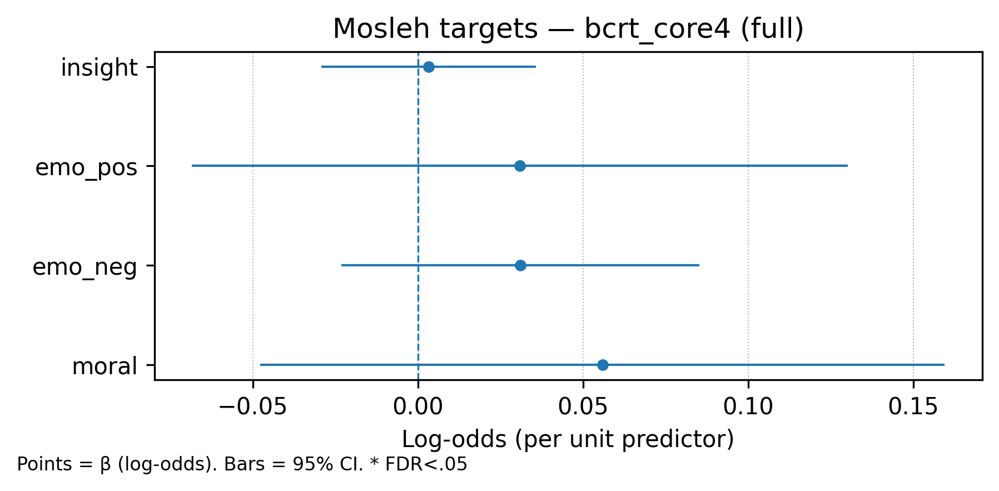

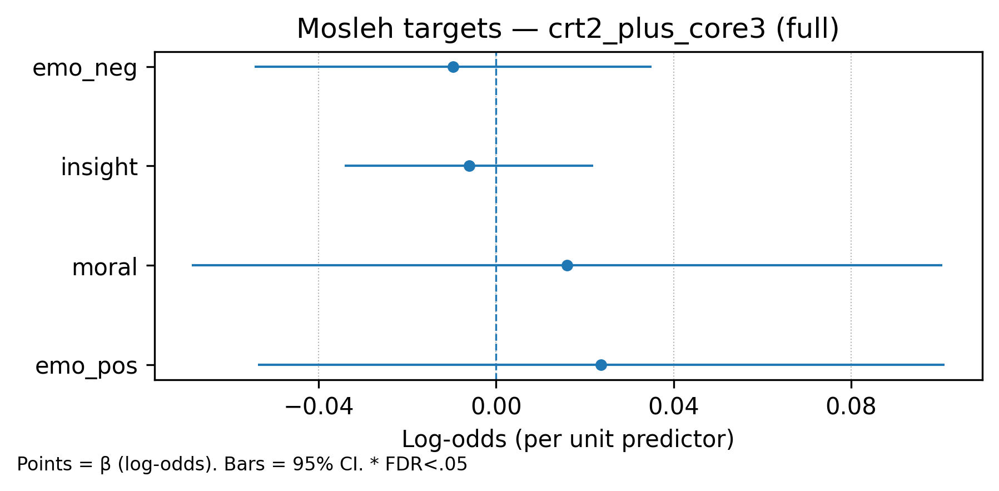

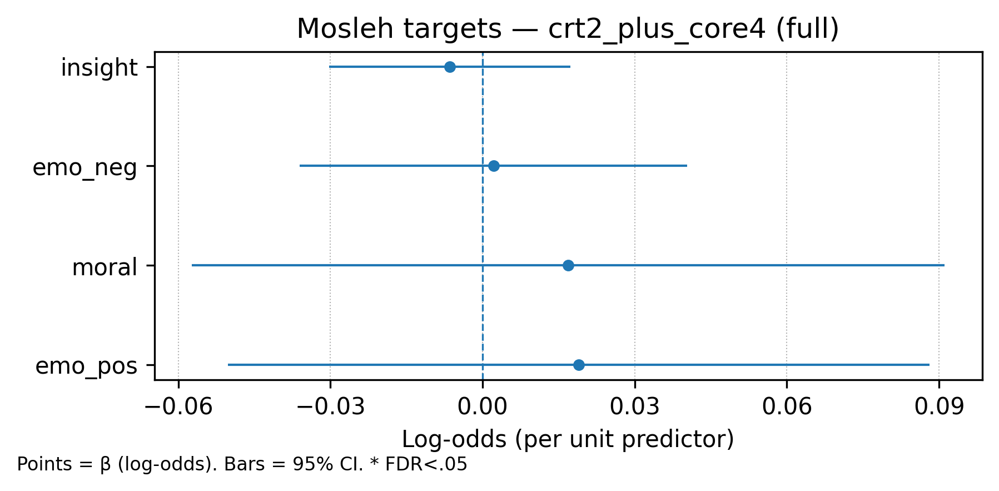

Rows: 20
### Mosleh — significant (FDR<.05) rows


,dataset,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,model,n,z,p_adj,sig_adj


### Mosleh — all rows


,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
5,emo_neg,bcrt_core3,bcrt_core3_total,0.013871,0.035895,-0.056484,0.084226,0.699178,0.699178,binomial_cluster,477
9,emo_neg,bcrt_core4,bcrt_core4_total,0.031054,0.027659,-0.023158,0.085266,0.261543,0.581272,binomial_cluster,477
13,emo_neg,crt2_plus_core3,crt2_plus_core3_total,-0.009669,0.022806,-0.054369,0.035032,0.671605,0.710206,binomial_cluster,477
17,emo_neg,crt2_plus_core4,crt2_plus_core4_total,0.002155,0.019500,-0.036064,0.040375,0.911989,0.911989,binomial_cluster,477
1,emo_neg,crt2_total,crt2_total,-0.036053,0.036366,-0.107330,0.035225,0.321495,0.642991,binomial_cluster,477
6,emo_pos,bcrt_core3,bcrt_core3_total,0.044493,0.060480,-0.074049,0.163034,0.461940,0.699178,binomial_cluster,477
10,emo_pos,bcrt_core4,bcrt_core4_total,0.030855,0.050637,-0.068394,0.130104,0.542306,0.723075,binomial_cluster,477
14,emo_pos,crt2_plus_core3,crt2_plus_core3_total,0.023708,0.039491,-0.053694,0.101111,0.548279,0.710206,binomial_cluster,477
18,emo_pos,crt2_plus_core4,crt2_plus_core4_total,0.018975,0.035272,-0.050158,0.088107,0.590608,0.873627,binomial_cluster,477
2,emo_pos,crt2_total,crt2_total,0.015928,0.061005,-0.103642,0.135498,0.794021,0.794021,binomial_cluster,477




## LIWC Family GLMM — full
✓ ../reports/tables/liwc_families_glmm_crt_sets.csv
### Family: FunctionAnalytic — full


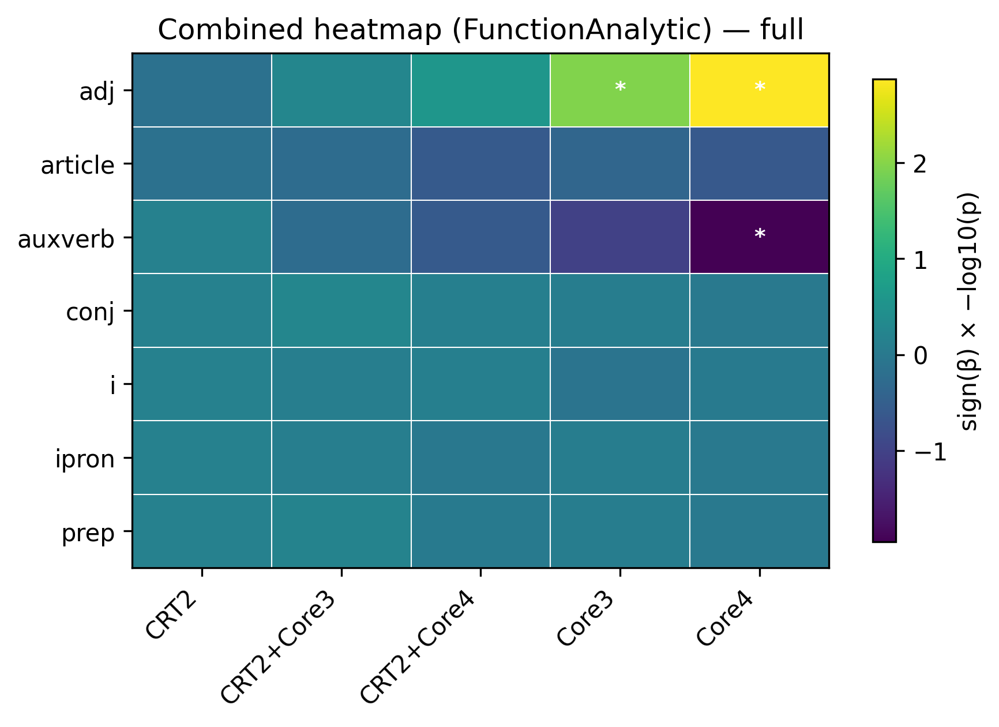

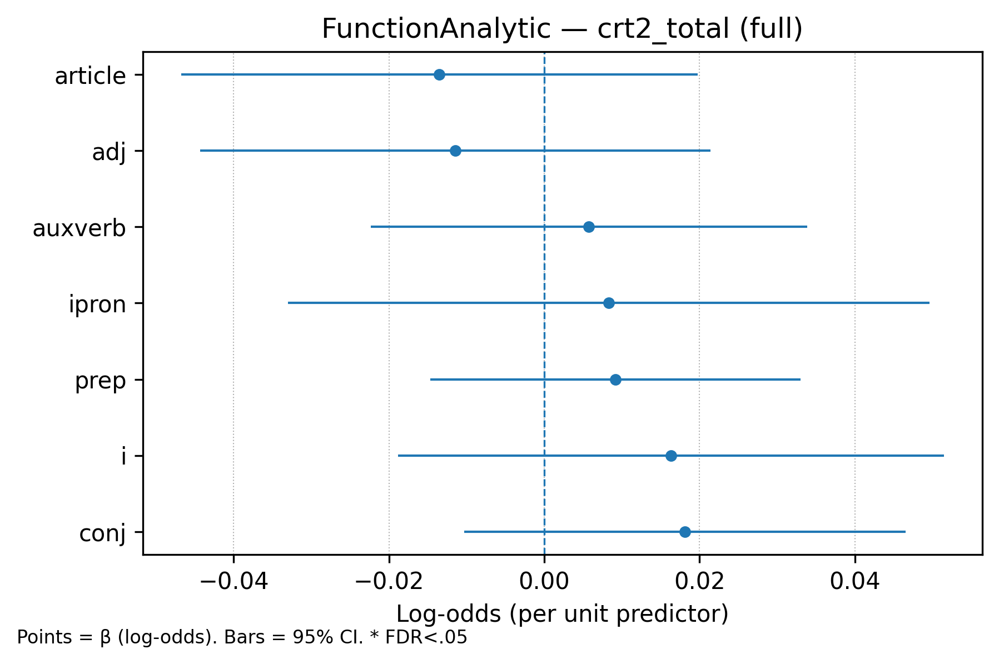

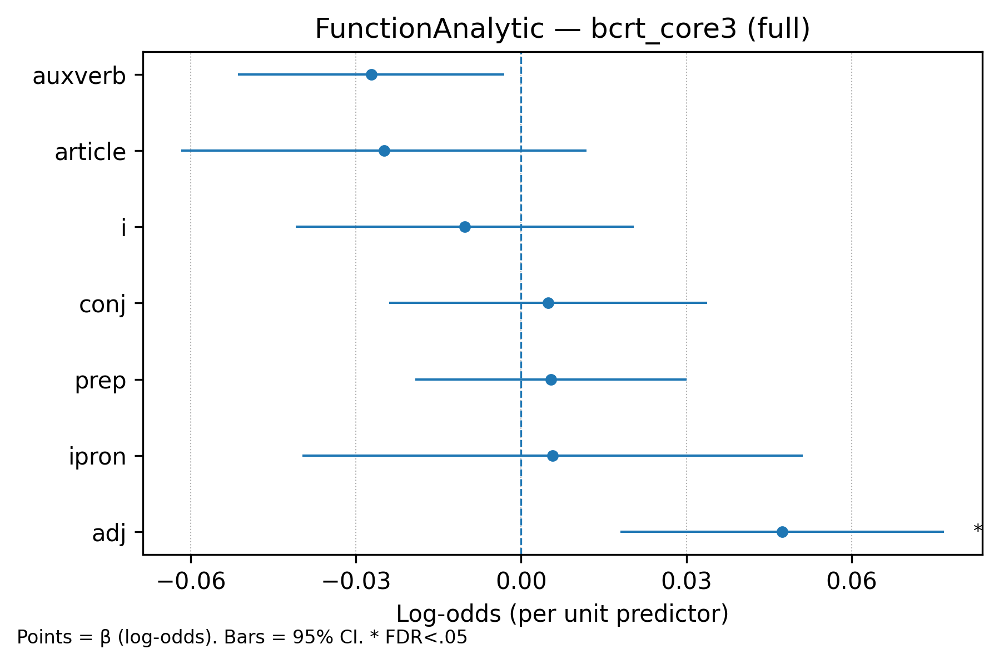

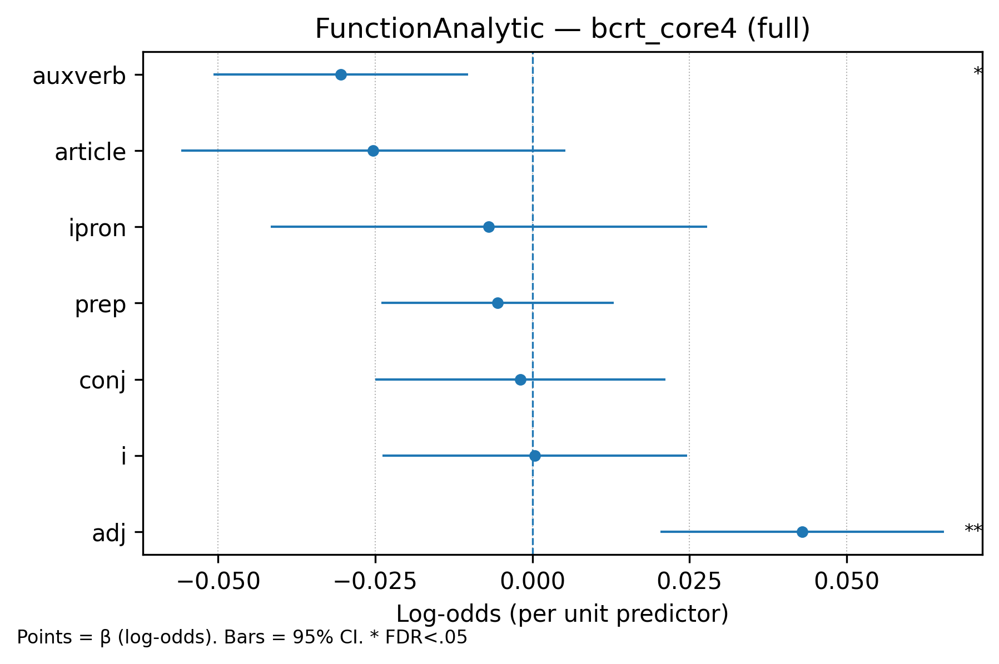

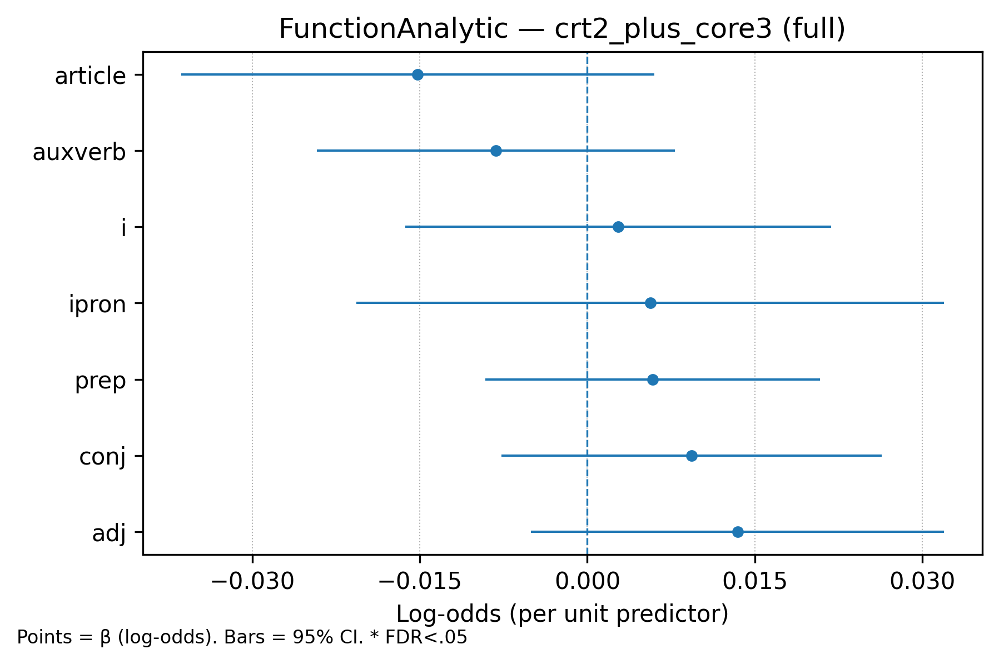

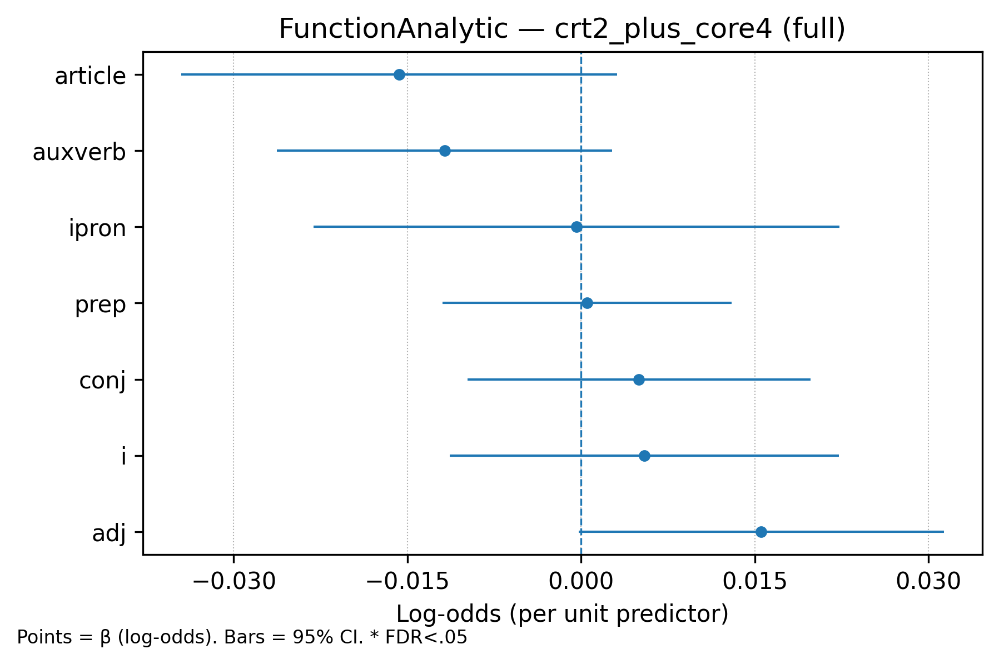

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
31,FunctionAnalytic,adj,bcrt_core3,bcrt_core3_total,0.047442,0.018075,0.076810,0.001544,0.010807,binomial_cluster,477
32,FunctionAnalytic,adj,bcrt_core4,bcrt_core4_total,0.042951,0.020386,0.065515,0.000191,0.001336,binomial_cluster,477
22,FunctionAnalytic,auxverb,bcrt_core4,bcrt_core4_total,-0.030468,-0.050709,-0.010227,0.003175,0.011113,binomial_cluster,477


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
31,FunctionAnalytic,adj,bcrt_core3,bcrt_core3_total,0.047442,0.014983,0.018075,0.076810,0.001544,0.010807,binomial_cluster,477
32,FunctionAnalytic,adj,bcrt_core4,bcrt_core4_total,0.042951,0.011513,0.020386,0.065515,0.000191,0.001336,binomial_cluster,477
33,FunctionAnalytic,adj,crt2_plus_core3,crt2_plus_core3_total,0.013465,0.009438,-0.005033,0.031963,0.153668,0.556340,binomial_cluster,477
34,FunctionAnalytic,adj,crt2_plus_core4,crt2_plus_core4_total,0.015558,0.008053,-0.000226,0.031343,0.053370,0.256601,binomial_cluster,477
30,FunctionAnalytic,adj,crt2_total,crt2_total,-0.011485,0.016767,-0.044349,0.021379,0.493367,0.690714,binomial_cluster,477
1,FunctionAnalytic,article,bcrt_core3,bcrt_core3_total,-0.024925,0.018795,-0.061763,0.011913,0.184792,0.431181,binomial_cluster,477
2,FunctionAnalytic,article,bcrt_core4,bcrt_core4_total,-0.025318,0.015598,-0.055890,0.005254,0.104554,0.243960,binomial_cluster,477
3,FunctionAnalytic,article,crt2_plus_core3,crt2_plus_core3_total,-0.015188,0.010816,-0.036386,0.006011,0.160258,0.556340,binomial_cluster,477
4,FunctionAnalytic,article,crt2_plus_core4,crt2_plus_core4_total,-0.015722,0.009605,-0.034548,0.003103,0.101645,0.256601,binomial_cluster,477
0,FunctionAnalytic,article,crt2_total,crt2_total,-0.013508,0.016981,-0.046790,0.019774,0.426324,0.690714,binomial_cluster,477


### Family: CognitiveComplexity — full


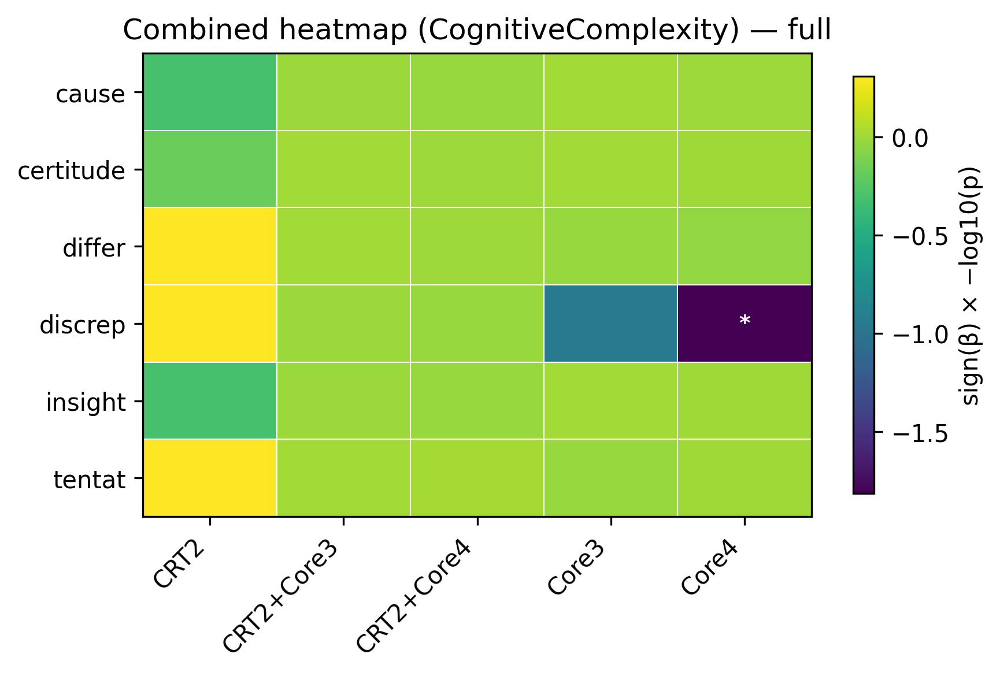

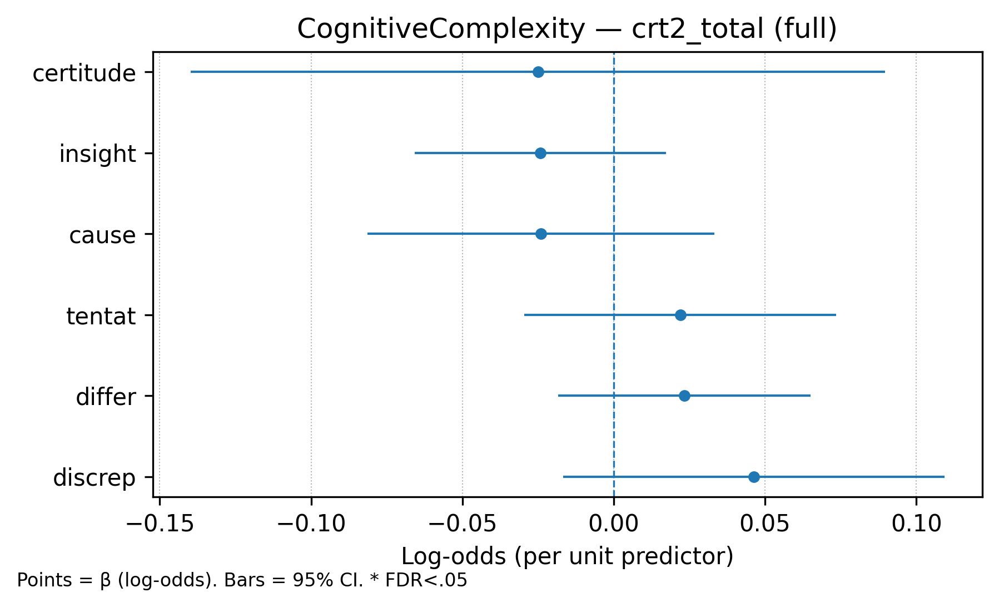

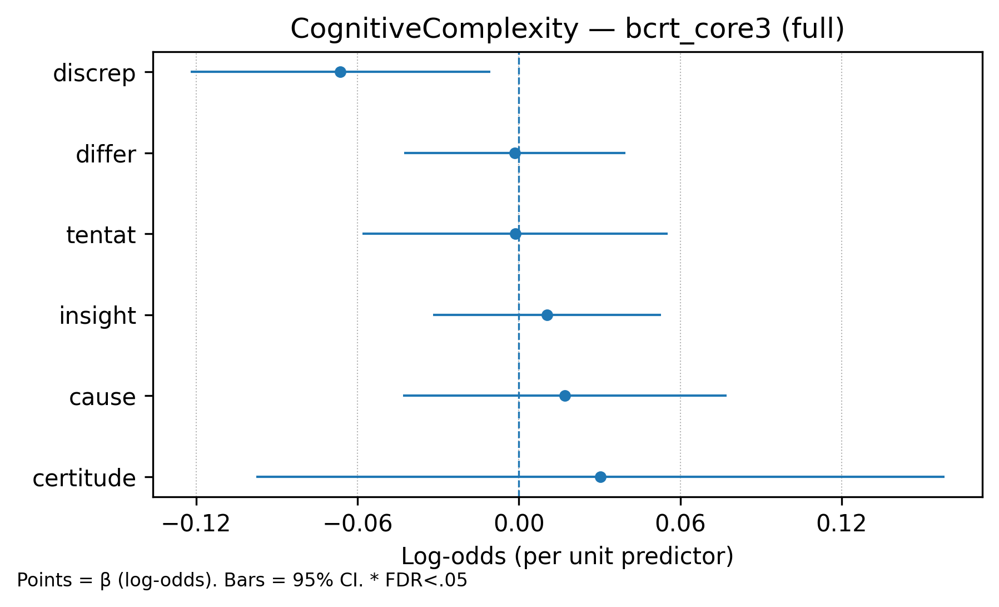

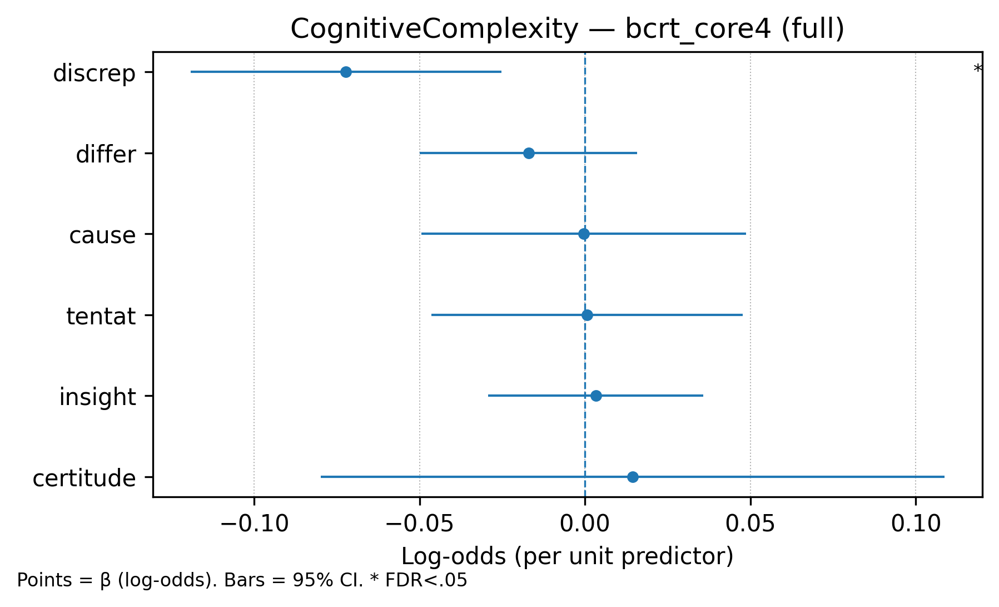

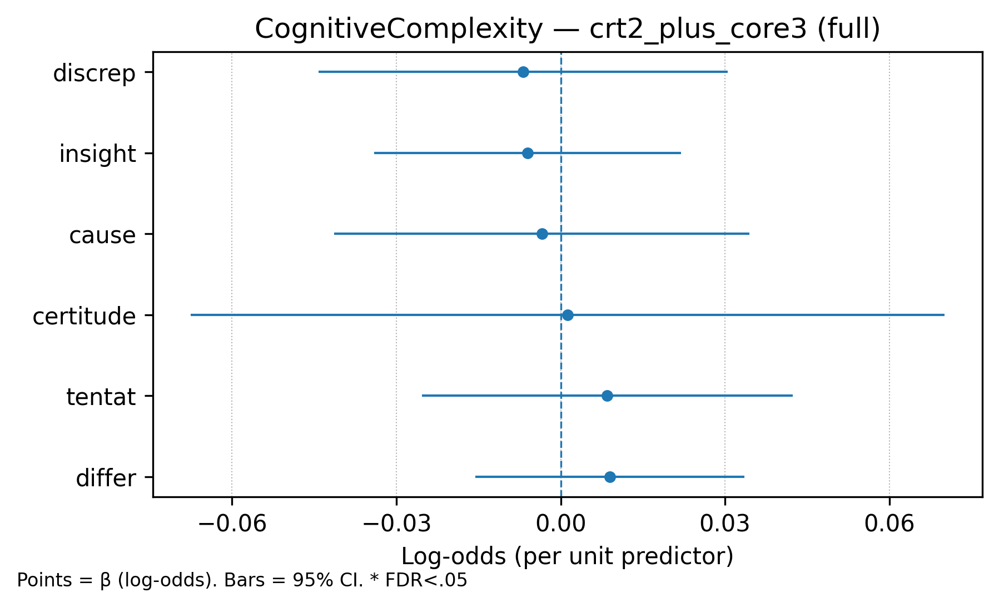

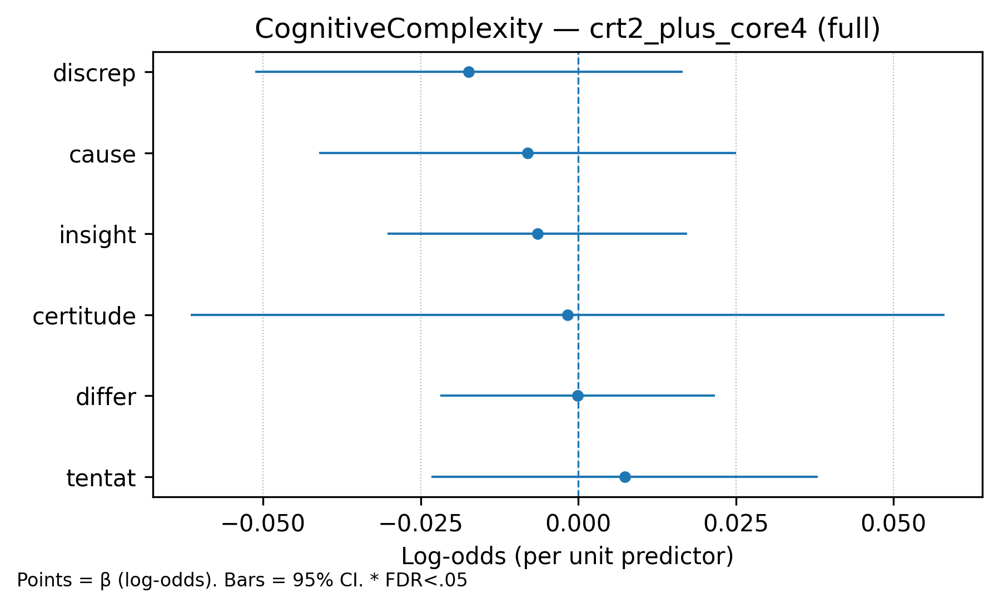

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
47,CognitiveComplexity,discrep,bcrt_core4,bcrt_core4_total,-0.072241,-0.11918,-0.025302,0.002557,0.015342,binomial_cluster,477


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
41,CognitiveComplexity,cause,bcrt_core3,bcrt_core3_total,0.017062,0.030705,-0.043120,0.077243,0.578442,0.961831,binomial_cluster,477
42,CognitiveComplexity,cause,bcrt_core4,bcrt_core4_total,-0.000394,0.025036,-0.049464,0.048676,0.987446,0.987446,binomial_cluster,477
43,CognitiveComplexity,cause,crt2_plus_core3,crt2_plus_core3_total,-0.003436,0.019331,-0.041324,0.034452,0.858921,0.971156,binomial_cluster,477
44,CognitiveComplexity,cause,crt2_plus_core4,crt2_plus_core4_total,-0.008038,0.016874,-0.041112,0.025035,0.633824,0.956908,binomial_cluster,477
40,CognitiveComplexity,cause,crt2_total,crt2_total,-0.024066,0.029232,-0.081360,0.033229,0.410362,0.492434,binomial_cluster,477
61,CognitiveComplexity,certitude,bcrt_core3,bcrt_core3_total,0.030337,0.065293,-0.097637,0.158311,0.642195,0.961831,binomial_cluster,477
62,CognitiveComplexity,certitude,bcrt_core4,bcrt_core4_total,0.014434,0.048112,-0.079866,0.108733,0.764175,0.987446,binomial_cluster,477
63,CognitiveComplexity,certitude,crt2_plus_core3,crt2_plus_core3_total,0.001270,0.035120,-0.067564,0.070104,0.971156,0.971156,binomial_cluster,477
64,CognitiveComplexity,certitude,crt2_plus_core4,crt2_plus_core4_total,-0.001687,0.030500,-0.061468,0.058094,0.955895,0.992727,binomial_cluster,477
60,CognitiveComplexity,certitude,crt2_total,crt2_total,-0.025052,0.058544,-0.139798,0.089694,0.668711,0.668711,binomial_cluster,477


### Family: ToneAffect — full


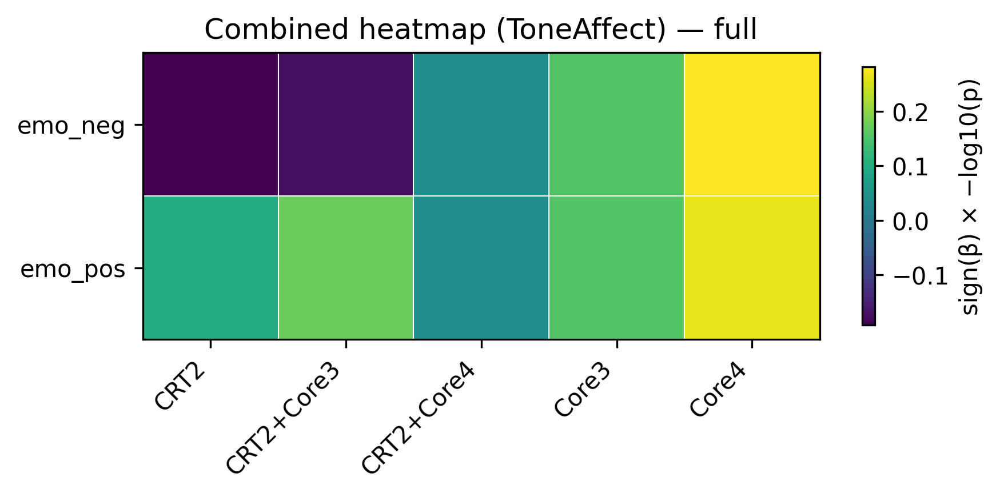

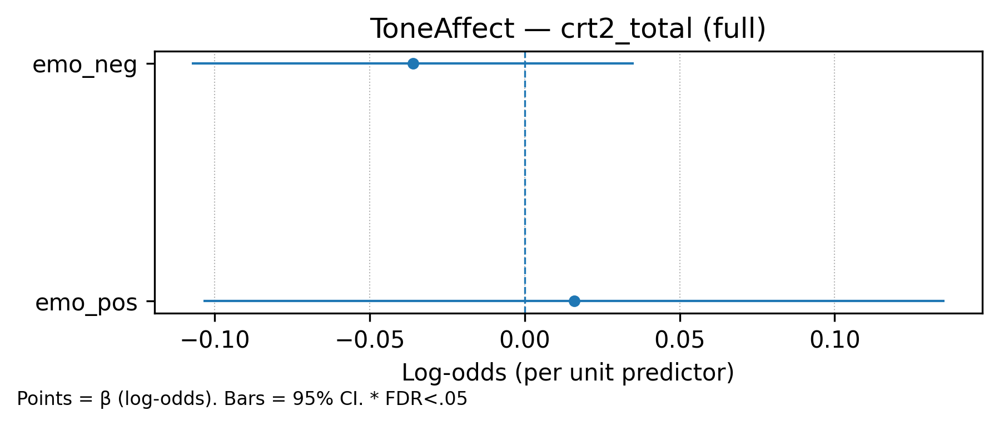

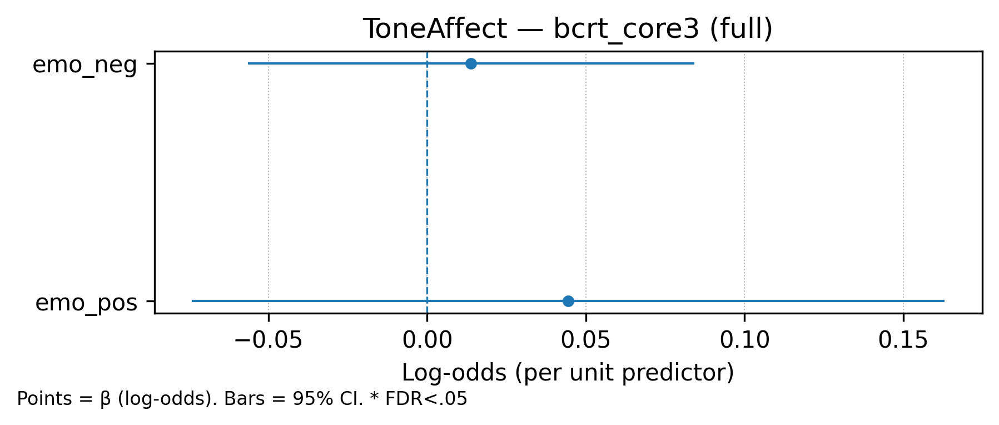

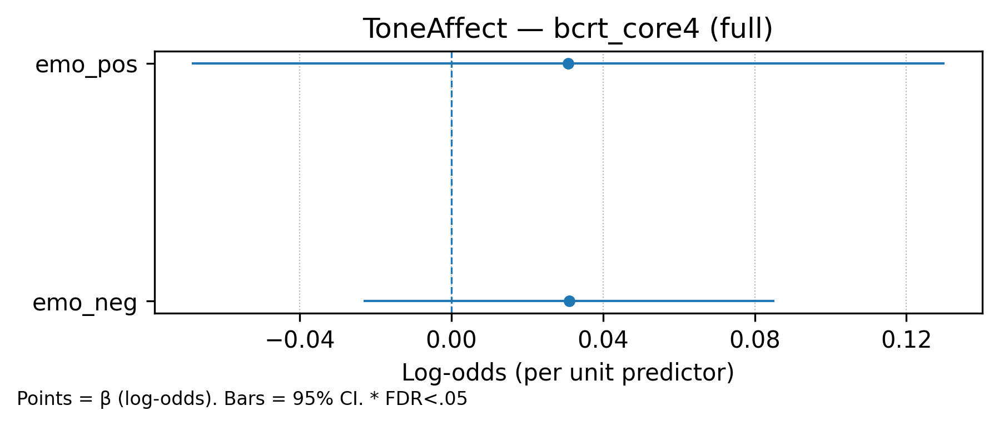

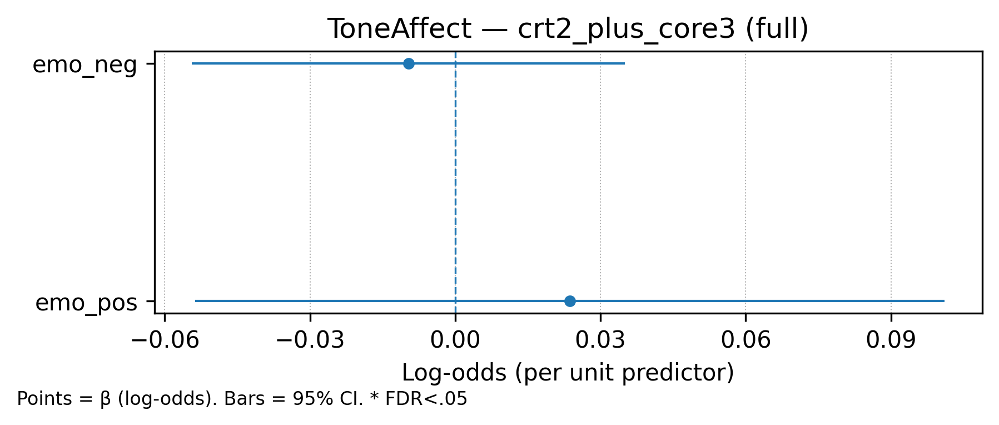

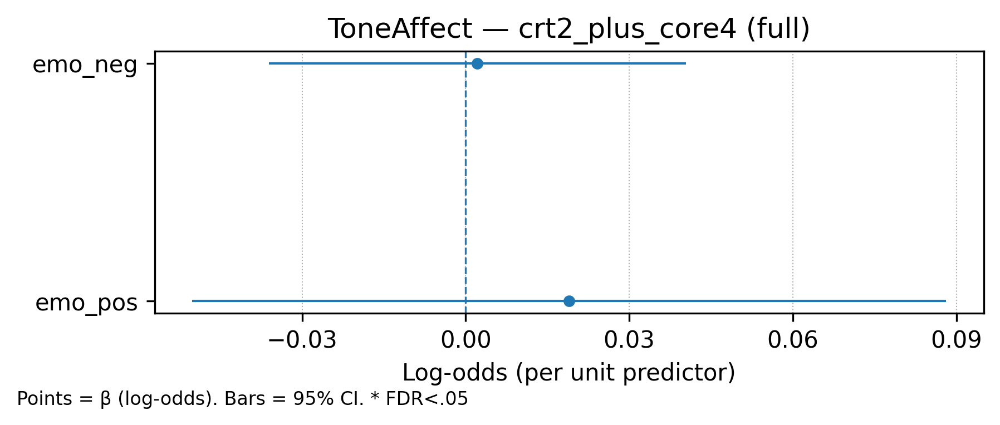

Significant (FDR<.05)


,dataset,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,model,n,z,p_adj,sig_adj


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
71,ToneAffect,emo_neg,bcrt_core3,bcrt_core3_total,0.013871,0.035895,-0.056484,0.084226,0.699178,0.699178,binomial_cluster,477
72,ToneAffect,emo_neg,bcrt_core4,bcrt_core4_total,0.031054,0.027659,-0.023158,0.085266,0.261543,0.523087,binomial_cluster,477
73,ToneAffect,emo_neg,crt2_plus_core3,crt2_plus_core3_total,-0.009669,0.022806,-0.054369,0.035032,0.671605,0.671605,binomial_cluster,477
74,ToneAffect,emo_neg,crt2_plus_core4,crt2_plus_core4_total,0.002155,0.019500,-0.036064,0.040375,0.911989,0.911989,binomial_cluster,477
70,ToneAffect,emo_neg,crt2_total,crt2_total,-0.036053,0.036366,-0.107330,0.035225,0.321495,0.642991,binomial_cluster,477
66,ToneAffect,emo_pos,bcrt_core3,bcrt_core3_total,0.044493,0.060480,-0.074049,0.163034,0.461940,0.699178,binomial_cluster,477
67,ToneAffect,emo_pos,bcrt_core4,bcrt_core4_total,0.030855,0.050637,-0.068394,0.130104,0.542306,0.542306,binomial_cluster,477
68,ToneAffect,emo_pos,crt2_plus_core3,crt2_plus_core3_total,0.023708,0.039491,-0.053694,0.101111,0.548279,0.671605,binomial_cluster,477
69,ToneAffect,emo_pos,crt2_plus_core4,crt2_plus_core4_total,0.018975,0.035272,-0.050158,0.088107,0.590608,0.911989,binomial_cluster,477
65,ToneAffect,emo_pos,crt2_total,crt2_total,0.015928,0.061005,-0.103642,0.135498,0.794021,0.794021,binomial_cluster,477


### Family: TimeFocus — full


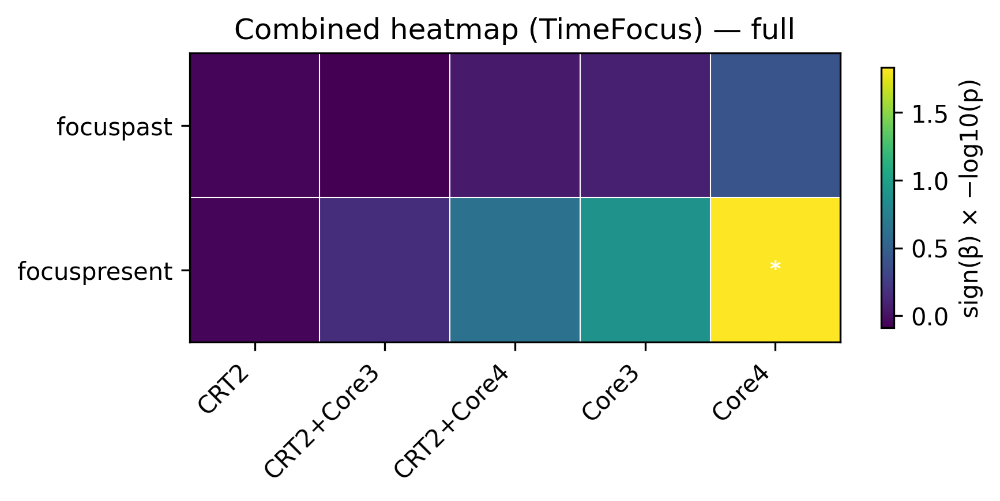

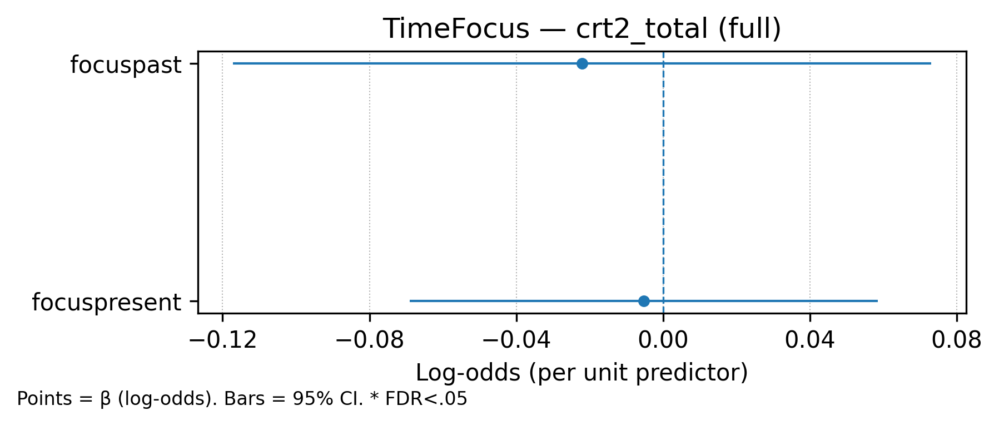

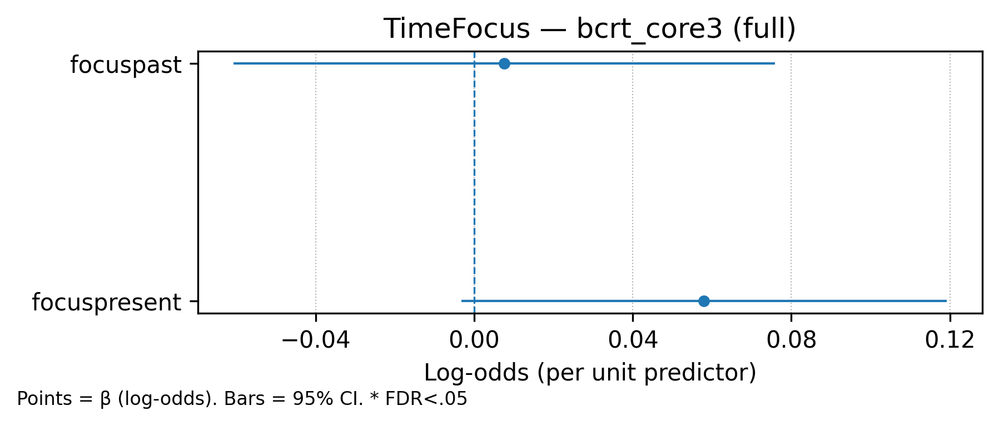

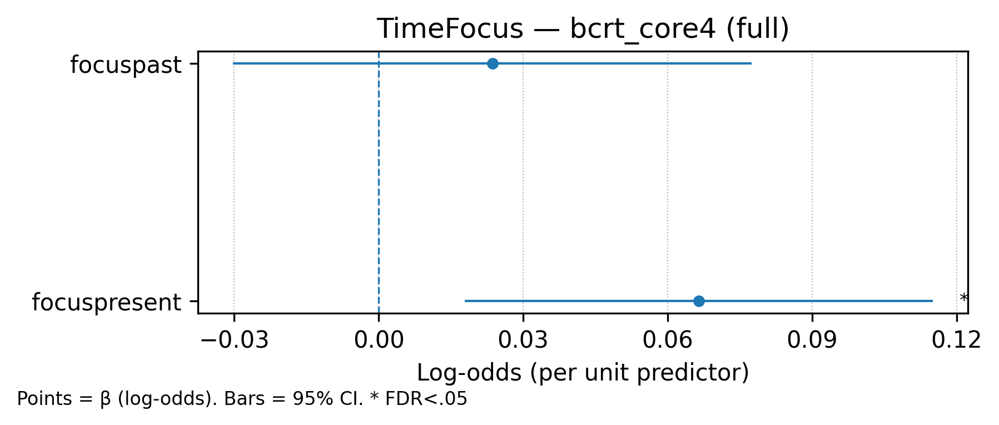

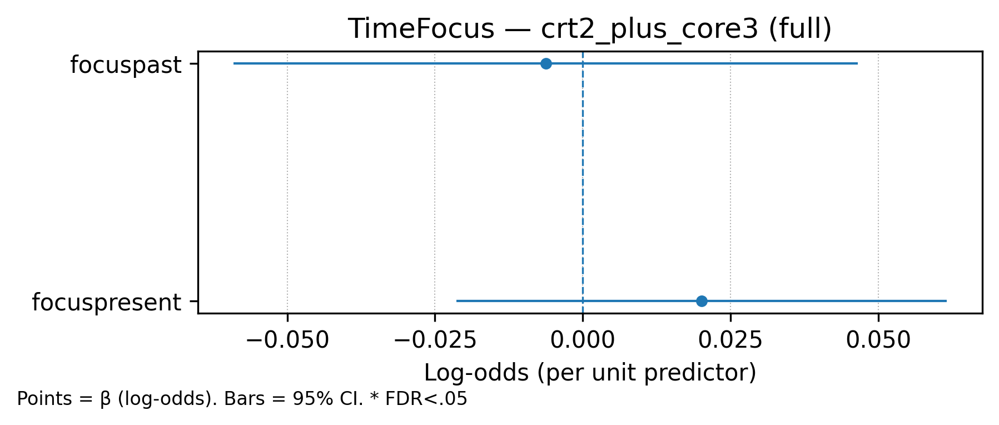

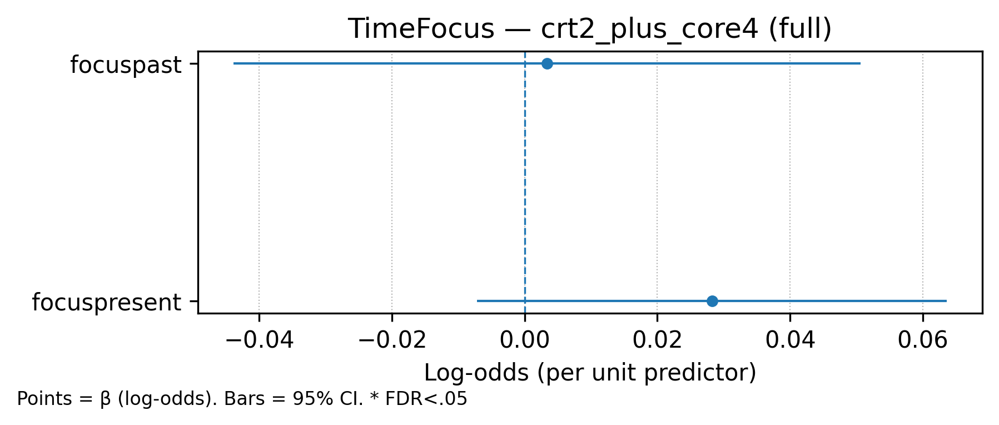

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
82,TimeFocus,focuspresent,bcrt_core4,bcrt_core4_total,0.066476,0.017845,0.115108,0.00738,0.014759,binomial_cluster,477


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
76,TimeFocus,focuspast,bcrt_core3,bcrt_core3_total,0.007579,0.034828,-0.060685,0.075842,0.827738,0.827738,binomial_cluster,477
77,TimeFocus,focuspast,bcrt_core4,bcrt_core4_total,0.023600,0.027475,-0.030251,0.077451,0.390365,0.390365,binomial_cluster,477
78,TimeFocus,focuspast,crt2_plus_core3,crt2_plus_core3_total,-0.006241,0.026947,-0.059056,0.046574,0.816841,0.816841,binomial_cluster,477
79,TimeFocus,focuspast,crt2_plus_core4,crt2_plus_core4_total,0.003373,0.024104,-0.043871,0.050617,0.888708,0.888708,binomial_cluster,477
75,TimeFocus,focuspast,crt2_total,crt2_total,-0.022031,0.048554,-0.117197,0.073136,0.650022,0.871014,binomial_cluster,477
81,TimeFocus,focuspresent,bcrt_core3,bcrt_core3_total,0.057981,0.031229,-0.003228,0.119190,0.063364,0.126728,binomial_cluster,477
82,TimeFocus,focuspresent,bcrt_core4,bcrt_core4_total,0.066476,0.024812,0.017845,0.115108,0.007380,0.014759,binomial_cluster,477
83,TimeFocus,focuspresent,crt2_plus_core3,crt2_plus_core3_total,0.020118,0.021146,-0.021328,0.061563,0.341405,0.682810,binomial_cluster,477
84,TimeFocus,focuspresent,crt2_plus_core4,crt2_plus_core4_total,0.028225,0.018053,-0.007159,0.063608,0.117946,0.235893,binomial_cluster,477
80,TimeFocus,focuspresent,crt2_total,crt2_total,-0.005281,0.032523,-0.069026,0.058465,0.871014,0.871014,binomial_cluster,477


### Family: Motivation — full


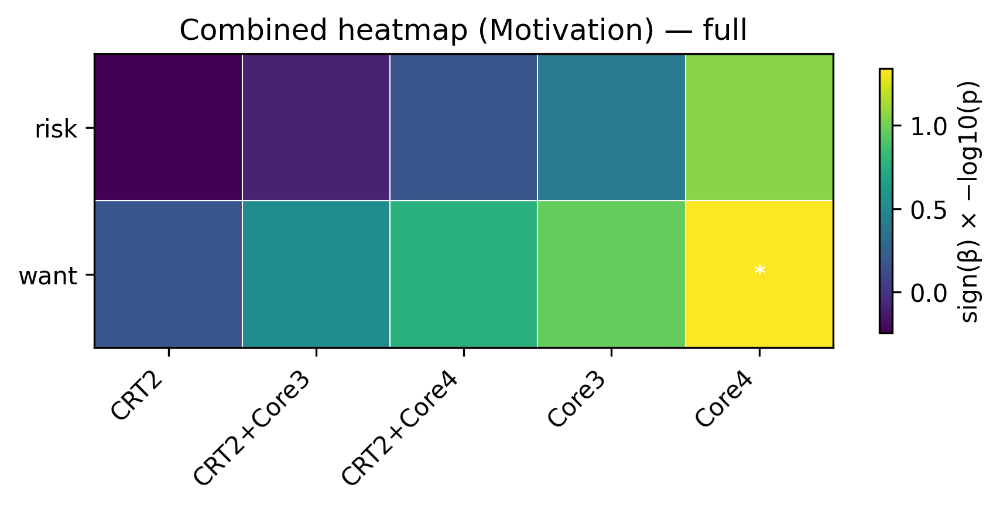

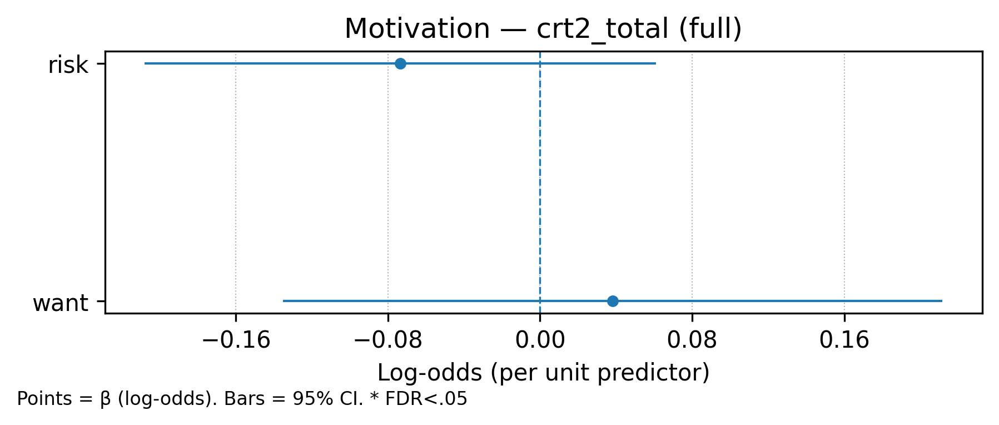

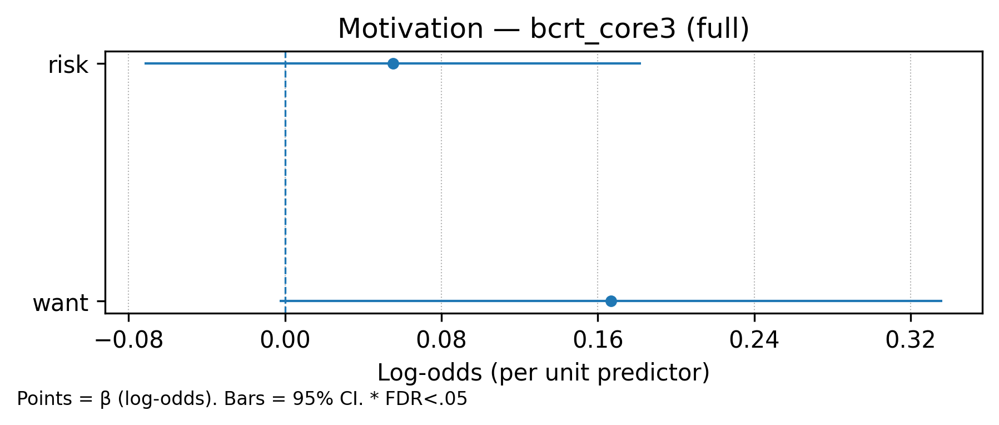

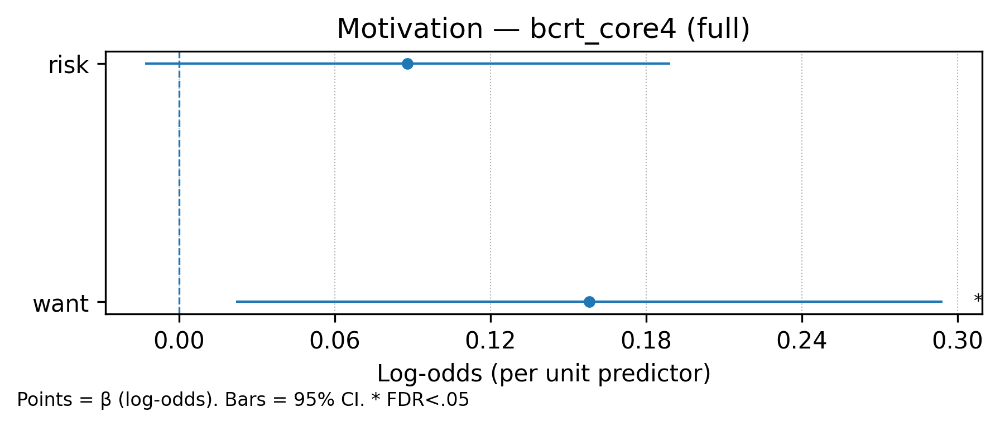

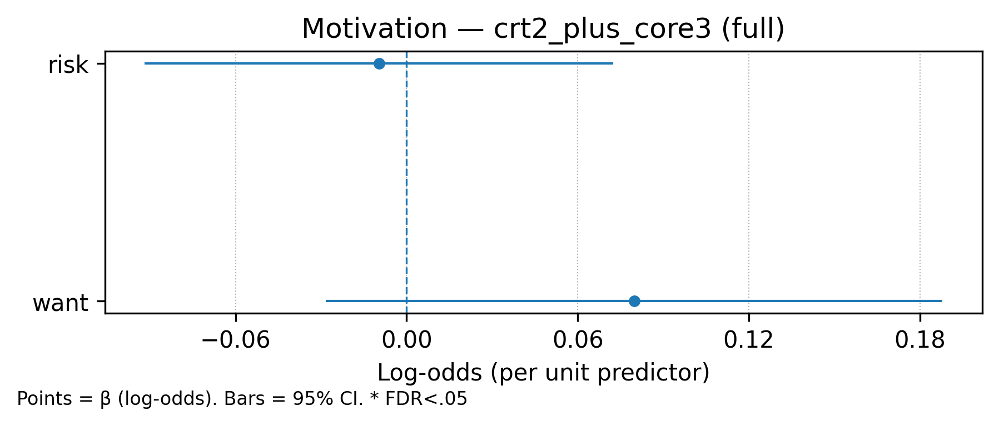

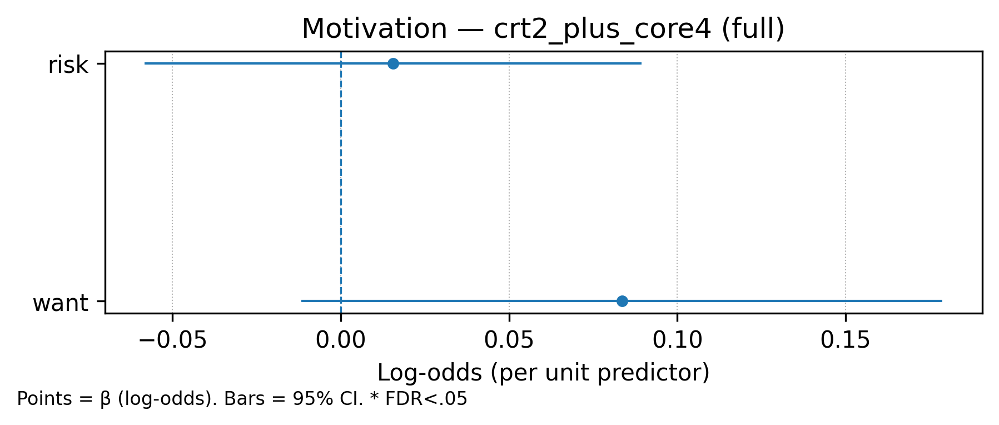

Significant (FDR<.05)


,family,base,set,predictor,beta,ci_lo,ci_hi,p_raw,p_adj,model,n
87,Motivation,want,bcrt_core4,bcrt_core4_total,0.158142,0.021993,0.294291,0.022809,0.045619,binomial_cluster,477


All rows


,family,base,set,predictor,beta,se,ci_lo,ci_hi,p_raw,p_adj,model,n
91,Motivation,risk,bcrt_core3,bcrt_core3_total,0.055219,0.064767,-0.071725,0.182163,0.393898,0.393898,binomial_cluster,477
92,Motivation,risk,bcrt_core4,bcrt_core4_total,0.088124,0.051608,-0.013027,0.189275,0.087716,0.087716,binomial_cluster,477
93,Motivation,risk,crt2_plus_core3,crt2_plus_core3_total,-0.009674,0.041899,-0.091796,0.072447,0.817393,0.817393,binomial_cluster,477
94,Motivation,risk,crt2_plus_core4,crt2_plus_core4_total,0.015552,0.037650,-0.058242,0.089347,0.679553,0.679553,binomial_cluster,477
90,Motivation,risk,crt2_total,crt2_total,-0.073402,0.068629,-0.207916,0.061112,0.284826,0.569651,binomial_cluster,477
86,Motivation,want,bcrt_core3,bcrt_core3_total,0.166837,0.086466,-0.002635,0.336310,0.053666,0.107332,binomial_cluster,477
87,Motivation,want,bcrt_core4,bcrt_core4_total,0.158142,0.069464,0.021993,0.294291,0.022809,0.045619,binomial_cluster,477
88,Motivation,want,crt2_plus_core3,crt2_plus_core3_total,0.079749,0.055169,-0.028382,0.187881,0.148304,0.296608,binomial_cluster,477
89,Motivation,want,crt2_plus_core4,crt2_plus_core4_total,0.083535,0.048607,-0.011736,0.178805,0.085694,0.171388,binomial_cluster,477
85,Motivation,want,crt2_total,crt2_total,0.038188,0.088523,-0.135318,0.211693,0.666186,0.666186,binomial_cluster,477


In [9]:
# === GLMM displays — FULL dataset ===
from pathlib import Path
import pandas as pd, numpy as np
from IPython.display import display, Image

ds = "full"

# ---------- MOSLEH GLMM ----------
print("## Mosleh GLMM — full")
mos_fig_dir = FIGS / "mosleh_liwc" / "glmm" / ds
mos_tab_path = TABLES / "mosleh_liwc" / f"mosleh_liwc_glmm_{ds}.csv"
if not exists(mos_tab_path):
    # fallback to combined and filter
    mos_tab_path = TABLES / "mosleh_liwc" / "mosleh_liwc_glmm_combined.csv"

# Combined heatmap
mos_heatmap = mos_fig_dir / "mosleh_mosleh_combined_heatmap.png"
show_images([mos_heatmap])

# Forest plots (if present)
mos_sets = ["crt2_total", "bcrt_core3", "bcrt_core4", "crt2_plus_core3", "crt2_plus_core4"]
mos_forest_imgs = [mos_fig_dir / f"mosleh_{s}_forest.png" for s in mos_sets]
show_images(mos_forest_imgs)

# Table(s)
if mos_tab_path.exists():
    mos_df_all = pd.read_csv(mos_tab_path)
    if "dataset" in mos_df_all.columns:
        mos_df = mos_df_all[mos_df_all["dataset"] == ds].copy()
    else:
        mos_df = mos_df_all.copy()
    print(f"Rows: {len(mos_df)}")
    if not mos_df.empty:
        # Significant (FDR) first
        if "sig_adj" in mos_df.columns:
            mos_sig = mos_df[mos_df["sig_adj"] == True].copy()
        else:
            mos_sig = mos_df[(mos_df.get("p_adj", mos_df.get("p_raw", np.nan)) < 0.05)].copy()
        mos_sig = mos_sig.sort_values(["base","set","predictor","p_adj" if "p_adj" in mos_sig.columns else "p_raw"])
        print("### Mosleh — significant (FDR<.05) rows")
        display(mos_sig[["base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","model","n"]] if not mos_sig.empty else mos_sig)

        print("### Mosleh — all rows")
        mos_df = mos_df.sort_values(["base","set","predictor","p_adj" if "p_adj" in mos_df.columns else "p_raw"])
        display(mos_df[["base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","model","n"]].head(500))
else:
    print("Mosleh GLMM table not found.")

print("\n")

# ---------- FAMILY GLMM ----------
print("## LIWC Family GLMM — full")
fam_fig_dir = FIGS / "glmm_families" / ds

# Prefer multi-set table if present, else old crt2-only table
fam_tab_multi = TABLES / "liwc_families_glmm_crt_sets.csv"
fam_tab_single = TABLES / "liwc_families_glmm_crt2.csv"
fam_tab_path = fam_tab_multi if fam_tab_multi.exists() else fam_tab_single
exists(fam_tab_path)

if fam_tab_path.exists():
    fam_df_all = pd.read_csv(fam_tab_path)
    fam_df = fam_df_all[fam_df_all["dataset"] == ds].copy() if "dataset" in fam_df_all.columns else fam_df_all.copy()
    families = fam_df["family"].dropna().unique().tolist()
    for fam in families:
        print(f"### Family: {fam} — full")

        # Combined heatmap (across all predictor sets/terms)
        fam_heatmap = fam_fig_dir / f"{fam}_combined_heatmap.png"
        show_images([fam_heatmap])

        # Forest plots (one per set)
        fam_sets = fam_df[fam_df["family"] == fam]["set"].dropna().unique().tolist()
        fam_forest_imgs = [fam_fig_dir / f"{fam}_{s}_forest.png" for s in fam_sets]
        show_images(fam_forest_imgs)

        # Tables for this family
        sub = fam_df[fam_df["family"] == fam].copy()
        # Significant (FDR) first
        if "sig_adj" in sub.columns:
            sig = sub[sub["sig_adj"] == True].copy()
        else:
            sig = sub[(sub.get("p_adj", sub.get("p_raw", np.nan)) < 0.05)].copy()
        sig = sig.sort_values(["base","set","predictor","p_adj" if "p_adj" in sig.columns else "p_raw"])
        print("Significant (FDR<.05)")
        cols = ["family","base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","model","n"] if "model" in sub.columns else ["family","base","set","predictor","beta","ci_lo","ci_hi","p_raw","p_adj","n"]
        display(sig[cols] if not sig.empty else sig)

        print("All rows")
        sub = sub.sort_values(["base","set","predictor","p_adj" if "p_adj" in sub.columns else "p_raw"])
        cols_all = ["family","base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","model","n"] if "model" in sub.columns else ["family","base","set","predictor","beta","se","ci_lo","ci_hi","p_raw","p_adj","n"]
        display(sub[cols_all].head(800))
else:
    print("Family GLMM table not found.")

# Item-level rested total correlations that are used for the core3 and core4 decisions  (naive)

In [10]:
# Item-level discrimination (full) — read from precomputed tables
from pathlib import Path
import pandas as pd
try:
    T = TABLES
except NameError:
    T = Path('reports')/'tables'
per_item = T/'per_item_stats_full.csv'
if not per_item.exists():
    # backward compatibility
    per_item = T/'per_item_stats.csv'

if per_item.exists():
    df = pd.read_csv(per_item)
    cols = [
        'item','family','n','p','r_itemrest_crt2','r_itemrest_bcrt','r_itemrest_comb',
        'pct_intuitive_errors','p_unseen','p_seen','exposure_delta_p'
    ]
    have = [c for c in cols if c in df.columns]
    shown = (df[have]
        .sort_values('r_itemrest_comb' if 'r_itemrest_comb' in have else have[-1], ascending=False)
        .reset_index(drop=True)
        .round({k:3 for k in ['p','r_itemrest_crt2','r_itemrest_bcrt','r_itemrest_comb','pct_intuitive_errors'] if k in have}))
    print(f'Loaded: {per_item}')
    display(shown)
else:
    print(f'No per-item stats table found in {T}. Run 03_item_stats.py first.')


Loaded: ../reports/tables/per_item_stats_full.csv


,item,family,n,p,r_itemrest_crt2,r_itemrest_bcrt,r_itemrest_comb
0,crt2_q4,CRT2,240,0.171,0.136,0.405,0.393
1,bcrt_q4,BCRT,240,0.162,0.211,0.388,0.389
2,bcrt_q3,BCRT,240,0.383,0.164,0.415,0.377
3,bcrt_q1,BCRT,240,0.425,0.182,0.256,0.280
4,crt2_q1,CRT2,240,0.704,0.297,0.167,0.254
5,bcrt_q5,BCRT,240,0.350,0.172,0.223,0.251
6,bcrt_q2,BCRT,240,0.717,0.170,0.214,0.243
7,bcrt_q6,BCRT,240,0.471,0.098,0.249,0.227
8,crt2_q3,CRT2,240,0.829,0.319,0.093,0.205
9,crt2_q2,CRT2,240,0.742,0.170,0.071,0.127


In [11]:
# Item-level discrimination (naive) — rested item–total correlations
from pathlib import Path
import pandas as pd
try:
    T = TABLES  # use shared notebook path if defined
except NameError:
    T = Path('reports')/'tables'
per_item = T/'per_item_stats_naive.csv'
if not per_item.exists():
    # backward compatibility
    per_item = T/'per_item_stats.csv'

if per_item.exists():
    cols = [
        'item','family','n_naive','p_naive',
        'r_itemrest_crt2','r_itemrest_bcrt','r_itemrest_comb',
        'pct_intuitive_errors'
    ]
    df = pd.read_csv(per_item)
    have = [c for c in cols if c in df.columns]
    shown = (df[have]
        .sort_values('r_itemrest_comb' if 'r_itemrest_comb' in have else have[-1], ascending=False)
        .reset_index(drop=True)
        .round({k:3 for k in ['p_naive','r_itemrest_crt2','r_itemrest_bcrt','r_itemrest_comb','pct_intuitive_errors'] if k in have}))
    print(f'Loaded: {per_item}')
    display(shown)
else:
    print(f'{per_item.name} not found in {T}. Run 03_item_stats.py first.')


Loaded: ../reports/tables/per_item_stats_naive.csv


,item,family,r_itemrest_crt2,r_itemrest_bcrt,r_itemrest_comb,pct_intuitive_errors
0,crt2_q4,CRT2,0.228,0.595,0.529,0.804
1,bcrt_q3,BCRT,0.379,0.434,0.469,0.500
2,crt2_q3,CRT2,0.385,0.336,0.402,0.917
3,crt2_q2,CRT2,0.282,0.281,0.318,1.000
4,bcrt_q6,BCRT,0.201,0.352,0.315,0.429
5,bcrt_q2,BCRT,0.385,0.144,0.299,0.250
6,bcrt_q4,BCRT,0.257,0.247,0.288,0.333
7,crt2_q1,CRT2,0.110,0.210,0.194,0.917
8,bcrt_q5,BCRT,0.233,0.104,0.187,0.395
9,bcrt_q1,BCRT,0.206,0.044,0.135,0.258
